In [ ]:
import numpy as np
import pandas as pd


%matplotlib inline 
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import mpld3 as mpl
import seaborn as sns

from sklearn import preprocessing


from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
#from sklearn.cross_validation import KFold   #For K-fold cross validation
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import metrics
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.svm import LinearSVC
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier


from imblearn.pipeline import make_pipeline
from imblearn.under_sampling import (ClusterCentroids, RandomUnderSampler,
                                     NearMiss,
                                     InstanceHardnessThreshold,
                                     CondensedNearestNeighbour,
                                     EditedNearestNeighbours,
                                     RepeatedEditedNearestNeighbours,
                                     AllKNN,
                                     NeighbourhoodCleaningRule,
                                     OneSidedSelection)

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

#Seleção de prototipos
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler

import xgboost as xgb


In [2]:
#data = pd.read_csv("data/breast-cancer-wisconsin.csv")
data = pd.read_csv("data/data.csv")
data

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.300100,0.147100,...,17.33,184.60,2019.0,0.16220,0.66560,0.71190,0.26540,0.4601,0.11890,NaN
1,842517,M,20.570,17.77,132.90,1326.0,0.08474,0.07864,0.086900,0.070170,...,23.41,158.80,1956.0,0.12380,0.18660,0.24160,0.18600,0.2750,0.08902,NaN
2,84300903,M,19.690,21.25,130.00,1203.0,0.10960,0.15990,0.197400,0.127900,...,25.53,152.50,1709.0,0.14440,0.42450,0.45040,0.24300,0.3613,0.08758,NaN
3,84348301,M,11.420,20.38,77.58,386.1,0.14250,0.28390,0.241400,0.105200,...,26.50,98.87,567.7,0.20980,0.86630,0.68690,0.25750,0.6638,0.17300,NaN
4,84358402,M,20.290,14.34,135.10,1297.0,0.10030,0.13280,0.198000,0.104300,...,16.67,152.20,1575.0,0.13740,0.20500,0.40000,0.16250,0.2364,0.07678,NaN
5,843786,M,12.450,15.70,82.57,477.1,0.12780,0.17000,0.157800,0.080890,...,23.75,103.40,741.6,0.17910,0.52490,0.53550,0.17410,0.3985,0.12440,NaN
6,844359,M,18.250,19.98,119.60,1040.0,0.09463,0.10900,0.112700,0.074000,...,27.66,153.20,1606.0,0.14420,0.25760,0.37840,0.19320,0.3063,0.08368,NaN
7,84458202,M,13.710,20.83,90.20,577.9,0.11890,0.16450,0.093660,0.059850,...,28.14,110.60,897.0,0.16540,0.36820,0.26780,0.15560,0.3196,0.11510,NaN
8,844981,M,13.000,21.82,87.50,519.8,0.12730,0.19320,0.185900,0.093530,...,30.73,106.20,739.3,0.17030,0.54010,0.53900,0.20600,0.4378,0.10720,NaN
9,84501001,M,12.460,24.04,83.97,475.9,0.11860,0.23960,0.227300,0.085430,...,40.68,97.65,711.4,0.18530,1.05800,1.10500,0.22100,0.4366,0.20750,NaN


In [3]:
data.drop('id', axis=1, inplace=True)
data.drop('Unnamed: 32',axis=1,inplace=True)
len(data)

569

In [4]:
print(data.columns)

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')


In [5]:
data.diagnosis.unique()

array(['M', 'B'], dtype=object)

In [6]:
data['diagnosis'] = data['diagnosis'].map({'M':1, 'B':0})
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [7]:
data.describe()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [7]:
diagnosis = data['diagnosis'].value_counts()

diagnosis_label = diagnosis.index
diagnosis_size = diagnosis.values

colors = ['pink', 'lightgreen']

trace = go.Pie(labels = diagnosis_label,
              values = diagnosis_size,
               marker = dict(colors = colors),
               name = 'Breast Cancer',
               hole = 0.3
              )
df = [trace]
layout = go.Layout(title = 'Distribution of Patients')

fig = go.Figure(data = df, layout = layout)
py.iplot(fig)

In [15]:
features_mean = list(data.columns[1:11])
features_se = list(data.columns[11:21])
features_worst = list(data.columns[21:31])
dataM = data[data['diagnosis'] == 1]
dataB = data[data['diagnosis'] == 0]

/usr/local/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning:


The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.



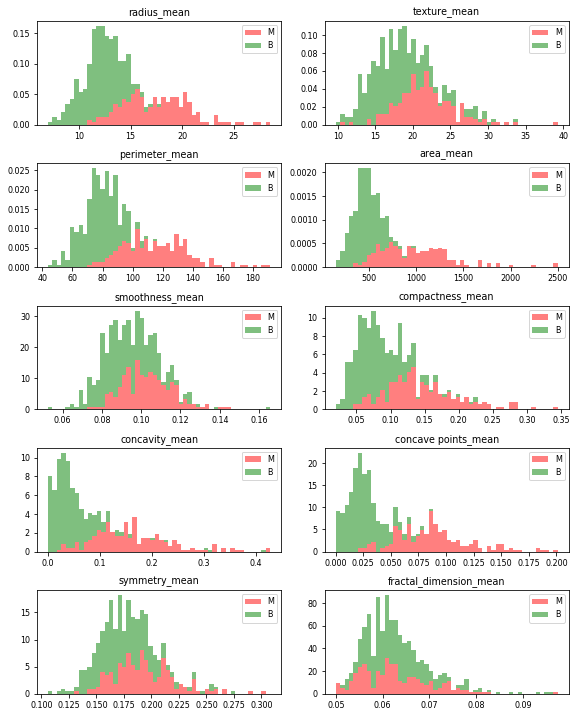

In [16]:
plt.rcParams.update({'font.size': 8})
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(8,10))
axes = axes.ravel()
for idx,ax in enumerate(axes):
    ax.figure
    binwidth= (max(data[features_mean[idx]]) - min(data[features_mean[idx]]))/50
    ax.hist([dataM[features_mean[idx]],dataB[features_mean[idx]]], bins=np.arange(min(data[features_mean[idx]]), max(data[features_mean[idx]]) + binwidth, binwidth) , alpha=0.5,stacked=True, normed = True, label=['M','B'],color=['r','g'])
    ax.legend(loc='upper right')
    ax.set_title(features_mean[idx])
plt.tight_layout()
plt.show()

/usr/local/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning:


The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.



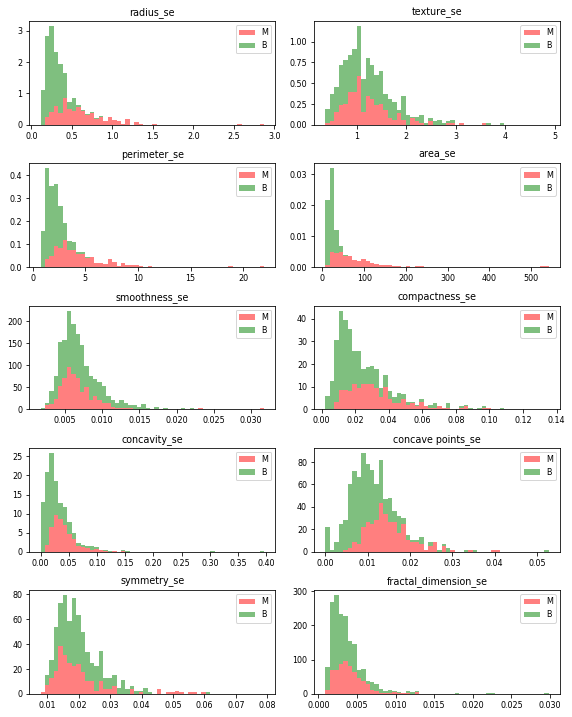

In [17]:
plt.rcParams.update({'font.size': 8})
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(8,10))
axes = axes.ravel()
for idx,ax in enumerate(axes):
    ax.figure
    binwidth= (max(data[features_se[idx]]) - min(data[features_se[idx]]))/50
    ax.hist([dataM[features_se[idx]],dataB[features_se[idx]]], bins=np.arange(min(data[features_se[idx]]), max(data[features_se[idx]]) + binwidth, binwidth) , alpha=0.5,stacked=True, normed = True, label=['M','B'],color=['r','g'])
    ax.legend(loc='upper right')
    ax.set_title(features_se[idx])
plt.tight_layout()
plt.show()

/usr/local/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning:


The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.



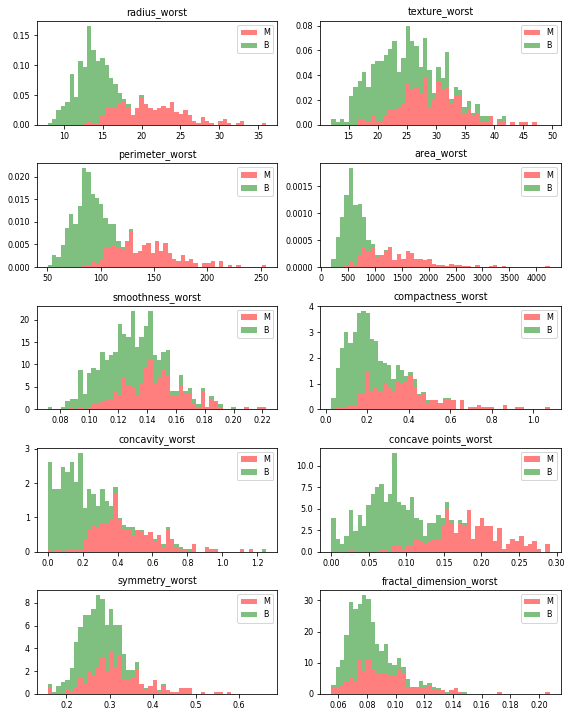

In [18]:
plt.rcParams.update({'font.size': 8})
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(8,10))
axes = axes.ravel()
for idx,ax in enumerate(axes):
    ax.figure
    binwidth= (max(data[features_worst[idx]]) - min(data[features_worst[idx]]))/50
    ax.hist([dataM[features_worst[idx]],dataB[features_worst[idx]]], bins=np.arange(min(data[features_worst[idx]]), max(data[features_worst[idx]]) + binwidth, binwidth) , alpha=0.5,stacked=True, normed = True, label=['M','B'],color=['r','g'])
    ax.legend(loc='upper right')
    ax.set_title(features_worst[idx])
plt.tight_layout()
plt.show()

In [19]:
def plot_distribution(data_select, size_bin) :  
    tmp1 = dataM[data_select]
    tmp2 = dataB[data_select]
    hist_data = [tmp1, tmp2]
    
    group_labels = ['maligno', 'benigno']
    colors = ['#FFD700', '#7EC0EE']

    fig = ff.create_distplot(hist_data, group_labels, colors = colors, show_hist = True, bin_size = size_bin, curve_type='kde')
    
    fig['layout'].update(title = data_select)

    py.iplot(fig, filename = 'Density plot')

In [20]:
#plot distribution 'mean'
plot_distribution('radius_mean', .5)
plot_distribution('texture_mean', .5)
plot_distribution('perimeter_mean', 5)
plot_distribution('area_mean', 10)
plot_distribution('smoothness_mean', .5)
plot_distribution('compactness_mean', .5)
plot_distribution('concavity_mean', .5)
plot_distribution('concave points_mean', .5)
plot_distribution('symmetry_mean', .5)
plot_distribution('fractal_dimension_mean', .5)



In [21]:
plot_distribution('radius_se', .5)
plot_distribution('texture_se', .5)
plot_distribution('perimeter_se', 5)
plot_distribution('area_se', 10)
plot_distribution('smoothness_se', .5)
plot_distribution('compactness_se', .5)
plot_distribution('concavity_se', .5)
plot_distribution('concave points_se', .5)
plot_distribution('symmetry_se', .5)
plot_distribution('fractal_dimension_se', .5)

In [22]:
plot_distribution('radius_worst', .5)
plot_distribution('texture_worst', .5)
plot_distribution('perimeter_worst', 5)
plot_distribution('area_worst', 10)
plot_distribution('smoothness_worst', .5)
plot_distribution('compactness_worst', .5)
plot_distribution('concavity_worst', .5)
plot_distribution('concave points_worst', .5)
plot_distribution('symmetry_worst', .5)
plot_distribution('fractal_dimension_worst', .5)

In [23]:
#Padronização de dados
y = data.diagnosis
stdX = (data - data.mean()) / (data.std())              
data_st = pd.concat([y,stdX.iloc[:,:]])
data_st = pd.melt(data_st,id_vars="diagnosis",
                    var_name="data",
                    value_name='value')

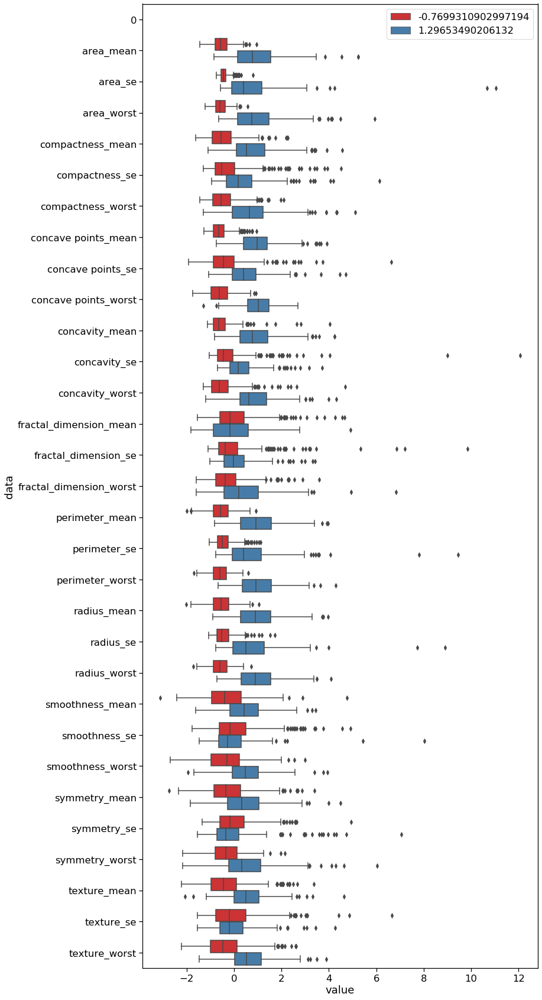

In [24]:
plt.figure(figsize=(12,30))
sns.set_context('notebook', font_scale=1.5)
sns.boxplot(x="value", y="data", hue="diagnosis", data=data_st, palette='Set1')
plt.legend(loc='best');

A partir desse gráfico, é possível identificar que alguns recursos são muito semelhantes, como, por exemplo, perímetro_mean e area_mean e perimeter_se e area_se. Além disso, também podemos observar que algumas características têm medidas diferentes quando o tumor é maligno ou benigno. Exemplos disso são area_mean, radius_mean e concavity_mean. Por outro lado, em características como fractal_dimension_mean e texture_se, a distribuição de tumoers malignos e benignos parece ser semelhante.

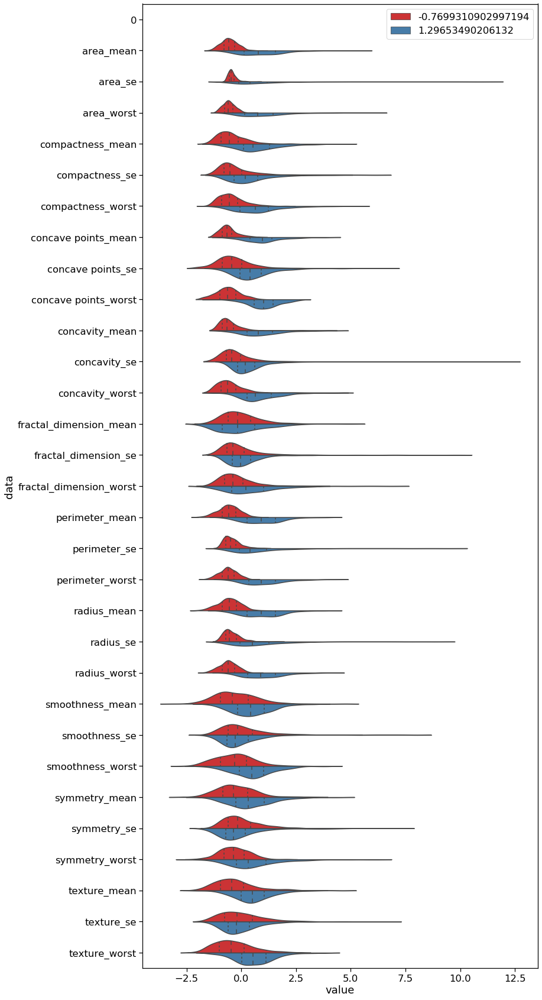

In [25]:
plt.figure(figsize=(12,30))
sns.set_context('notebook', font_scale=1.5)
sns.violinplot(x="value", y="data", hue="diagnosis", data=data_st,split=True, 
               inner="quart", palette='Set1')
plt.legend(loc='best');

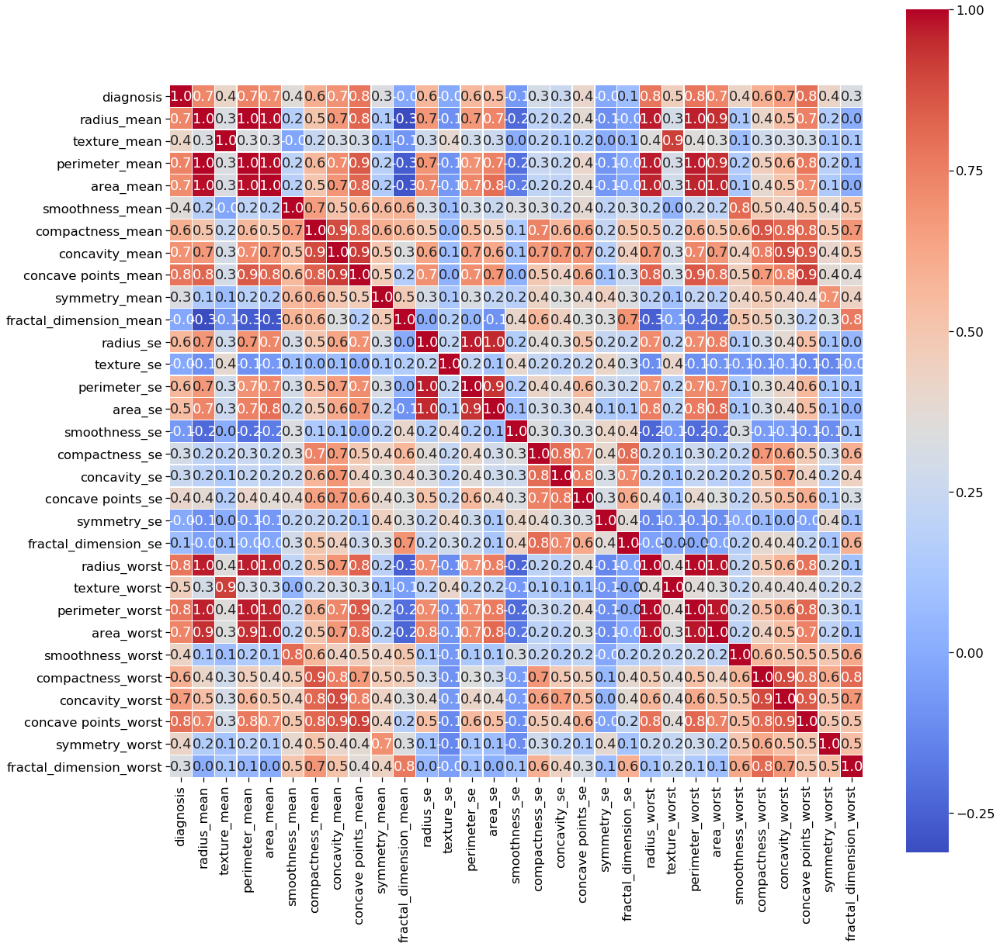

In [26]:
corr = data.corr()
f,ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corr, cbar = True,  square = True, annot = True, fmt= '.1f', 
            xticklabels= True, yticklabels= True
            ,cmap="coolwarm", linewidths=.5, ax=ax);

In [7]:
from collections import Counter

In [8]:
#Modelo
from xgboost import XGBClassifier, plot_importance
# import xgboost as xgb

# from xgboost.sklearn import XGBClassifier

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score

from sklearn.svm import SVR

In [9]:
#dividindo a base

x = data.drop(['diagnosis', 'concave points_mean', 'compactness_se', 'concavity_se', 'concave points_se'], axis=1).values
y = data.diagnosis.values

normalized_X = preprocessing.normalize(x)

# X_train, X_test, y_train, y_test = train_test_split(normalized_X, y, test_size=0.3, random_state=0)

In [10]:
from matplotlib import pyplot

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# import math, soma

In [11]:
def selecao(x, y):
    rus = NearMiss(version=2)
    X_resampled, y_resampled = rus.fit_resample(x, y)
#     print(sorted(Counter(y_resampled).items()))
    
    return [X_resampled, y_resampled]

In [13]:
def neural(x_train, y_train, x_test, y_test):
    
    neural = MLPClassifier(verbose = True,
                           max_iter = 1000,
                           tol = 0.0000010,
                           solver = 'adam',
                           hidden_layer_sizes=(100),
                           activation = 'relu')
    neural.fit(x_train, y_train)
    pred_neural = neural.predict(x_test)
    neural_acc = accuracy_score(y_test, pred_neural)
    neural_cm = confusion_matrix(y_test,pred_neural)
    
    neural_arr = neural.coefs_
    
    return neural_cm, neural_arr

In [14]:
def svm(x_train, y_train, x_test, y_test):
    svc_model = SVC(kernel = "linear", random_state =1)
    svc_model.fit(x_train, y_train)
    pred_svm = svc_model.predict(x_test)
    svm_acc = accuracy_score(y_test, pred_svm)
    svm_cm = confusion_matrix(y_test,pred_svm)
    
    svm_arr = svc_model.coef_

    
#     print(cm)
    
    return svm_cm, svm_arr

In [21]:
def xgbc(x_train, y_train, x_test, y_test, n_fold):
    classifier = XGBClassifier( learning_rate =0.1,
     n_estimators=1000,
     max_depth=5,
     min_child_weight=1,
     gamma=0,
     subsample=0.8,
     colsample_bytree=0.8,
     objective= 'binary:logistic',
     eta=0.1,
     nthread=4,
     scale_pos_weight=1,
     seed=42,
     nfold=n_fold,
     #early_stopping=early_stopping,
     metrics={'mae'})
    classifier.fit(x_train, y_train)
    pred_xgb = classifier.predict(x_test)
    xgb_acc = accuracy_score(y_test, pred_xgb)
    cm = confusion_matrix(y_test,pred_xgb)
    
    arr = classifier.feature_importances_#o probelma está aqui
    
    return cm, arr




In [55]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

matrix_confusion = []
contador = 0
arrMedia = []
variancia = []
contadorVariancia = 0

for i in range(30):
    for train_index, test_index in kf.split(x, y):
        respSele = selecao(x[train_index], y[train_index])
        respXgbc = neural(respSele[0], respSele[1], x[test_index], y[test_index])
        
        matrix_confusion.append(respXgbc[0])
        result = sum(matrix_confusion)

        arrMedia.append((result[0][0] + result[1][1])/(result[0][0] + result[0][1] + result[1][0] + result[1][1]))
        
        contador +=1
        
soma = sum(arrMedia)/contador
media = np.mean(soma)

for i in range(len(arrMedia)):
    variancia.append(abs(media - arrMedia[i]))
    contadorVariancia += 1
    
desvio_padrao = (sum(variancia)/contadorVariancia)


print("Matrix ",sum(matrix_confusion))
print("media ", media)
print("desvio padrão ", desvio_padrao)
print("Accuracy",(result[0][0] + result[1][1])/(result[0][0] + result[0][1] + result[1][0] + result[1][1]))
print("precision",result[1][1]/(result[1][1] + result[0][1]))
print("recall",result[1][1]/(result[1][1] + result[1][0]))

Iteration 1, loss = 2.16642019
Iteration 2, loss = 1.96630742
Iteration 3, loss = 1.03362488
Iteration 4, loss = 1.37476946
Iteration 5, loss = 0.87628513
Iteration 6, loss = 0.86736396
Iteration 7, loss = 0.88882515
Iteration 8, loss = 0.66313327
Iteration 9, loss = 0.73769778
Iteration 10, loss = 0.54995068
Iteration 11, loss = 0.55732248
Iteration 12, loss = 0.47707731
Iteration 13, loss = 0.47095346
Iteration 14, loss = 0.46607378
Iteration 15, loss = 0.43584394
Iteration 16, loss = 0.45006723
Iteration 17, loss = 0.41945532
Iteration 18, loss = 0.40425845
Iteration 19, loss = 0.39717347
Iteration 20, loss = 0.39796348
Iteration 21, loss = 0.37594825
Iteration 22, loss = 0.36860611
Iteration 23, loss = 0.36220389
Iteration 24, loss = 0.36128339
Iteration 25, loss = 0.35206164
Iteration 26, loss = 0.34346413
Iteration 27, loss = 0.34817170
Iteration 28, loss = 0.33407252
Iteration 29, loss = 0.33469611
Iteration 30, loss = 0.33246559
Iteration 31, loss = 0.31463384
Iteration 32, los

Iteration 83, loss = 0.41255710
Iteration 84, loss = 0.40940330
Iteration 85, loss = 0.40732825
Iteration 86, loss = 0.40558643
Iteration 87, loss = 0.40319536
Iteration 88, loss = 0.40205645
Iteration 89, loss = 0.39938986
Iteration 90, loss = 0.39732136
Iteration 91, loss = 0.39508999
Iteration 92, loss = 0.39308192
Iteration 93, loss = 0.39364380
Iteration 94, loss = 0.39071933
Iteration 95, loss = 0.38710724
Iteration 96, loss = 0.38495605
Iteration 97, loss = 0.38260145
Iteration 98, loss = 0.38061162
Iteration 99, loss = 0.37902541
Iteration 100, loss = 0.37777646
Iteration 101, loss = 0.37431062
Iteration 102, loss = 0.37572983
Iteration 103, loss = 0.37235400
Iteration 104, loss = 0.36815918
Iteration 105, loss = 0.36652887
Iteration 106, loss = 0.36324422
Iteration 107, loss = 0.36021276
Iteration 108, loss = 0.35856293
Iteration 109, loss = 0.35502275
Iteration 110, loss = 0.35271716
Iteration 111, loss = 0.35098692
Iteration 112, loss = 0.34662104
Iteration 113, loss = 0.343

Iteration 104, loss = 0.45598556
Iteration 105, loss = 0.45143443
Iteration 106, loss = 0.45315705
Iteration 107, loss = 0.44660866
Iteration 108, loss = 0.44538475
Iteration 109, loss = 0.44066544
Iteration 110, loss = 0.43668264
Iteration 111, loss = 0.43585665
Iteration 112, loss = 0.43095956
Iteration 113, loss = 0.42878982
Iteration 114, loss = 0.42568629
Iteration 115, loss = 0.42199364
Iteration 116, loss = 0.42829309
Iteration 117, loss = 0.42346895
Iteration 118, loss = 0.42196218
Iteration 119, loss = 0.41547730
Iteration 120, loss = 0.41505504
Iteration 121, loss = 0.40510224
Iteration 122, loss = 0.40268676
Iteration 123, loss = 0.40255478
Iteration 124, loss = 0.39543526
Iteration 125, loss = 0.39584442
Iteration 126, loss = 0.39304126
Iteration 127, loss = 0.39162690
Iteration 128, loss = 0.38768284
Iteration 129, loss = 0.38562536
Iteration 130, loss = 0.38259101
Iteration 131, loss = 0.38054983
Iteration 132, loss = 0.37256112
Iteration 133, loss = 0.37876545
Iteration 

Iteration 83, loss = 0.29159879
Iteration 84, loss = 0.29219629
Iteration 85, loss = 0.28853282
Iteration 86, loss = 0.28706612
Iteration 87, loss = 0.28608184
Iteration 88, loss = 0.28520444
Iteration 89, loss = 0.28328129
Iteration 90, loss = 0.28588041
Iteration 91, loss = 0.28227993
Iteration 92, loss = 0.28248389
Iteration 93, loss = 0.27878749
Iteration 94, loss = 0.27714491
Iteration 95, loss = 0.27762380
Iteration 96, loss = 0.27513683
Iteration 97, loss = 0.27440649
Iteration 98, loss = 0.27166073
Iteration 99, loss = 0.27009701
Iteration 100, loss = 0.27081301
Iteration 101, loss = 0.26772083
Iteration 102, loss = 0.26652103
Iteration 103, loss = 0.26724599
Iteration 104, loss = 0.26553005
Iteration 105, loss = 0.26360779
Iteration 106, loss = 0.26163986
Iteration 107, loss = 0.26293348
Iteration 108, loss = 0.25972892
Iteration 109, loss = 0.25951517
Iteration 110, loss = 0.25955608
Iteration 111, loss = 0.25703004
Iteration 112, loss = 0.25918966
Iteration 113, loss = 0.255

Iteration 83, loss = 0.36280679
Iteration 84, loss = 0.36194413
Iteration 85, loss = 0.35994707
Iteration 86, loss = 0.35950760
Iteration 87, loss = 0.35591863
Iteration 88, loss = 0.35558328
Iteration 89, loss = 0.35255725
Iteration 90, loss = 0.35074195
Iteration 91, loss = 0.35109267
Iteration 92, loss = 0.34681615
Iteration 93, loss = 0.34509775
Iteration 94, loss = 0.34523034
Iteration 95, loss = 0.34159325
Iteration 96, loss = 0.34171587
Iteration 97, loss = 0.33902452
Iteration 98, loss = 0.33609845
Iteration 99, loss = 0.33462454
Iteration 100, loss = 0.33262456
Iteration 101, loss = 0.33127088
Iteration 102, loss = 0.33024076
Iteration 103, loss = 0.32843741
Iteration 104, loss = 0.32774366
Iteration 105, loss = 0.32733869
Iteration 106, loss = 0.32203753
Iteration 107, loss = 0.32224751
Iteration 108, loss = 0.31943753
Iteration 109, loss = 0.32526865
Iteration 110, loss = 0.32954405
Iteration 111, loss = 0.31732716
Iteration 112, loss = 0.31269432
Iteration 113, loss = 0.312

Iteration 336, loss = 0.15233905
Iteration 337, loss = 0.15164073
Iteration 338, loss = 0.15190723
Iteration 339, loss = 0.15154805
Iteration 340, loss = 0.15140353
Iteration 341, loss = 0.15031780
Iteration 342, loss = 0.15282724
Iteration 343, loss = 0.15057294
Iteration 344, loss = 0.14948137
Iteration 345, loss = 0.15639364
Iteration 346, loss = 0.14929515
Iteration 347, loss = 0.15296431
Iteration 348, loss = 0.15148320
Iteration 349, loss = 0.14795252
Iteration 350, loss = 0.15343189
Iteration 351, loss = 0.14842493
Iteration 352, loss = 0.14868696
Iteration 353, loss = 0.14717029
Iteration 354, loss = 0.14760669
Iteration 355, loss = 0.14826480
Iteration 356, loss = 0.14860108
Iteration 357, loss = 0.14624797
Iteration 358, loss = 0.14821496
Iteration 359, loss = 0.14534805
Iteration 360, loss = 0.14609166
Iteration 361, loss = 0.14591056
Iteration 362, loss = 0.14907127
Iteration 363, loss = 0.14598561
Iteration 364, loss = 0.14978116
Iteration 365, loss = 0.14393092
Iteration 

Iteration 108, loss = 0.26916712
Iteration 109, loss = 0.26457294
Iteration 110, loss = 0.25533736
Iteration 111, loss = 0.25586671
Iteration 112, loss = 0.25006592
Iteration 113, loss = 0.24741922
Iteration 114, loss = 0.23876860
Iteration 115, loss = 0.24090716
Iteration 116, loss = 0.23366899
Iteration 117, loss = 0.23027868
Iteration 118, loss = 0.22808817
Iteration 119, loss = 0.22671393
Iteration 120, loss = 0.22345692
Iteration 121, loss = 0.22129478
Iteration 122, loss = 0.22177408
Iteration 123, loss = 0.21322472
Iteration 124, loss = 0.21653555
Iteration 125, loss = 0.21042546
Iteration 126, loss = 0.20927961
Iteration 127, loss = 0.20917182
Iteration 128, loss = 0.20588192
Iteration 129, loss = 0.20324623
Iteration 130, loss = 0.20278051
Iteration 131, loss = 0.20411608
Iteration 132, loss = 0.19849534
Iteration 133, loss = 0.19655325
Iteration 134, loss = 0.19682173
Iteration 135, loss = 0.19368214
Iteration 136, loss = 0.19418644
Iteration 137, loss = 0.19180166
Iteration 

Iteration 138, loss = 0.21517033
Iteration 139, loss = 0.19458325
Iteration 140, loss = 0.21343387
Iteration 141, loss = 0.20505370
Iteration 142, loss = 0.19418917
Iteration 143, loss = 0.17986863
Iteration 144, loss = 0.19230245
Iteration 145, loss = 0.18603365
Iteration 146, loss = 0.18314743
Iteration 147, loss = 0.18692778
Iteration 148, loss = 0.18024248
Iteration 149, loss = 0.18805228
Iteration 150, loss = 0.18018172
Iteration 151, loss = 0.18459082
Iteration 152, loss = 0.17667824
Iteration 153, loss = 0.18087587
Iteration 154, loss = 0.17460122
Iteration 155, loss = 0.17462444
Iteration 156, loss = 0.17469918
Iteration 157, loss = 0.17245344
Iteration 158, loss = 0.17798314
Iteration 159, loss = 0.17175033
Iteration 160, loss = 0.17073610
Iteration 161, loss = 0.17144585
Iteration 162, loss = 0.17215256
Iteration 163, loss = 0.17339473
Iteration 164, loss = 0.16715720
Iteration 165, loss = 0.17240476
Iteration 166, loss = 0.17136451
Iteration 167, loss = 0.17516071
Iteration 

Iteration 245, loss = 0.18825827
Iteration 246, loss = 0.18924550
Iteration 247, loss = 0.18378946
Iteration 248, loss = 0.19865593
Iteration 249, loss = 0.20350632
Iteration 250, loss = 0.19295121
Iteration 251, loss = 0.19222743
Iteration 252, loss = 0.17990902
Iteration 253, loss = 0.19129101
Iteration 254, loss = 0.17675943
Iteration 255, loss = 0.18288475
Iteration 256, loss = 0.17449631
Iteration 257, loss = 0.18244481
Iteration 258, loss = 0.17458805
Iteration 259, loss = 0.17508597
Iteration 260, loss = 0.17366458
Iteration 261, loss = 0.17400907
Iteration 262, loss = 0.17279780
Iteration 263, loss = 0.17281255
Iteration 264, loss = 0.17436622
Iteration 265, loss = 0.17722787
Iteration 266, loss = 0.17054713
Iteration 267, loss = 0.17650097
Iteration 268, loss = 0.17001471
Iteration 269, loss = 0.17333265
Iteration 270, loss = 0.17002674
Iteration 271, loss = 0.17007066
Iteration 272, loss = 0.16832334
Iteration 273, loss = 0.16706712
Iteration 274, loss = 0.16810439
Iteration 

Iteration 151, loss = 0.21470687
Iteration 152, loss = 0.20665498
Iteration 153, loss = 0.22184047
Iteration 154, loss = 0.20253796
Iteration 155, loss = 0.21503088
Iteration 156, loss = 0.22549463
Iteration 157, loss = 0.21570026
Iteration 158, loss = 0.21957992
Iteration 159, loss = 0.21168079
Iteration 160, loss = 0.21018931
Iteration 161, loss = 0.20315112
Iteration 162, loss = 0.20629129
Iteration 163, loss = 0.21500308
Iteration 164, loss = 0.21155239
Iteration 165, loss = 0.20205954
Iteration 166, loss = 0.20628044
Iteration 167, loss = 0.19821794
Iteration 168, loss = 0.20094157
Iteration 169, loss = 0.20317370
Iteration 170, loss = 0.19677034
Iteration 171, loss = 0.20069958
Iteration 172, loss = 0.19927218
Iteration 173, loss = 0.20157783
Iteration 174, loss = 0.19667820
Iteration 175, loss = 0.19814046
Iteration 176, loss = 0.19508738
Iteration 177, loss = 0.20528996
Iteration 178, loss = 0.20019188
Iteration 179, loss = 0.19929041
Iteration 180, loss = 0.19717303
Iteration 

Iteration 126, loss = 0.22543281
Iteration 127, loss = 0.22517721
Iteration 128, loss = 0.22524160
Iteration 129, loss = 0.22424617
Iteration 130, loss = 0.22481832
Iteration 131, loss = 0.22403170
Iteration 132, loss = 0.22310857
Iteration 133, loss = 0.22312065
Iteration 134, loss = 0.22500133
Iteration 135, loss = 0.22248181
Iteration 136, loss = 0.22382043
Iteration 137, loss = 0.22168755
Iteration 138, loss = 0.22239018
Iteration 139, loss = 0.22076558
Iteration 140, loss = 0.22344649
Iteration 141, loss = 0.22130327
Iteration 142, loss = 0.22144083
Iteration 143, loss = 0.21944121
Iteration 144, loss = 0.21985370
Iteration 145, loss = 0.21932338
Iteration 146, loss = 0.21973178
Iteration 147, loss = 0.21899586
Iteration 148, loss = 0.21808145
Iteration 149, loss = 0.21840683
Iteration 150, loss = 0.21771089
Iteration 151, loss = 0.21783689
Iteration 152, loss = 0.21753297
Iteration 153, loss = 0.21710546
Iteration 154, loss = 0.21781091
Iteration 155, loss = 0.21655623
Iteration 

Iteration 57, loss = 0.40057884
Iteration 58, loss = 0.39215307
Iteration 59, loss = 0.39085230
Iteration 60, loss = 0.38564261
Iteration 61, loss = 0.38104456
Iteration 62, loss = 0.37905581
Iteration 63, loss = 0.37772049
Iteration 64, loss = 0.37413052
Iteration 65, loss = 0.36657092
Iteration 66, loss = 0.36659712
Iteration 67, loss = 0.36077990
Iteration 68, loss = 0.35942827
Iteration 69, loss = 0.35410214
Iteration 70, loss = 0.35284834
Iteration 71, loss = 0.35007801
Iteration 72, loss = 0.34598460
Iteration 73, loss = 0.34306240
Iteration 74, loss = 0.33984012
Iteration 75, loss = 0.33744682
Iteration 76, loss = 0.33550790
Iteration 77, loss = 0.33341879
Iteration 78, loss = 0.33025071
Iteration 79, loss = 0.32656555
Iteration 80, loss = 0.32574051
Iteration 81, loss = 0.32441714
Iteration 82, loss = 0.32259431
Iteration 83, loss = 0.32209124
Iteration 84, loss = 0.31503909
Iteration 85, loss = 0.31570448
Iteration 86, loss = 0.31562685
Iteration 87, loss = 0.31154562
Iteratio

Iteration 95, loss = 0.28895009
Iteration 96, loss = 0.28455695
Iteration 97, loss = 0.28193320
Iteration 98, loss = 0.28555257
Iteration 99, loss = 0.27837162
Iteration 100, loss = 0.27572335
Iteration 101, loss = 0.27579404
Iteration 102, loss = 0.27307008
Iteration 103, loss = 0.27143696
Iteration 104, loss = 0.27068985
Iteration 105, loss = 0.26957278
Iteration 106, loss = 0.26653764
Iteration 107, loss = 0.26572128
Iteration 108, loss = 0.26270536
Iteration 109, loss = 0.26118548
Iteration 110, loss = 0.26000217
Iteration 111, loss = 0.25825279
Iteration 112, loss = 0.25682508
Iteration 113, loss = 0.25694273
Iteration 114, loss = 0.25642462
Iteration 115, loss = 0.25351589
Iteration 116, loss = 0.25065780
Iteration 117, loss = 0.25008971
Iteration 118, loss = 0.25227109
Iteration 119, loss = 0.24795897
Iteration 120, loss = 0.24566790
Iteration 121, loss = 0.24625680
Iteration 122, loss = 0.24727748
Iteration 123, loss = 0.24590088
Iteration 124, loss = 0.23999180
Iteration 125, 

Iteration 66, loss = 0.29894653
Iteration 67, loss = 0.28942307
Iteration 68, loss = 0.28540200
Iteration 69, loss = 0.27965390
Iteration 70, loss = 0.27596612
Iteration 71, loss = 0.27273994
Iteration 72, loss = 0.26776885
Iteration 73, loss = 0.27112007
Iteration 74, loss = 0.25984025
Iteration 75, loss = 0.25726549
Iteration 76, loss = 0.25406208
Iteration 77, loss = 0.25109102
Iteration 78, loss = 0.25010552
Iteration 79, loss = 0.24563735
Iteration 80, loss = 0.24038625
Iteration 81, loss = 0.23888623
Iteration 82, loss = 0.23600771
Iteration 83, loss = 0.23300908
Iteration 84, loss = 0.23218519
Iteration 85, loss = 0.23057442
Iteration 86, loss = 0.22675234
Iteration 87, loss = 0.22512363
Iteration 88, loss = 0.22302846
Iteration 89, loss = 0.21927370
Iteration 90, loss = 0.22192748
Iteration 91, loss = 0.21710826
Iteration 92, loss = 0.21437843
Iteration 93, loss = 0.21312961
Iteration 94, loss = 0.20958171
Iteration 95, loss = 0.20683945
Iteration 96, loss = 0.21083354
Iteratio

Iteration 174, loss = 0.25097803
Iteration 175, loss = 0.25455403
Iteration 176, loss = 0.24294280
Iteration 177, loss = 0.25480227
Iteration 178, loss = 0.23761705
Iteration 179, loss = 0.25075689
Iteration 180, loss = 0.24647117
Iteration 181, loss = 0.24419519
Iteration 182, loss = 0.24078000
Iteration 183, loss = 0.24720044
Iteration 184, loss = 0.23247995
Iteration 185, loss = 0.24275593
Iteration 186, loss = 0.22898778
Iteration 187, loss = 0.24152260
Iteration 188, loss = 0.23544508
Iteration 189, loss = 0.23469675
Iteration 190, loss = 0.23645095
Iteration 191, loss = 0.22636808
Iteration 192, loss = 0.23343635
Iteration 193, loss = 0.23039105
Iteration 194, loss = 0.22940215
Iteration 195, loss = 0.22618845
Iteration 196, loss = 0.22292763
Iteration 197, loss = 0.22399474
Iteration 198, loss = 0.22135062
Iteration 199, loss = 0.22077870
Iteration 200, loss = 0.21984057
Iteration 201, loss = 0.21934354
Iteration 202, loss = 0.21842109
Iteration 203, loss = 0.21934723
Iteration 

Iteration 113, loss = 0.21733198
Iteration 114, loss = 0.21139335
Iteration 115, loss = 0.21099590
Iteration 116, loss = 0.20830876
Iteration 117, loss = 0.20737336
Iteration 118, loss = 0.20976508
Iteration 119, loss = 0.20615590
Iteration 120, loss = 0.20481569
Iteration 121, loss = 0.20358752
Iteration 122, loss = 0.20505486
Iteration 123, loss = 0.20172461
Iteration 124, loss = 0.20385544
Iteration 125, loss = 0.19998336
Iteration 126, loss = 0.20193820
Iteration 127, loss = 0.20016470
Iteration 128, loss = 0.19836390
Iteration 129, loss = 0.19701467
Iteration 130, loss = 0.19453334
Iteration 131, loss = 0.19429481
Iteration 132, loss = 0.19333108
Iteration 133, loss = 0.19315126
Iteration 134, loss = 0.19555409
Iteration 135, loss = 0.19117990
Iteration 136, loss = 0.19122149
Iteration 137, loss = 0.18790280
Iteration 138, loss = 0.19101535
Iteration 139, loss = 0.19072409
Iteration 140, loss = 0.18641383
Iteration 141, loss = 0.18864703
Iteration 142, loss = 0.18999301
Iteration 

Iteration 96, loss = 0.21048987
Iteration 97, loss = 0.20963815
Iteration 98, loss = 0.21062387
Iteration 99, loss = 0.21370514
Iteration 100, loss = 0.21306702
Iteration 101, loss = 0.21387052
Iteration 102, loss = 0.20909488
Iteration 103, loss = 0.20564126
Iteration 104, loss = 0.20673553
Iteration 105, loss = 0.20439834
Iteration 106, loss = 0.21519516
Iteration 107, loss = 0.20275759
Iteration 108, loss = 0.21524786
Iteration 109, loss = 0.20933276
Iteration 110, loss = 0.21713538
Iteration 111, loss = 0.20633787
Iteration 112, loss = 0.20974200
Iteration 113, loss = 0.20228944
Iteration 114, loss = 0.20260823
Iteration 115, loss = 0.20205748
Iteration 116, loss = 0.20095342
Iteration 117, loss = 0.20088480
Iteration 118, loss = 0.20030382
Iteration 119, loss = 0.19911503
Iteration 120, loss = 0.19868977
Iteration 121, loss = 0.20082635
Iteration 122, loss = 0.19748847
Iteration 123, loss = 0.19945296
Iteration 124, loss = 0.19613665
Iteration 125, loss = 0.19877922
Iteration 126,

Iteration 222, loss = 0.19827429
Iteration 223, loss = 0.19872518
Iteration 224, loss = 0.18964902
Iteration 225, loss = 0.19998830
Iteration 226, loss = 0.20159574
Iteration 227, loss = 0.18514341
Iteration 228, loss = 0.20028894
Iteration 229, loss = 0.19129022
Iteration 230, loss = 0.18814869
Iteration 231, loss = 0.18591464
Iteration 232, loss = 0.18574623
Iteration 233, loss = 0.18996784
Iteration 234, loss = 0.18362406
Iteration 235, loss = 0.18741326
Iteration 236, loss = 0.18554615
Iteration 237, loss = 0.18401123
Iteration 238, loss = 0.18946820
Iteration 239, loss = 0.18234963
Iteration 240, loss = 0.18299125
Iteration 241, loss = 0.18170078
Iteration 242, loss = 0.18030041
Iteration 243, loss = 0.18357332
Iteration 244, loss = 0.18121195
Iteration 245, loss = 0.18040236
Iteration 246, loss = 0.18177163
Iteration 247, loss = 0.18297496
Iteration 248, loss = 0.18570985
Iteration 249, loss = 0.17656422
Iteration 250, loss = 0.17974643
Iteration 251, loss = 0.18529966
Iteration 

Iteration 215, loss = 0.26430207
Iteration 216, loss = 0.25242589
Iteration 217, loss = 0.26263432
Iteration 218, loss = 0.25276192
Iteration 219, loss = 0.25802222
Iteration 220, loss = 0.25203917
Iteration 221, loss = 0.24888034
Iteration 222, loss = 0.24513288
Iteration 223, loss = 0.24705135
Iteration 224, loss = 0.24209096
Iteration 225, loss = 0.24434721
Iteration 226, loss = 0.24284334
Iteration 227, loss = 0.24067952
Iteration 228, loss = 0.24258963
Iteration 229, loss = 0.25614346
Iteration 230, loss = 0.23830893
Iteration 231, loss = 0.23651433
Iteration 232, loss = 0.23302261
Iteration 233, loss = 0.23615818
Iteration 234, loss = 0.22969609
Iteration 235, loss = 0.24617911
Iteration 236, loss = 0.23477251
Iteration 237, loss = 0.23886291
Iteration 238, loss = 0.23035082
Iteration 239, loss = 0.23666666
Iteration 240, loss = 0.22793759
Iteration 241, loss = 0.22446387
Iteration 242, loss = 0.22676861
Iteration 243, loss = 0.22500655
Iteration 244, loss = 0.22063320
Iteration 

Iteration 466, loss = 0.13668974
Iteration 467, loss = 0.14376966
Iteration 468, loss = 0.14554295
Iteration 469, loss = 0.13608754
Iteration 470, loss = 0.13830947
Iteration 471, loss = 0.14626548
Iteration 472, loss = 0.14286443
Iteration 473, loss = 0.14441388
Iteration 474, loss = 0.14644337
Iteration 475, loss = 0.13849935
Iteration 476, loss = 0.13637136
Iteration 477, loss = 0.14573731
Iteration 478, loss = 0.13536931
Iteration 479, loss = 0.13567946
Iteration 480, loss = 0.14434519
Iteration 481, loss = 0.13936181
Iteration 482, loss = 0.13462939
Iteration 483, loss = 0.14042176
Iteration 484, loss = 0.13242810
Iteration 485, loss = 0.13213758
Iteration 486, loss = 0.13658827
Iteration 487, loss = 0.13109492
Iteration 488, loss = 0.13778613
Iteration 489, loss = 0.13091836
Iteration 490, loss = 0.13999546
Iteration 491, loss = 0.13703991
Iteration 492, loss = 0.13239954
Iteration 493, loss = 0.13597853
Iteration 494, loss = 0.13836785
Iteration 495, loss = 0.13862162
Iteration 

Iteration 86, loss = 0.34926558
Iteration 87, loss = 0.34624921
Iteration 88, loss = 0.34353762
Iteration 89, loss = 0.34101939
Iteration 90, loss = 0.33863178
Iteration 91, loss = 0.33629231
Iteration 92, loss = 0.33402643
Iteration 93, loss = 0.33167807
Iteration 94, loss = 0.32936739
Iteration 95, loss = 0.32728066
Iteration 96, loss = 0.32524906
Iteration 97, loss = 0.32530695
Iteration 98, loss = 0.32124390
Iteration 99, loss = 0.32050741
Iteration 100, loss = 0.31778492
Iteration 101, loss = 0.31608936
Iteration 102, loss = 0.31629547
Iteration 103, loss = 0.31310627
Iteration 104, loss = 0.31272746
Iteration 105, loss = 0.31012615
Iteration 106, loss = 0.30953639
Iteration 107, loss = 0.30464400
Iteration 108, loss = 0.30350693
Iteration 109, loss = 0.30187378
Iteration 110, loss = 0.30105764
Iteration 111, loss = 0.29806617
Iteration 112, loss = 0.29846937
Iteration 113, loss = 0.29768682
Iteration 114, loss = 0.29369847
Iteration 115, loss = 0.29246817
Iteration 116, loss = 0.

Iteration 338, loss = 0.16271383
Iteration 339, loss = 0.16283570
Iteration 340, loss = 0.16201111
Iteration 341, loss = 0.16369001
Iteration 342, loss = 0.16189364
Iteration 343, loss = 0.16106926
Iteration 344, loss = 0.16505195
Iteration 345, loss = 0.16132667
Iteration 346, loss = 0.16372156
Iteration 347, loss = 0.16217224
Iteration 348, loss = 0.16458524
Iteration 349, loss = 0.15956617
Iteration 350, loss = 0.16069679
Iteration 351, loss = 0.15934193
Iteration 352, loss = 0.15944121
Iteration 353, loss = 0.15932483
Iteration 354, loss = 0.15948059
Iteration 355, loss = 0.15954254
Iteration 356, loss = 0.15899176
Iteration 357, loss = 0.15970734
Iteration 358, loss = 0.15790260
Iteration 359, loss = 0.16565307
Iteration 360, loss = 0.17147307
Iteration 361, loss = 0.16405110
Iteration 362, loss = 0.16162307
Iteration 363, loss = 0.16103456
Iteration 364, loss = 0.15923417
Iteration 365, loss = 0.15831751
Iteration 366, loss = 0.15792779
Iteration 367, loss = 0.16321332
Iteration 

Iteration 295, loss = 0.16877729
Iteration 296, loss = 0.17875742
Iteration 297, loss = 0.17379924
Iteration 298, loss = 0.17383468
Iteration 299, loss = 0.17226541
Iteration 300, loss = 0.17108498
Iteration 301, loss = 0.17106207
Iteration 302, loss = 0.16940853
Iteration 303, loss = 0.17119466
Iteration 304, loss = 0.16930514
Iteration 305, loss = 0.16946664
Iteration 306, loss = 0.16948107
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.75077297
Iteration 2, loss = 1.92771778
Iteration 3, loss = 1.87328440
Iteration 4, loss = 0.69415474
Iteration 5, loss = 1.11901761
Iteration 6, loss = 0.49699689
Iteration 7, loss = 0.77326195
Iteration 8, loss = 0.36299058
Iteration 9, loss = 0.53844733
Iteration 10, loss = 0.43266364
Iteration 11, loss = 0.36649638
Iteration 12, loss = 0.39983806
Iteration 13, loss = 0.27752527
Iteration 14, loss = 0.36573066
Iteration 15, loss = 0.28641366
Iteration 16, loss = 0.30924358
Iteration 1

Iteration 191, loss = 0.25368657
Iteration 192, loss = 0.25153098
Iteration 193, loss = 0.24712110
Iteration 194, loss = 0.24556212
Iteration 195, loss = 0.24252084
Iteration 196, loss = 0.24066319
Iteration 197, loss = 0.23817282
Iteration 198, loss = 0.23553046
Iteration 199, loss = 0.23516065
Iteration 200, loss = 0.23152725
Iteration 201, loss = 0.22998889
Iteration 202, loss = 0.22892528
Iteration 203, loss = 0.22497467
Iteration 204, loss = 0.22314172
Iteration 205, loss = 0.22205733
Iteration 206, loss = 0.22932071
Iteration 207, loss = 0.21791413
Iteration 208, loss = 0.21839467
Iteration 209, loss = 0.21865799
Iteration 210, loss = 0.21465544
Iteration 211, loss = 0.21444920
Iteration 212, loss = 0.21654163
Iteration 213, loss = 0.21467309
Iteration 214, loss = 0.21123133
Iteration 215, loss = 0.20898317
Iteration 216, loss = 0.20390589
Iteration 217, loss = 0.20370179
Iteration 218, loss = 0.20670893
Iteration 219, loss = 0.20117147
Iteration 220, loss = 0.20185112
Iteration 

Iteration 123, loss = 0.26211856
Iteration 124, loss = 0.25756934
Iteration 125, loss = 0.25672146
Iteration 126, loss = 0.25402004
Iteration 127, loss = 0.25379988
Iteration 128, loss = 0.25624120
Iteration 129, loss = 0.25035628
Iteration 130, loss = 0.25332794
Iteration 131, loss = 0.24801236
Iteration 132, loss = 0.24850900
Iteration 133, loss = 0.24411779
Iteration 134, loss = 0.24513778
Iteration 135, loss = 0.24409491
Iteration 136, loss = 0.24517406
Iteration 137, loss = 0.23898103
Iteration 138, loss = 0.23895264
Iteration 139, loss = 0.23608166
Iteration 140, loss = 0.23520773
Iteration 141, loss = 0.23513283
Iteration 142, loss = 0.23162899
Iteration 143, loss = 0.23101148
Iteration 144, loss = 0.23094356
Iteration 145, loss = 0.22729833
Iteration 146, loss = 0.22869642
Iteration 147, loss = 0.22763887
Iteration 148, loss = 0.23136089
Iteration 149, loss = 0.22645129
Iteration 150, loss = 0.22199186
Iteration 151, loss = 0.22407566
Iteration 152, loss = 0.21947699
Iteration 

Iteration 89, loss = 0.18691248
Iteration 90, loss = 0.18660380
Iteration 91, loss = 0.18799428
Iteration 92, loss = 0.18569622
Iteration 93, loss = 0.18673122
Iteration 94, loss = 0.18842233
Iteration 95, loss = 0.18608237
Iteration 96, loss = 0.18515183
Iteration 97, loss = 0.18776056
Iteration 98, loss = 0.18701388
Iteration 99, loss = 0.18580626
Iteration 100, loss = 0.18415594
Iteration 101, loss = 0.18547938
Iteration 102, loss = 0.18487176
Iteration 103, loss = 0.18317608
Iteration 104, loss = 0.18673114
Iteration 105, loss = 0.18551709
Iteration 106, loss = 0.18428804
Iteration 107, loss = 0.18244630
Iteration 108, loss = 0.18266015
Iteration 109, loss = 0.18394013
Iteration 110, loss = 0.18234280
Iteration 111, loss = 0.18174560
Iteration 112, loss = 0.18144293
Iteration 113, loss = 0.18115325
Iteration 114, loss = 0.18098346
Iteration 115, loss = 0.18169786
Iteration 116, loss = 0.18081621
Iteration 117, loss = 0.18771472
Iteration 118, loss = 0.18101094
Iteration 119, loss =

Iteration 184, loss = 0.17668788
Iteration 185, loss = 0.18068548
Iteration 186, loss = 0.17968452
Iteration 187, loss = 0.18533926
Iteration 188, loss = 0.17587560
Iteration 189, loss = 0.18589785
Iteration 190, loss = 0.18107059
Iteration 191, loss = 0.18217195
Iteration 192, loss = 0.17822219
Iteration 193, loss = 0.18445497
Iteration 194, loss = 0.17663915
Iteration 195, loss = 0.18124643
Iteration 196, loss = 0.17743410
Iteration 197, loss = 0.17919573
Iteration 198, loss = 0.16760588
Iteration 199, loss = 0.17970356
Iteration 200, loss = 0.17764291
Iteration 201, loss = 0.16694828
Iteration 202, loss = 0.17863146
Iteration 203, loss = 0.18570718
Iteration 204, loss = 0.19153694
Iteration 205, loss = 0.17302368
Iteration 206, loss = 0.18101270
Iteration 207, loss = 0.17918084
Iteration 208, loss = 0.18537970
Iteration 209, loss = 0.20213239
Iteration 210, loss = 0.17775091
Iteration 211, loss = 0.17565171
Iteration 212, loss = 0.17303574
Training loss did not improve more than tol

Iteration 92, loss = 0.19568531
Iteration 93, loss = 0.19873987
Iteration 94, loss = 0.19245814
Iteration 95, loss = 0.20056202
Iteration 96, loss = 0.22863190
Iteration 97, loss = 0.20064224
Iteration 98, loss = 0.20516648
Iteration 99, loss = 0.19129139
Iteration 100, loss = 0.19367937
Iteration 101, loss = 0.19792473
Iteration 102, loss = 0.18638157
Iteration 103, loss = 0.18619940
Iteration 104, loss = 0.19169794
Iteration 105, loss = 0.18425726
Iteration 106, loss = 0.18640471
Iteration 107, loss = 0.18694923
Iteration 108, loss = 0.18492106
Iteration 109, loss = 0.18127278
Iteration 110, loss = 0.18693356
Iteration 111, loss = 0.18817514
Iteration 112, loss = 0.18053452
Iteration 113, loss = 0.18906294
Iteration 114, loss = 0.19344904
Iteration 115, loss = 0.20722292
Iteration 116, loss = 0.18156500
Iteration 117, loss = 0.20427743
Iteration 118, loss = 0.18682612
Iteration 119, loss = 0.19262604
Iteration 120, loss = 0.18237820
Iteration 121, loss = 0.18526784
Iteration 122, los

Iteration 68, loss = 0.58920782
Iteration 69, loss = 0.58404150
Iteration 70, loss = 0.57941519
Iteration 71, loss = 0.57330362
Iteration 72, loss = 0.56912265
Iteration 73, loss = 0.56656521
Iteration 74, loss = 0.55719448
Iteration 75, loss = 0.56091464
Iteration 76, loss = 0.54999645
Iteration 77, loss = 0.54357092
Iteration 78, loss = 0.54401515
Iteration 79, loss = 0.53671967
Iteration 80, loss = 0.53452676
Iteration 81, loss = 0.52520391
Iteration 82, loss = 0.52232680
Iteration 83, loss = 0.52289575
Iteration 84, loss = 0.51087085
Iteration 85, loss = 0.51243826
Iteration 86, loss = 0.50349468
Iteration 87, loss = 0.51149251
Iteration 88, loss = 0.50329267
Iteration 89, loss = 0.49383317
Iteration 90, loss = 0.49042162
Iteration 91, loss = 0.48463865
Iteration 92, loss = 0.47841337
Iteration 93, loss = 0.47475741
Iteration 94, loss = 0.47070148
Iteration 95, loss = 0.46931069
Iteration 96, loss = 0.46381535
Iteration 97, loss = 0.45935385
Iteration 98, loss = 0.45620527
Iteratio

Iteration 36, loss = 0.58590829
Iteration 37, loss = 0.59738401
Iteration 38, loss = 0.56807188
Iteration 39, loss = 0.55135190
Iteration 40, loss = 0.55226705
Iteration 41, loss = 0.54658724
Iteration 42, loss = 0.51570190
Iteration 43, loss = 0.51813237
Iteration 44, loss = 0.51197908
Iteration 45, loss = 0.49298787
Iteration 46, loss = 0.49117888
Iteration 47, loss = 0.48140456
Iteration 48, loss = 0.46426154
Iteration 49, loss = 0.45198683
Iteration 50, loss = 0.45035605
Iteration 51, loss = 0.44220504
Iteration 52, loss = 0.42785303
Iteration 53, loss = 0.42459907
Iteration 54, loss = 0.41474050
Iteration 55, loss = 0.40252944
Iteration 56, loss = 0.40048656
Iteration 57, loss = 0.38532709
Iteration 58, loss = 0.37308154
Iteration 59, loss = 0.37467474
Iteration 60, loss = 0.36766895
Iteration 61, loss = 0.36144919
Iteration 62, loss = 0.36209593
Iteration 63, loss = 0.35490917
Iteration 64, loss = 0.35123047
Iteration 65, loss = 0.34878609
Iteration 66, loss = 0.34621105
Iteratio

Iteration 138, loss = 0.19834966
Iteration 139, loss = 0.19419744
Iteration 140, loss = 0.19776114
Iteration 141, loss = 0.19662960
Iteration 142, loss = 0.19673699
Iteration 143, loss = 0.19328465
Iteration 144, loss = 0.19450741
Iteration 145, loss = 0.19412038
Iteration 146, loss = 0.19782777
Iteration 147, loss = 0.19334503
Iteration 148, loss = 0.20342188
Iteration 149, loss = 0.19613721
Iteration 150, loss = 0.19396469
Iteration 151, loss = 0.19300459
Iteration 152, loss = 0.19287605
Iteration 153, loss = 0.19318800
Iteration 154, loss = 0.19673763
Iteration 155, loss = 0.19486855
Iteration 156, loss = 0.19162219
Iteration 157, loss = 0.18916060
Iteration 158, loss = 0.19106759
Iteration 159, loss = 0.19028803
Iteration 160, loss = 0.18964173
Iteration 161, loss = 0.19061765
Iteration 162, loss = 0.18909385
Iteration 163, loss = 0.18630542
Iteration 164, loss = 0.18847571
Iteration 165, loss = 0.18624248
Iteration 166, loss = 0.18905557
Iteration 167, loss = 0.19314278
Iteration 

Iteration 125, loss = 0.33743276
Iteration 126, loss = 0.33486002
Iteration 127, loss = 0.34301920
Iteration 128, loss = 0.33029563
Iteration 129, loss = 0.33266363
Iteration 130, loss = 0.32621322
Iteration 131, loss = 0.32341439
Iteration 132, loss = 0.32330105
Iteration 133, loss = 0.32298005
Iteration 134, loss = 0.31481950
Iteration 135, loss = 0.31790428
Iteration 136, loss = 0.31025435
Iteration 137, loss = 0.30852674
Iteration 138, loss = 0.30600628
Iteration 139, loss = 0.30693320
Iteration 140, loss = 0.30310073
Iteration 141, loss = 0.30006115
Iteration 142, loss = 0.29676981
Iteration 143, loss = 0.29684296
Iteration 144, loss = 0.29252673
Iteration 145, loss = 0.29313528
Iteration 146, loss = 0.28971666
Iteration 147, loss = 0.28784434
Iteration 148, loss = 0.28492325
Iteration 149, loss = 0.28712546
Iteration 150, loss = 0.28297352
Iteration 151, loss = 0.27860452
Iteration 152, loss = 0.28085170
Iteration 153, loss = 0.27773360
Iteration 154, loss = 0.27249061
Iteration 

Iteration 136, loss = 0.21609673
Iteration 137, loss = 0.21760808
Iteration 138, loss = 0.21443256
Iteration 139, loss = 0.22299894
Iteration 140, loss = 0.23588720
Iteration 141, loss = 0.21876243
Iteration 142, loss = 0.21511355
Iteration 143, loss = 0.21246202
Iteration 144, loss = 0.21078212
Iteration 145, loss = 0.21063676
Iteration 146, loss = 0.20997340
Iteration 147, loss = 0.20616901
Iteration 148, loss = 0.20968889
Iteration 149, loss = 0.22606972
Iteration 150, loss = 0.21228985
Iteration 151, loss = 0.21530512
Iteration 152, loss = 0.21283813
Iteration 153, loss = 0.21081901
Iteration 154, loss = 0.20539317
Iteration 155, loss = 0.20401338
Iteration 156, loss = 0.20146746
Iteration 157, loss = 0.20261665
Iteration 158, loss = 0.21206026
Iteration 159, loss = 0.20653663
Iteration 160, loss = 0.20745699
Iteration 161, loss = 0.20973532
Iteration 162, loss = 0.20502206
Iteration 163, loss = 0.20649730
Iteration 164, loss = 0.19938712
Iteration 165, loss = 0.20397985
Iteration 

Iteration 192, loss = 0.17014708
Iteration 193, loss = 0.16856986
Iteration 194, loss = 0.17260822
Iteration 195, loss = 0.16751461
Iteration 196, loss = 0.16634584
Iteration 197, loss = 0.16417155
Iteration 198, loss = 0.16459498
Iteration 199, loss = 0.16690135
Iteration 200, loss = 0.16347635
Iteration 201, loss = 0.16443289
Iteration 202, loss = 0.16339458
Iteration 203, loss = 0.16324924
Iteration 204, loss = 0.16270385
Iteration 205, loss = 0.16435293
Iteration 206, loss = 0.16524768
Iteration 207, loss = 0.16288997
Iteration 208, loss = 0.16677188
Iteration 209, loss = 0.16505915
Iteration 210, loss = 0.16463222
Iteration 211, loss = 0.17047567
Iteration 212, loss = 0.16641555
Iteration 213, loss = 0.16567565
Iteration 214, loss = 0.17154800
Iteration 215, loss = 0.16585043
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = 16.89530120
Iteration 4, loss = 16.55505861
Iterat

Iteration 124, loss = 0.29156400
Iteration 125, loss = 0.29057953
Iteration 126, loss = 0.28856603
Iteration 127, loss = 0.28679309
Iteration 128, loss = 0.28553024
Iteration 129, loss = 0.28443966
Iteration 130, loss = 0.28262920
Iteration 131, loss = 0.28424039
Iteration 132, loss = 0.28112099
Iteration 133, loss = 0.27895574
Iteration 134, loss = 0.27904255
Iteration 135, loss = 0.27593354
Iteration 136, loss = 0.27452934
Iteration 137, loss = 0.27481235
Iteration 138, loss = 0.27240371
Iteration 139, loss = 0.27146283
Iteration 140, loss = 0.27649308
Iteration 141, loss = 0.27521508
Iteration 142, loss = 0.26858631
Iteration 143, loss = 0.26608135
Iteration 144, loss = 0.26843121
Iteration 145, loss = 0.26328035
Iteration 146, loss = 0.26359005
Iteration 147, loss = 0.26450487
Iteration 148, loss = 0.26140686
Iteration 149, loss = 0.26056605
Iteration 150, loss = 0.26070147
Iteration 151, loss = 0.25824893
Iteration 152, loss = 0.25846457
Iteration 153, loss = 0.25462782
Iteration 

Iteration 115, loss = 0.22580415
Iteration 116, loss = 0.21791984
Iteration 117, loss = 0.22405025
Iteration 118, loss = 0.22958362
Iteration 119, loss = 0.22658418
Iteration 120, loss = 0.22316439
Iteration 121, loss = 0.21804587
Iteration 122, loss = 0.22247430
Iteration 123, loss = 0.21186740
Iteration 124, loss = 0.21599023
Iteration 125, loss = 0.22646576
Iteration 126, loss = 0.21850498
Iteration 127, loss = 0.21500948
Iteration 128, loss = 0.21285695
Iteration 129, loss = 0.20814412
Iteration 130, loss = 0.21335604
Iteration 131, loss = 0.21047824
Iteration 132, loss = 0.21298595
Iteration 133, loss = 0.21099822
Iteration 134, loss = 0.20999813
Iteration 135, loss = 0.20532357
Iteration 136, loss = 0.20812376
Iteration 137, loss = 0.20548951
Iteration 138, loss = 0.20681221
Iteration 139, loss = 0.20509737
Iteration 140, loss = 0.21092435
Iteration 141, loss = 0.20525073
Iteration 142, loss = 0.20170105
Iteration 143, loss = 0.20189832
Iteration 144, loss = 0.20082647
Iteration 

Iteration 155, loss = 0.19740947
Iteration 156, loss = 0.19579195
Iteration 157, loss = 0.19840639
Iteration 158, loss = 0.19535478
Iteration 159, loss = 0.19479682
Iteration 160, loss = 0.19407808
Iteration 161, loss = 0.19374461
Iteration 162, loss = 0.19453939
Iteration 163, loss = 0.19291328
Iteration 164, loss = 0.19269539
Iteration 165, loss = 0.19209186
Iteration 166, loss = 0.19170100
Iteration 167, loss = 0.19136671
Iteration 168, loss = 0.19185732
Iteration 169, loss = 0.19047995
Iteration 170, loss = 0.19058854
Iteration 171, loss = 0.19315861
Iteration 172, loss = 0.19263257
Iteration 173, loss = 0.18966858
Iteration 174, loss = 0.18926396
Iteration 175, loss = 0.18755544
Iteration 176, loss = 0.18824103
Iteration 177, loss = 0.18714281
Iteration 178, loss = 0.18845545
Iteration 179, loss = 0.18717177
Iteration 180, loss = 0.18693840
Iteration 181, loss = 0.18604956
Iteration 182, loss = 0.18575433
Iteration 183, loss = 0.18479456
Iteration 184, loss = 0.18657692
Iteration 

Iteration 12, loss = inf
Iteration 13, loss = inf
Iteration 14, loss = inf
Iteration 15, loss = inf
Iteration 16, loss = 6.84633095
Iteration 17, loss = 4.39753170
Iteration 18, loss = 8.63882291
Iteration 19, loss = 9.14225986
Iteration 20, loss = 5.12528950
Iteration 21, loss = 3.02713101
Iteration 22, loss = 4.73479201
Iteration 23, loss = 5.44586844
Iteration 24, loss = 4.57996238
Iteration 25, loss = 2.98138340
Iteration 26, loss = 2.72321500
Iteration 27, loss = 3.56778317
Iteration 28, loss = 3.18152259
Iteration 29, loss = 2.26776686
Iteration 30, loss = 2.39149519
Iteration 31, loss = 2.71777547
Iteration 32, loss = 2.38759515
Iteration 33, loss = 2.00679644
Iteration 34, loss = 2.08792226
Iteration 35, loss = 2.17743476
Iteration 36, loss = 1.99914615
Iteration 37, loss = 1.81972132
Iteration 38, loss = 1.83064827
Iteration 39, loss = 1.82185154
Iteration 40, loss = 1.68128870
Iteration 41, loss = 1.62109013
Iteration 42, loss = 1.59023005
Iteration 43, loss = 1.51181266
Iter

Iteration 337, loss = 0.17770963
Iteration 338, loss = 0.17786942
Iteration 339, loss = 0.17734633
Iteration 340, loss = 0.18157389
Iteration 341, loss = 0.17697133
Iteration 342, loss = 0.18527352
Iteration 343, loss = 0.17649328
Iteration 344, loss = 0.18187064
Iteration 345, loss = 0.17528075
Iteration 346, loss = 0.18306377
Iteration 347, loss = 0.18171992
Iteration 348, loss = 0.17637638
Iteration 349, loss = 0.18426606
Iteration 350, loss = 0.17405514
Iteration 351, loss = 0.18240265
Iteration 352, loss = 0.17420036
Iteration 353, loss = 0.17983501
Iteration 354, loss = 0.18996790
Iteration 355, loss = 0.19894475
Iteration 356, loss = 0.17936152
Iteration 357, loss = 0.18227195
Iteration 358, loss = 0.17747343
Iteration 359, loss = 0.17570641
Iteration 360, loss = 0.17877733
Iteration 361, loss = 0.17771725
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, 

Iteration 143, loss = 0.18680378
Iteration 144, loss = 0.18571311
Iteration 145, loss = 0.18482874
Iteration 146, loss = 0.18623192
Iteration 147, loss = 0.18481408
Iteration 148, loss = 0.18589358
Iteration 149, loss = 0.18419374
Iteration 150, loss = 0.18429032
Iteration 151, loss = 0.18342878
Iteration 152, loss = 0.18287149
Iteration 153, loss = 0.18279086
Iteration 154, loss = 0.18571256
Iteration 155, loss = 0.18604616
Iteration 156, loss = 0.18212433
Iteration 157, loss = 0.18215839
Iteration 158, loss = 0.18184542
Iteration 159, loss = 0.18358608
Iteration 160, loss = 0.18646488
Iteration 161, loss = 0.18207312
Iteration 162, loss = 0.18566036
Iteration 163, loss = 0.18258469
Iteration 164, loss = 0.18227499
Iteration 165, loss = 0.18039412
Iteration 166, loss = 0.18120598
Iteration 167, loss = 0.17934811
Iteration 168, loss = 0.17919219
Iteration 169, loss = 0.17955767
Iteration 170, loss = 0.17892622
Iteration 171, loss = 0.17903872
Iteration 172, loss = 0.17804901
Iteration 

Iteration 1, loss = 10.38050650
Iteration 2, loss = 8.91897709
Iteration 3, loss = 8.24141743
Iteration 4, loss = 5.81341187
Iteration 5, loss = 5.34213396
Iteration 6, loss = 3.68880121
Iteration 7, loss = 3.09521841
Iteration 8, loss = 2.20591016
Iteration 9, loss = 1.60346672
Iteration 10, loss = 1.48963491
Iteration 11, loss = 1.00279151
Iteration 12, loss = 0.87942542
Iteration 13, loss = 0.61143084
Iteration 14, loss = 0.69297487
Iteration 15, loss = 0.54776227
Iteration 16, loss = 0.60161763
Iteration 17, loss = 0.51930665
Iteration 18, loss = 0.54746648
Iteration 19, loss = 0.49683374
Iteration 20, loss = 0.49291320
Iteration 21, loss = 0.47550562
Iteration 22, loss = 0.45336095
Iteration 23, loss = 0.42201459
Iteration 24, loss = 0.40240142
Iteration 25, loss = 0.39904058
Iteration 26, loss = 0.39467636
Iteration 27, loss = 0.38806769
Iteration 28, loss = 0.38525912
Iteration 29, loss = 0.37489042
Iteration 30, loss = 0.37651039
Iteration 31, loss = 0.38408961
Iteration 32, lo

Iteration 201, loss = 0.16613868
Iteration 202, loss = 0.16555257
Iteration 203, loss = 0.16507624
Iteration 204, loss = 0.16485320
Iteration 205, loss = 0.16407283
Iteration 206, loss = 0.16489230
Iteration 207, loss = 0.16418556
Iteration 208, loss = 0.16964152
Iteration 209, loss = 0.16252955
Iteration 210, loss = 0.16548162
Iteration 211, loss = 0.16389604
Iteration 212, loss = 0.16755993
Iteration 213, loss = 0.16295702
Iteration 214, loss = 0.16747461
Iteration 215, loss = 0.16010573
Iteration 216, loss = 0.16938210
Iteration 217, loss = 0.16113529
Iteration 218, loss = 0.16562990
Iteration 219, loss = 0.17034644
Iteration 220, loss = 0.16223033
Iteration 221, loss = 0.17563322
Iteration 222, loss = 0.15966199
Iteration 223, loss = 0.16235095
Iteration 224, loss = 0.16401207
Iteration 225, loss = 0.15837037
Iteration 226, loss = 0.16539393
Iteration 227, loss = 0.15849681
Iteration 228, loss = 0.16638650
Iteration 229, loss = 0.15846161
Iteration 230, loss = 0.15891941
Iteration 

Iteration 197, loss = 0.22432304
Iteration 198, loss = 0.22522464
Iteration 199, loss = 0.21802602
Iteration 200, loss = 0.22464029
Iteration 201, loss = 0.22049511
Iteration 202, loss = 0.22087596
Iteration 203, loss = 0.22034743
Iteration 204, loss = 0.21773662
Iteration 205, loss = 0.21080550
Iteration 206, loss = 0.21305010
Iteration 207, loss = 0.21057926
Iteration 208, loss = 0.20974092
Iteration 209, loss = 0.21720309
Iteration 210, loss = 0.20398513
Iteration 211, loss = 0.21678292
Iteration 212, loss = 0.22084541
Iteration 213, loss = 0.21028933
Iteration 214, loss = 0.21482438
Iteration 215, loss = 0.22962850
Iteration 216, loss = 0.19796005
Iteration 217, loss = 0.22180399
Iteration 218, loss = 0.23407438
Iteration 219, loss = 0.20146723
Iteration 220, loss = 0.22269367
Iteration 221, loss = 0.20034750
Iteration 222, loss = 0.20129857
Iteration 223, loss = 0.20332372
Iteration 224, loss = 0.19615356
Iteration 225, loss = 0.19620086
Iteration 226, loss = 0.19675770
Iteration 

Iteration 186, loss = 0.17993455
Iteration 187, loss = 0.18310260
Iteration 188, loss = 0.17927737
Iteration 189, loss = 0.17743729
Iteration 190, loss = 0.18036447
Iteration 191, loss = 0.17644133
Iteration 192, loss = 0.17907414
Iteration 193, loss = 0.17535869
Iteration 194, loss = 0.18014884
Iteration 195, loss = 0.17935642
Iteration 196, loss = 0.17475726
Iteration 197, loss = 0.17662925
Iteration 198, loss = 0.17547994
Iteration 199, loss = 0.17524760
Iteration 200, loss = 0.17476328
Iteration 201, loss = 0.17422199
Iteration 202, loss = 0.17445397
Iteration 203, loss = 0.17391970
Iteration 204, loss = 0.17453069
Iteration 205, loss = 0.17314416
Iteration 206, loss = 0.17345155
Iteration 207, loss = 0.17303134
Iteration 208, loss = 0.17165287
Iteration 209, loss = 0.17392095
Iteration 210, loss = 0.18009976
Iteration 211, loss = 0.17056803
Iteration 212, loss = 0.17632306
Iteration 213, loss = 0.17766028
Iteration 214, loss = 0.17003795
Iteration 215, loss = 0.17521945
Iteration 

Iteration 70, loss = 0.26016248
Iteration 71, loss = 0.25853385
Iteration 72, loss = 0.26081972
Iteration 73, loss = 0.25457252
Iteration 74, loss = 0.25427831
Iteration 75, loss = 0.25155251
Iteration 76, loss = 0.25065502
Iteration 77, loss = 0.24910809
Iteration 78, loss = 0.24728836
Iteration 79, loss = 0.24670051
Iteration 80, loss = 0.24505144
Iteration 81, loss = 0.24312558
Iteration 82, loss = 0.24322122
Iteration 83, loss = 0.24168104
Iteration 84, loss = 0.24049058
Iteration 85, loss = 0.24019060
Iteration 86, loss = 0.23937935
Iteration 87, loss = 0.23781799
Iteration 88, loss = 0.23665910
Iteration 89, loss = 0.23613047
Iteration 90, loss = 0.23431439
Iteration 91, loss = 0.23437343
Iteration 92, loss = 0.23380186
Iteration 93, loss = 0.23190886
Iteration 94, loss = 0.23221030
Iteration 95, loss = 0.22974286
Iteration 96, loss = 0.23018770
Iteration 97, loss = 0.22874235
Iteration 98, loss = 0.22689563
Iteration 99, loss = 0.22648885
Iteration 100, loss = 0.22516870
Iterati

Iteration 91, loss = 0.40194613
Iteration 92, loss = 0.40238423
Iteration 93, loss = 0.39761103
Iteration 94, loss = 0.39259421
Iteration 95, loss = 0.39031781
Iteration 96, loss = 0.38584904
Iteration 97, loss = 0.38264226
Iteration 98, loss = 0.37971384
Iteration 99, loss = 0.37699779
Iteration 100, loss = 0.37332085
Iteration 101, loss = 0.37320157
Iteration 102, loss = 0.36725452
Iteration 103, loss = 0.36559840
Iteration 104, loss = 0.36226056
Iteration 105, loss = 0.35920690
Iteration 106, loss = 0.35641526
Iteration 107, loss = 0.35355183
Iteration 108, loss = 0.35196360
Iteration 109, loss = 0.34879057
Iteration 110, loss = 0.34911529
Iteration 111, loss = 0.34669192
Iteration 112, loss = 0.33930886
Iteration 113, loss = 0.34192870
Iteration 114, loss = 0.33853693
Iteration 115, loss = 0.33579477
Iteration 116, loss = 0.33278468
Iteration 117, loss = 0.32763769
Iteration 118, loss = 0.32955244
Iteration 119, loss = 0.32441241
Iteration 120, loss = 0.32634808
Iteration 121, loss

Iteration 153, loss = 0.18979899
Iteration 154, loss = 0.19885859
Iteration 155, loss = 0.19035272
Iteration 156, loss = 0.18987916
Iteration 157, loss = 0.19248939
Iteration 158, loss = 0.18567272
Iteration 159, loss = 0.18758886
Iteration 160, loss = 0.18765194
Iteration 161, loss = 0.18520255
Iteration 162, loss = 0.18838897
Iteration 163, loss = 0.18533616
Iteration 164, loss = 0.18523870
Iteration 165, loss = 0.18473451
Iteration 166, loss = 0.18346634
Iteration 167, loss = 0.18410784
Iteration 168, loss = 0.18262445
Iteration 169, loss = 0.18200787
Iteration 170, loss = 0.18202567
Iteration 171, loss = 0.18314262
Iteration 172, loss = 0.18347623
Iteration 173, loss = 0.18536454
Iteration 174, loss = 0.19049226
Iteration 175, loss = 0.18002168
Iteration 176, loss = 0.19548221
Iteration 177, loss = 0.19332512
Iteration 178, loss = 0.17856899
Iteration 179, loss = 0.19550303
Iteration 180, loss = 0.19024649
Iteration 181, loss = 0.18090430
Iteration 182, loss = 0.18508232
Iteration 

Iteration 83, loss = 0.26216908
Iteration 84, loss = 0.26024673
Iteration 85, loss = 0.25846340
Iteration 86, loss = 0.25732335
Iteration 87, loss = 0.25772316
Iteration 88, loss = 0.25385052
Iteration 89, loss = 0.25255904
Iteration 90, loss = 0.25183375
Iteration 91, loss = 0.24790944
Iteration 92, loss = 0.24934230
Iteration 93, loss = 0.24690855
Iteration 94, loss = 0.24598801
Iteration 95, loss = 0.24597690
Iteration 96, loss = 0.24448569
Iteration 97, loss = 0.24379804
Iteration 98, loss = 0.24369200
Iteration 99, loss = 0.24229996
Iteration 100, loss = 0.24465590
Iteration 101, loss = 0.24115536
Iteration 102, loss = 0.24006478
Iteration 103, loss = 0.24009912
Iteration 104, loss = 0.23782275
Iteration 105, loss = 0.23779482
Iteration 106, loss = 0.23684059
Iteration 107, loss = 0.23697635
Iteration 108, loss = 0.23554139
Iteration 109, loss = 0.23441774
Iteration 110, loss = 0.23467237
Iteration 111, loss = 0.23304212
Iteration 112, loss = 0.23176072
Iteration 113, loss = 0.231

Iteration 334, loss = 0.14681719
Iteration 335, loss = 0.14649511
Iteration 336, loss = 0.14611846
Iteration 337, loss = 0.14638772
Iteration 338, loss = 0.14575732
Iteration 339, loss = 0.14571212
Iteration 340, loss = 0.14505305
Iteration 341, loss = 0.15333989
Iteration 342, loss = 0.14443140
Iteration 343, loss = 0.14970732
Iteration 344, loss = 0.14560348
Iteration 345, loss = 0.14575388
Iteration 346, loss = 0.14798477
Iteration 347, loss = 0.14454316
Iteration 348, loss = 0.14397045
Iteration 349, loss = 0.14415846
Iteration 350, loss = 0.14634473
Iteration 351, loss = 0.14257301
Iteration 352, loss = 0.14560343
Iteration 353, loss = 0.14262414
Iteration 354, loss = 0.14481233
Iteration 355, loss = 0.14186847
Iteration 356, loss = 0.14305976
Iteration 357, loss = 0.14215348
Iteration 358, loss = 0.14307593
Iteration 359, loss = 0.14705396
Iteration 360, loss = 0.14174371
Iteration 361, loss = 0.14386612
Iteration 362, loss = 0.14140792
Iteration 363, loss = 0.14092662
Iteration 

Iteration 54, loss = 0.35947589
Iteration 55, loss = 0.35805885
Iteration 56, loss = 0.35559038
Iteration 57, loss = 0.35761638
Iteration 58, loss = 0.35530850
Iteration 59, loss = 0.35217128
Iteration 60, loss = 0.35115876
Iteration 61, loss = 0.34937503
Iteration 62, loss = 0.35070816
Iteration 63, loss = 0.34727528
Iteration 64, loss = 0.34502442
Iteration 65, loss = 0.34546416
Iteration 66, loss = 0.34306560
Iteration 67, loss = 0.34217126
Iteration 68, loss = 0.34011375
Iteration 69, loss = 0.33857145
Iteration 70, loss = 0.33682000
Iteration 71, loss = 0.33741918
Iteration 72, loss = 0.33447281
Iteration 73, loss = 0.33202815
Iteration 74, loss = 0.33113913
Iteration 75, loss = 0.33018008
Iteration 76, loss = 0.32827645
Iteration 77, loss = 0.32663170
Iteration 78, loss = 0.32509760
Iteration 79, loss = 0.32296158
Iteration 80, loss = 0.32181786
Iteration 81, loss = 0.32079101
Iteration 82, loss = 0.31937309
Iteration 83, loss = 0.31675783
Iteration 84, loss = 0.31689688
Iteratio

Iteration 35, loss = 0.66815737
Iteration 36, loss = 0.57837095
Iteration 37, loss = 0.58799622
Iteration 38, loss = 0.60634496
Iteration 39, loss = 0.58408670
Iteration 40, loss = 0.55611683
Iteration 41, loss = 0.56348252
Iteration 42, loss = 0.55215283
Iteration 43, loss = 0.54145283
Iteration 44, loss = 0.54062542
Iteration 45, loss = 0.53439052
Iteration 46, loss = 0.52178031
Iteration 47, loss = 0.51864527
Iteration 48, loss = 0.51917225
Iteration 49, loss = 0.50665283
Iteration 50, loss = 0.49961366
Iteration 51, loss = 0.49434175
Iteration 52, loss = 0.48813793
Iteration 53, loss = 0.48829487
Iteration 54, loss = 0.47808806
Iteration 55, loss = 0.46938133
Iteration 56, loss = 0.46448470
Iteration 57, loss = 0.45799964
Iteration 58, loss = 0.45144990
Iteration 59, loss = 0.44720041
Iteration 60, loss = 0.43905714
Iteration 61, loss = 0.43997011
Iteration 62, loss = 0.43522000
Iteration 63, loss = 0.42254596
Iteration 64, loss = 0.41961260
Iteration 65, loss = 0.41279039
Iteratio

Iteration 108, loss = 0.23498094
Iteration 109, loss = 0.22991569
Iteration 110, loss = 0.23332422
Iteration 111, loss = 0.22928146
Iteration 112, loss = 0.23172601
Iteration 113, loss = 0.22897375
Iteration 114, loss = 0.23344486
Iteration 115, loss = 0.22739622
Iteration 116, loss = 0.23448426
Iteration 117, loss = 0.23187081
Iteration 118, loss = 0.23129971
Iteration 119, loss = 0.22932213
Iteration 120, loss = 0.22894540
Iteration 121, loss = 0.22813956
Iteration 122, loss = 0.22659826
Iteration 123, loss = 0.22728538
Iteration 124, loss = 0.22510176
Iteration 125, loss = 0.22497448
Iteration 126, loss = 0.22639788
Iteration 127, loss = 0.22249259
Iteration 128, loss = 0.22618018
Iteration 129, loss = 0.22197306
Iteration 130, loss = 0.22440527
Iteration 131, loss = 0.22313157
Iteration 132, loss = 0.22142228
Iteration 133, loss = 0.22316326
Iteration 134, loss = 0.22107994
Iteration 135, loss = 0.22122532
Iteration 136, loss = 0.22614917
Iteration 137, loss = 0.21942873
Iteration 

Iteration 150, loss = 0.19796968
Iteration 151, loss = 0.20023871
Iteration 152, loss = 0.19989250
Iteration 153, loss = 0.19936089
Iteration 154, loss = 0.19740739
Iteration 155, loss = 0.19709311
Iteration 156, loss = 0.19816619
Iteration 157, loss = 0.19588527
Iteration 158, loss = 0.19770530
Iteration 159, loss = 0.19841892
Iteration 160, loss = 0.19509483
Iteration 161, loss = 0.19745439
Iteration 162, loss = 0.19573976
Iteration 163, loss = 0.19527711
Iteration 164, loss = 0.19783142
Iteration 165, loss = 0.19860304
Iteration 166, loss = 0.19686851
Iteration 167, loss = 0.19419440
Iteration 168, loss = 0.19330379
Iteration 169, loss = 0.19361221
Iteration 170, loss = 0.19184593
Iteration 171, loss = 0.19712594
Iteration 172, loss = 0.19255956
Iteration 173, loss = 0.19673613
Iteration 174, loss = 0.20892631
Iteration 175, loss = 0.20577983
Iteration 176, loss = 0.20214952
Iteration 177, loss = 0.20886284
Iteration 178, loss = 0.20274166
Iteration 179, loss = 0.19760228
Iteration 

Iteration 281, loss = 0.16929435
Iteration 282, loss = 0.15332321
Iteration 283, loss = 0.17973017
Iteration 284, loss = 0.16911115
Iteration 285, loss = 0.17326831
Iteration 286, loss = 0.16277811
Iteration 287, loss = 0.18925353
Iteration 288, loss = 0.15943563
Iteration 289, loss = 0.15107940
Iteration 290, loss = 0.16898457
Iteration 291, loss = 0.19506433
Iteration 292, loss = 0.20790196
Iteration 293, loss = 0.19748349
Iteration 294, loss = 0.16926750
Iteration 295, loss = 0.16914893
Iteration 296, loss = 0.18445115
Iteration 297, loss = 0.18663229
Iteration 298, loss = 0.15661598
Iteration 299, loss = 0.15187015
Iteration 300, loss = 0.16120715
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 47.57953769
Iteration 2, loss = 19.16265653
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = inf
Iteration 8, loss = 7.19800090
Iteration 9, loss = 8.92478926
Iter

Iteration 290, loss = 0.17808074
Iteration 291, loss = 0.18149274
Iteration 292, loss = 0.18235055
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = 4.54680237
Iteration 8, loss = 7.01408803
Iteration 9, loss = 13.41017537
Iteration 10, loss = 10.22243966
Iteration 11, loss = 2.57628233
Iteration 12, loss = 2.14274374
Iteration 13, loss = 4.86618497
Iteration 14, loss = 5.57855667
Iteration 15, loss = 4.36153192
Iteration 16, loss = 1.97553363
Iteration 17, loss = 0.84870034
Iteration 18, loss = 2.14027017
Iteration 19, loss = 2.10812153
Iteration 20, loss = 0.77602500
Iteration 21, loss = 0.79660725
Iteration 22, loss = 1.31591108
Iteration 23, loss = 1.20071569
Iteration 24, loss = 0.66748889
Iteration 25, loss = 0.64449758
Iteration 26, loss = 0.84776879
Iteration 27, loss = 0.80855

Iteration 28, loss = 1.72382705
Iteration 29, loss = 1.32784059
Iteration 30, loss = 1.52685850
Iteration 31, loss = 1.58039543
Iteration 32, loss = 1.24459285
Iteration 33, loss = 1.11931354
Iteration 34, loss = 1.25339530
Iteration 35, loss = 1.21356156
Iteration 36, loss = 1.02342903
Iteration 37, loss = 0.99382776
Iteration 38, loss = 1.04489587
Iteration 39, loss = 0.96048933
Iteration 40, loss = 0.90032885
Iteration 41, loss = 0.90881383
Iteration 42, loss = 0.89081577
Iteration 43, loss = 0.81775821
Iteration 44, loss = 0.81348462
Iteration 45, loss = 0.79446612
Iteration 46, loss = 0.75397819
Iteration 47, loss = 0.73259613
Iteration 48, loss = 0.71856039
Iteration 49, loss = 0.68720515
Iteration 50, loss = 0.66703771
Iteration 51, loss = 0.65748752
Iteration 52, loss = 0.63546417
Iteration 53, loss = 0.61388779
Iteration 54, loss = 0.60110846
Iteration 55, loss = 0.58121903
Iteration 56, loss = 0.57238174
Iteration 57, loss = 0.55556304
Iteration 58, loss = 0.53526097
Iteratio

Iteration 18, loss = 0.47466430
Iteration 19, loss = 0.39176563
Iteration 20, loss = 0.39820938
Iteration 21, loss = 0.28555974
Iteration 22, loss = 0.33333237
Iteration 23, loss = 0.25819707
Iteration 24, loss = 0.26562250
Iteration 25, loss = 0.23722193
Iteration 26, loss = 0.23575953
Iteration 27, loss = 0.24078576
Iteration 28, loss = 0.20358885
Iteration 29, loss = 0.22843871
Iteration 30, loss = 0.20619450
Iteration 31, loss = 0.21664132
Iteration 32, loss = 0.20125819
Iteration 33, loss = 0.20686520
Iteration 34, loss = 0.20006150
Iteration 35, loss = 0.20432173
Iteration 36, loss = 0.20098376
Iteration 37, loss = 0.20721314
Iteration 38, loss = 0.19919474
Iteration 39, loss = 0.19765095
Iteration 40, loss = 0.19728298
Iteration 41, loss = 0.20058877
Iteration 42, loss = 0.19799684
Iteration 43, loss = 0.19697667
Iteration 44, loss = 0.19578702
Iteration 45, loss = 0.19525966
Iteration 46, loss = 0.19537454
Iteration 47, loss = 0.19413794
Iteration 48, loss = 0.19257653
Iteratio

Iteration 196, loss = 0.20427334
Iteration 197, loss = 0.20120059
Iteration 198, loss = 0.19945730
Iteration 199, loss = 0.19646580
Iteration 200, loss = 0.20055610
Iteration 201, loss = 0.19284378
Iteration 202, loss = 0.19803132
Iteration 203, loss = 0.19397008
Iteration 204, loss = 0.19249151
Iteration 205, loss = 0.19298889
Iteration 206, loss = 0.19151328
Iteration 207, loss = 0.19344550
Iteration 208, loss = 0.19268822
Iteration 209, loss = 0.19391348
Iteration 210, loss = 0.20068580
Iteration 211, loss = 0.18902095
Iteration 212, loss = 0.19670398
Iteration 213, loss = 0.19252949
Iteration 214, loss = 0.19205356
Iteration 215, loss = 0.19075456
Iteration 216, loss = 0.19257018
Iteration 217, loss = 0.18697094
Iteration 218, loss = 0.18978146
Iteration 219, loss = 0.18727508
Iteration 220, loss = 0.18857422
Iteration 221, loss = 0.18831276
Iteration 222, loss = 0.19863184
Iteration 223, loss = 0.18581592
Iteration 224, loss = 0.18983193
Iteration 225, loss = 0.19310926
Iteration 

Iteration 182, loss = 0.21198352
Iteration 183, loss = 0.21300986
Iteration 184, loss = 0.21517383
Iteration 185, loss = 0.20368994
Iteration 186, loss = 0.20256175
Iteration 187, loss = 0.21544322
Iteration 188, loss = 0.21512703
Iteration 189, loss = 0.20293355
Iteration 190, loss = 0.20468000
Iteration 191, loss = 0.25135295
Iteration 192, loss = 0.21987341
Iteration 193, loss = 0.20696807
Iteration 194, loss = 0.20618663
Iteration 195, loss = 0.20418258
Iteration 196, loss = 0.20166335
Iteration 197, loss = 0.19022874
Iteration 198, loss = 0.18501845
Iteration 199, loss = 0.19635538
Iteration 200, loss = 0.20252914
Iteration 201, loss = 0.19846594
Iteration 202, loss = 0.19691254
Iteration 203, loss = 0.17684099
Iteration 204, loss = 0.18905645
Iteration 205, loss = 0.18773075
Iteration 206, loss = 0.19793205
Iteration 207, loss = 0.18081994
Iteration 208, loss = 0.18070574
Iteration 209, loss = 0.19394251
Iteration 210, loss = 0.18407367
Iteration 211, loss = 0.17239809
Iteration 

Iteration 182, loss = 0.16384131
Iteration 183, loss = 0.16340539
Iteration 184, loss = 0.16849432
Iteration 185, loss = 0.16169120
Iteration 186, loss = 0.16241614
Iteration 187, loss = 0.16206160
Iteration 188, loss = 0.16190370
Iteration 189, loss = 0.16161389
Iteration 190, loss = 0.16325221
Iteration 191, loss = 0.16080484
Iteration 192, loss = 0.16133051
Iteration 193, loss = 0.16118275
Iteration 194, loss = 0.16197843
Iteration 195, loss = 0.16083889
Iteration 196, loss = 0.16297181
Iteration 197, loss = 0.16749619
Iteration 198, loss = 0.15993367
Iteration 199, loss = 0.16404896
Iteration 200, loss = 0.15934972
Iteration 201, loss = 0.16728696
Iteration 202, loss = 0.15875800
Iteration 203, loss = 0.16706809
Iteration 204, loss = 0.15883659
Iteration 205, loss = 0.16526462
Iteration 206, loss = 0.16273466
Iteration 207, loss = 0.16027875
Iteration 208, loss = 0.16467404
Iteration 209, loss = 0.15620195
Iteration 210, loss = 0.16237277
Iteration 211, loss = 0.15659539
Iteration 

Iteration 201, loss = 0.18514269
Iteration 202, loss = 0.20548976
Iteration 203, loss = 0.19014420
Iteration 204, loss = 0.18011434
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = 6.74874010
Iteration 6, loss = 9.05975759
Iteration 7, loss = 13.36113071
Iteration 8, loss = 7.80178452
Iteration 9, loss = 2.45983761
Iteration 10, loss = 5.04295439
Iteration 11, loss = 6.24535355
Iteration 12, loss = 5.13225724
Iteration 13, loss = 2.42194275
Iteration 14, loss = 0.82405470
Iteration 15, loss = 2.31340721
Iteration 16, loss = 1.97828606
Iteration 17, loss = 0.75938181
Iteration 18, loss = 0.65163057
Iteration 19, loss = 1.24794319
Iteration 20, loss = 1.04967354
Iteration 21, loss = 0.55394557
Iteration 22, loss = 0.59623915
Iteration 23, loss = 0.78963230
Iteration 24, loss = 0.76598028
Iteration 25, loss = 0.56390277
Iteration 26, 

Iteration 101, loss = 0.24730187
Iteration 102, loss = 0.24305846
Iteration 103, loss = 0.24459948
Iteration 104, loss = 0.24015030
Iteration 105, loss = 0.24288296
Iteration 106, loss = 0.24275125
Iteration 107, loss = 0.24034524
Iteration 108, loss = 0.23624843
Iteration 109, loss = 0.23759221
Iteration 110, loss = 0.23324403
Iteration 111, loss = 0.23570180
Iteration 112, loss = 0.23097647
Iteration 113, loss = 0.23366596
Iteration 114, loss = 0.22867323
Iteration 115, loss = 0.23181842
Iteration 116, loss = 0.22610734
Iteration 117, loss = 0.23130903
Iteration 118, loss = 0.22774236
Iteration 119, loss = 0.22860017
Iteration 120, loss = 0.22386752
Iteration 121, loss = 0.22272686
Iteration 122, loss = 0.22894871
Iteration 123, loss = 0.21987917
Iteration 124, loss = 0.22284430
Iteration 125, loss = 0.21822935
Iteration 126, loss = 0.21846108
Iteration 127, loss = 0.21587837
Iteration 128, loss = 0.21617953
Iteration 129, loss = 0.21884385
Iteration 130, loss = 0.21664308
Iteration 

Iteration 150, loss = 0.18028770
Iteration 151, loss = 0.17842721
Iteration 152, loss = 0.18071073
Iteration 153, loss = 0.17944179
Iteration 154, loss = 0.17757856
Iteration 155, loss = 0.17815873
Iteration 156, loss = 0.17766826
Iteration 157, loss = 0.17689397
Iteration 158, loss = 0.17755335
Iteration 159, loss = 0.17634119
Iteration 160, loss = 0.17610567
Iteration 161, loss = 0.17674533
Iteration 162, loss = 0.17539302
Iteration 163, loss = 0.17634311
Iteration 164, loss = 0.17716539
Iteration 165, loss = 0.17501662
Iteration 166, loss = 0.17863652
Iteration 167, loss = 0.17584734
Iteration 168, loss = 0.17598496
Iteration 169, loss = 0.17669471
Iteration 170, loss = 0.17603870
Iteration 171, loss = 0.17431127
Iteration 172, loss = 0.17527429
Iteration 173, loss = 0.17404456
Iteration 174, loss = 0.17544709
Iteration 175, loss = 0.17292316
Iteration 176, loss = 0.17489199
Iteration 177, loss = 0.17286289
Iteration 178, loss = 0.17732707
Iteration 179, loss = 0.17202297
Iteration 

Iteration 206, loss = 0.18004939
Iteration 207, loss = 0.18130018
Iteration 208, loss = 0.17693156
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 77.88823013
Iteration 2, loss = 53.43890297
Iteration 3, loss = 28.67282288
Iteration 4, loss = 6.37164100
Iteration 5, loss = 8.99857911
Iteration 6, loss = inf
Iteration 7, loss = inf
Iteration 8, loss = inf
Iteration 9, loss = inf
Iteration 10, loss = 9.31962148
Iteration 11, loss = 4.36402958
Iteration 12, loss = 1.83454077
Iteration 13, loss = 4.55812585
Iteration 14, loss = 5.94362674
Iteration 15, loss = 4.11377623
Iteration 16, loss = 1.81838507
Iteration 17, loss = 1.58956833
Iteration 18, loss = 2.59408995
Iteration 19, loss = 2.80976075
Iteration 20, loss = 1.84808601
Iteration 21, loss = 1.23645624
Iteration 22, loss = 1.32509656
Iteration 23, loss = 1.58129184
Iteration 24, loss = 1.41724185
Iteration 25, loss = 1.04558802
Iteration 26, loss = 0.92892950
Iteration 27,

Iteration 262, loss = 0.16762180
Iteration 263, loss = 0.16592334
Iteration 264, loss = 0.16944910
Iteration 265, loss = 0.16167465
Iteration 266, loss = 0.16803401
Iteration 267, loss = 0.16651463
Iteration 268, loss = 0.16740870
Iteration 269, loss = 0.16338316
Iteration 270, loss = 0.16425371
Iteration 271, loss = 0.16377205
Iteration 272, loss = 0.16203489
Iteration 273, loss = 0.16130768
Iteration 274, loss = 0.16130025
Iteration 275, loss = 0.16090932
Iteration 276, loss = 0.16070350
Iteration 277, loss = 0.16076400
Iteration 278, loss = 0.15996973
Iteration 279, loss = 0.16005706
Iteration 280, loss = 0.16272870
Iteration 281, loss = 0.16173210
Iteration 282, loss = 0.16335148
Iteration 283, loss = 0.16302041
Iteration 284, loss = 0.16007960
Iteration 285, loss = 0.15931002
Iteration 286, loss = 0.15877011
Iteration 287, loss = 0.15897797
Iteration 288, loss = 0.15917700
Iteration 289, loss = 0.16153025
Iteration 290, loss = 0.15637039
Iteration 291, loss = 0.16315995
Iteration 

Iteration 190, loss = 0.22900173
Iteration 191, loss = 0.22990303
Iteration 192, loss = 0.22466450
Iteration 193, loss = 0.22460263
Iteration 194, loss = 0.21297508
Iteration 195, loss = 0.21783880
Iteration 196, loss = 0.21160861
Iteration 197, loss = 0.20941837
Iteration 198, loss = 0.21263383
Iteration 199, loss = 0.21684065
Iteration 200, loss = 0.20543579
Iteration 201, loss = 0.21324743
Iteration 202, loss = 0.21705575
Iteration 203, loss = 0.21324455
Iteration 204, loss = 0.20628282
Iteration 205, loss = 0.21224526
Iteration 206, loss = 0.20496220
Iteration 207, loss = 0.21164049
Iteration 208, loss = 0.19804929
Iteration 209, loss = 0.20326652
Iteration 210, loss = 0.20021295
Iteration 211, loss = 0.20733933
Iteration 212, loss = 0.19492586
Iteration 213, loss = 0.20056949
Iteration 214, loss = 0.19550864
Iteration 215, loss = 0.19441483
Iteration 216, loss = 0.19239324
Iteration 217, loss = 0.19475697
Iteration 218, loss = 0.19063160
Iteration 219, loss = 0.19025610
Iteration 

Iteration 1, loss = 60.24816950
Iteration 2, loss = 36.22535474
Iteration 3, loss = 15.60467123
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = inf
Iteration 8, loss = inf
Iteration 9, loss = inf
Iteration 10, loss = 9.36577759
Iteration 11, loss = 8.33092578
Iteration 12, loss = 10.53184679
Iteration 13, loss = 8.85470020
Iteration 14, loss = 5.84760323
Iteration 15, loss = 6.10471138
Iteration 16, loss = 6.53082629
Iteration 17, loss = 5.43889139
Iteration 18, loss = 3.41392405
Iteration 19, loss = 3.22134365
Iteration 20, loss = 2.86831099
Iteration 21, loss = 1.76073055
Iteration 22, loss = 1.84239517
Iteration 23, loss = 1.28301350
Iteration 24, loss = 0.82573468
Iteration 25, loss = 0.91196657
Iteration 26, loss = 0.52727979
Iteration 27, loss = 0.49151967
Iteration 28, loss = 0.50681693
Iteration 29, loss = 0.34878748
Iteration 30, loss = 0.36191017
Iteration 31, loss = 0.36165591
Iteration 32, loss = 0.29632924
Iteration 33, loss = 0.

Iteration 29, loss = 0.33427623
Iteration 30, loss = 0.33298279
Iteration 31, loss = 0.33511778
Iteration 32, loss = 0.32498480
Iteration 33, loss = 0.32607068
Iteration 34, loss = 0.32123846
Iteration 35, loss = 0.31840019
Iteration 36, loss = 0.32143088
Iteration 37, loss = 0.31081614
Iteration 38, loss = 0.31291179
Iteration 39, loss = 0.30721238
Iteration 40, loss = 0.30425584
Iteration 41, loss = 0.30670011
Iteration 42, loss = 0.29622501
Iteration 43, loss = 0.30084967
Iteration 44, loss = 0.29372966
Iteration 45, loss = 0.28967786
Iteration 46, loss = 0.28477444
Iteration 47, loss = 0.28472870
Iteration 48, loss = 0.28486809
Iteration 49, loss = 0.27864290
Iteration 50, loss = 0.28240364
Iteration 51, loss = 0.27972539
Iteration 52, loss = 0.27761919
Iteration 53, loss = 0.26880037
Iteration 54, loss = 0.27202969
Iteration 55, loss = 0.26169670
Iteration 56, loss = 0.27048476
Iteration 57, loss = 0.25843599
Iteration 58, loss = 0.26595699
Iteration 59, loss = 0.26047171
Iteratio

Iteration 120, loss = 0.37437131
Iteration 121, loss = 0.37067846
Iteration 122, loss = 0.36778689
Iteration 123, loss = 0.36741426
Iteration 124, loss = 0.36332223
Iteration 125, loss = 0.35864654
Iteration 126, loss = 0.35856277
Iteration 127, loss = 0.35332371
Iteration 128, loss = 0.34835553
Iteration 129, loss = 0.34634917
Iteration 130, loss = 0.34283289
Iteration 131, loss = 0.33829079
Iteration 132, loss = 0.33592728
Iteration 133, loss = 0.33062213
Iteration 134, loss = 0.32707577
Iteration 135, loss = 0.32429820
Iteration 136, loss = 0.32157733
Iteration 137, loss = 0.31790178
Iteration 138, loss = 0.31446458
Iteration 139, loss = 0.31159772
Iteration 140, loss = 0.30871478
Iteration 141, loss = 0.30813616
Iteration 142, loss = 0.30930337
Iteration 143, loss = 0.30442279
Iteration 144, loss = 0.29816657
Iteration 145, loss = 0.29755313
Iteration 146, loss = 0.29761124
Iteration 147, loss = 0.29549754
Iteration 148, loss = 0.29231117
Iteration 149, loss = 0.29162758
Iteration 

Iteration 43, loss = 0.24063993
Iteration 44, loss = 0.23994859
Iteration 45, loss = 0.23475644
Iteration 46, loss = 0.23481875
Iteration 47, loss = 0.23358236
Iteration 48, loss = 0.23012562
Iteration 49, loss = 0.22933514
Iteration 50, loss = 0.22815202
Iteration 51, loss = 0.22484043
Iteration 52, loss = 0.22310324
Iteration 53, loss = 0.22154371
Iteration 54, loss = 0.22559951
Iteration 55, loss = 0.22765482
Iteration 56, loss = 0.22488438
Iteration 57, loss = 0.22044579
Iteration 58, loss = 0.21782891
Iteration 59, loss = 0.21705680
Iteration 60, loss = 0.21481964
Iteration 61, loss = 0.21467697
Iteration 62, loss = 0.21751569
Iteration 63, loss = 0.21642580
Iteration 64, loss = 0.21253489
Iteration 65, loss = 0.20781379
Iteration 66, loss = 0.21059808
Iteration 67, loss = 0.20674283
Iteration 68, loss = 0.20560567
Iteration 69, loss = 0.20467922
Iteration 70, loss = 0.20598283
Iteration 71, loss = 0.20393388
Iteration 72, loss = 0.20310274
Iteration 73, loss = 0.20281900
Iteratio

Iteration 144, loss = 0.18161401
Iteration 145, loss = 0.18313111
Iteration 146, loss = 0.18074514
Iteration 147, loss = 0.18036821
Iteration 148, loss = 0.18149382
Iteration 149, loss = 0.18062902
Iteration 150, loss = 0.18078564
Iteration 151, loss = 0.17955603
Iteration 152, loss = 0.17868837
Iteration 153, loss = 0.17845622
Iteration 154, loss = 0.17848645
Iteration 155, loss = 0.17858621
Iteration 156, loss = 0.17840636
Iteration 157, loss = 0.17825979
Iteration 158, loss = 0.17797469
Iteration 159, loss = 0.17617289
Iteration 160, loss = 0.17884235
Iteration 161, loss = 0.17654242
Iteration 162, loss = 0.17762930
Iteration 163, loss = 0.18143899
Iteration 164, loss = 0.17729276
Iteration 165, loss = 0.18066233
Iteration 166, loss = 0.18409568
Iteration 167, loss = 0.18482138
Iteration 168, loss = 0.17907457
Iteration 169, loss = 0.17522386
Iteration 170, loss = 0.17937541
Iteration 171, loss = 0.17610939
Iteration 172, loss = 0.17218465
Iteration 173, loss = 0.17513170
Iteration 

Iteration 21, loss = 2.21400763
Iteration 22, loss = 1.42592364
Iteration 23, loss = 0.94646011
Iteration 24, loss = 1.28276994
Iteration 25, loss = 0.53541999
Iteration 26, loss = 0.63535365
Iteration 27, loss = 0.62459644
Iteration 28, loss = 0.31810214
Iteration 29, loss = 0.50356961
Iteration 30, loss = 0.39505632
Iteration 31, loss = 0.31012379
Iteration 32, loss = 0.39247707
Iteration 33, loss = 0.32353730
Iteration 34, loss = 0.29007377
Iteration 35, loss = 0.33993418
Iteration 36, loss = 0.29631075
Iteration 37, loss = 0.29676751
Iteration 38, loss = 0.31220637
Iteration 39, loss = 0.28079420
Iteration 40, loss = 0.27681545
Iteration 41, loss = 0.29165908
Iteration 42, loss = 0.26978221
Iteration 43, loss = 0.26857854
Iteration 44, loss = 0.27538328
Iteration 45, loss = 0.26630164
Iteration 46, loss = 0.27046901
Iteration 47, loss = 0.27123535
Iteration 48, loss = 0.26656026
Iteration 49, loss = 0.26614278
Iteration 50, loss = 0.26441369
Iteration 51, loss = 0.26064285
Iteratio

Iteration 309, loss = 0.15801547
Iteration 310, loss = 0.15089158
Iteration 311, loss = 0.15478532
Iteration 312, loss = 0.15207374
Iteration 313, loss = 0.15263294
Iteration 314, loss = 0.14799529
Iteration 315, loss = 0.15002307
Iteration 316, loss = 0.14499977
Iteration 317, loss = 0.14981496
Iteration 318, loss = 0.14604709
Iteration 319, loss = 0.14741716
Iteration 320, loss = 0.14669796
Iteration 321, loss = 0.14584123
Iteration 322, loss = 0.15039496
Iteration 323, loss = 0.15744702
Iteration 324, loss = 0.14933354
Iteration 325, loss = 0.15172557
Iteration 326, loss = 0.14845622
Iteration 327, loss = 0.14366464
Iteration 328, loss = 0.14891986
Iteration 329, loss = 0.14309243
Iteration 330, loss = 0.14412642
Iteration 331, loss = 0.14310878
Iteration 332, loss = 0.14252447
Iteration 333, loss = 0.14403210
Iteration 334, loss = 0.14326188
Iteration 335, loss = 0.14552644
Iteration 336, loss = 0.14587556
Iteration 337, loss = 0.14303995
Iteration 338, loss = 0.14603792
Iteration 

Iteration 121, loss = 0.18564339
Iteration 122, loss = 0.18421614
Iteration 123, loss = 0.18404936
Iteration 124, loss = 0.18450468
Iteration 125, loss = 0.18103880
Iteration 126, loss = 0.19367091
Iteration 127, loss = 0.17874478
Iteration 128, loss = 0.18929606
Iteration 129, loss = 0.17843543
Iteration 130, loss = 0.18420551
Iteration 131, loss = 0.17967356
Iteration 132, loss = 0.18068682
Iteration 133, loss = 0.17944258
Iteration 134, loss = 0.19183388
Iteration 135, loss = 0.17635154
Iteration 136, loss = 0.18631488
Iteration 137, loss = 0.17524769
Iteration 138, loss = 0.18207743
Iteration 139, loss = 0.17665900
Iteration 140, loss = 0.18278925
Iteration 141, loss = 0.17498302
Iteration 142, loss = 0.17700298
Iteration 143, loss = 0.17514604
Iteration 144, loss = 0.18017019
Iteration 145, loss = 0.17815744
Iteration 146, loss = 0.17377248
Iteration 147, loss = 0.17428066
Iteration 148, loss = 0.17260289
Iteration 149, loss = 0.17294741
Iteration 150, loss = 0.17397900
Iteration 

Iteration 179, loss = 0.17972217
Iteration 180, loss = 0.18520222
Iteration 181, loss = 0.16787196
Iteration 182, loss = 0.17575451
Iteration 183, loss = 0.19312434
Iteration 184, loss = 0.16844933
Iteration 185, loss = 0.17814893
Iteration 186, loss = 0.18357559
Iteration 187, loss = 0.17237354
Iteration 188, loss = 0.17207940
Iteration 189, loss = 0.16720118
Iteration 190, loss = 0.17280716
Iteration 191, loss = 0.16667912
Iteration 192, loss = 0.18767217
Iteration 193, loss = 0.17858882
Iteration 194, loss = 0.18386530
Iteration 195, loss = 0.16380025
Iteration 196, loss = 0.17214238
Iteration 197, loss = 0.18497884
Iteration 198, loss = 0.16436113
Iteration 199, loss = 0.16544667
Iteration 200, loss = 0.16373364
Iteration 201, loss = 0.16348763
Iteration 202, loss = 0.16631167
Iteration 203, loss = 0.16686452
Iteration 204, loss = 0.16550005
Iteration 205, loss = 0.16314502
Iteration 206, loss = 0.16257316
Iteration 207, loss = 0.16928511
Iteration 208, loss = 0.16533479
Iteration 

Iteration 221, loss = 0.15727882
Iteration 222, loss = 0.14461211
Iteration 223, loss = 0.14870533
Iteration 224, loss = 0.14330351
Iteration 225, loss = 0.14341279
Iteration 226, loss = 0.14574263
Iteration 227, loss = 0.14395921
Iteration 228, loss = 0.14664768
Iteration 229, loss = 0.14282491
Iteration 230, loss = 0.14283802
Iteration 231, loss = 0.14339484
Iteration 232, loss = 0.14465322
Iteration 233, loss = 0.14106160
Iteration 234, loss = 0.14346634
Iteration 235, loss = 0.14154710
Iteration 236, loss = 0.14056575
Iteration 237, loss = 0.14058508
Iteration 238, loss = 0.14190020
Iteration 239, loss = 0.14101289
Iteration 240, loss = 0.14085175
Iteration 241, loss = 0.14134695
Iteration 242, loss = 0.13981348
Iteration 243, loss = 0.14557752
Iteration 244, loss = 0.14405349
Iteration 245, loss = 0.13761925
Iteration 246, loss = 0.14262508
Iteration 247, loss = 0.14217304
Iteration 248, loss = 0.13885971
Iteration 249, loss = 0.14923099
Iteration 250, loss = 0.14500417
Iteration 

Iteration 25, loss = 0.59869362
Iteration 26, loss = 0.53280161
Iteration 27, loss = 0.49470747
Iteration 28, loss = 0.53641630
Iteration 29, loss = 0.51432909
Iteration 30, loss = 0.47056804
Iteration 31, loss = 0.49289136
Iteration 32, loss = 0.49070303
Iteration 33, loss = 0.45711310
Iteration 34, loss = 0.46745357
Iteration 35, loss = 0.46331592
Iteration 36, loss = 0.44701476
Iteration 37, loss = 0.45061289
Iteration 38, loss = 0.44967813
Iteration 39, loss = 0.43786903
Iteration 40, loss = 0.43863285
Iteration 41, loss = 0.43092780
Iteration 42, loss = 0.42419623
Iteration 43, loss = 0.42724052
Iteration 44, loss = 0.42472357
Iteration 45, loss = 0.41178268
Iteration 46, loss = 0.41621329
Iteration 47, loss = 0.41105582
Iteration 48, loss = 0.40352779
Iteration 49, loss = 0.40126116
Iteration 50, loss = 0.40291882
Iteration 51, loss = 0.39437451
Iteration 52, loss = 0.39083343
Iteration 53, loss = 0.38660116
Iteration 54, loss = 0.38250092
Iteration 55, loss = 0.37921384
Iteratio

Iteration 12, loss = 1.72205101
Iteration 13, loss = 0.91080984
Iteration 14, loss = 0.54780048
Iteration 15, loss = 0.84661417
Iteration 16, loss = 1.07446261
Iteration 17, loss = 0.95438028
Iteration 18, loss = 0.66298808
Iteration 19, loss = 0.61892463
Iteration 20, loss = 0.71803925
Iteration 21, loss = 0.72708976
Iteration 22, loss = 0.58994507
Iteration 23, loss = 0.54753278
Iteration 24, loss = 0.60724406
Iteration 25, loss = 0.60151997
Iteration 26, loss = 0.54352339
Iteration 27, loss = 0.50795679
Iteration 28, loss = 0.52211304
Iteration 29, loss = 0.52902612
Iteration 30, loss = 0.49939526
Iteration 31, loss = 0.48308192
Iteration 32, loss = 0.48656045
Iteration 33, loss = 0.48420254
Iteration 34, loss = 0.47713227
Iteration 35, loss = 0.46399461
Iteration 36, loss = 0.46248887
Iteration 37, loss = 0.45420527
Iteration 38, loss = 0.44668387
Iteration 39, loss = 0.44551753
Iteration 40, loss = 0.44496988
Iteration 41, loss = 0.43642835
Iteration 42, loss = 0.43086720
Iteratio

Iteration 92, loss = 0.28351766
Iteration 93, loss = 0.27816329
Iteration 94, loss = 0.27873253
Iteration 95, loss = 0.27461354
Iteration 96, loss = 0.27274984
Iteration 97, loss = 0.27432028
Iteration 98, loss = 0.27076867
Iteration 99, loss = 0.27061067
Iteration 100, loss = 0.28091795
Iteration 101, loss = 0.26583673
Iteration 102, loss = 0.27254854
Iteration 103, loss = 0.25998616
Iteration 104, loss = 0.26198793
Iteration 105, loss = 0.26501162
Iteration 106, loss = 0.26135788
Iteration 107, loss = 0.25880277
Iteration 108, loss = 0.25367723
Iteration 109, loss = 0.25322073
Iteration 110, loss = 0.25443222
Iteration 111, loss = 0.24831858
Iteration 112, loss = 0.25174598
Iteration 113, loss = 0.25715731
Iteration 114, loss = 0.24259247
Iteration 115, loss = 0.24999771
Iteration 116, loss = 0.25170205
Iteration 117, loss = 0.24941575
Iteration 118, loss = 0.24567406
Iteration 119, loss = 0.23878252
Iteration 120, loss = 0.23543863
Iteration 121, loss = 0.23745784
Iteration 122, los

Iteration 49, loss = 0.42774756
Iteration 50, loss = 0.42498530
Iteration 51, loss = 0.41617152
Iteration 52, loss = 0.41467975
Iteration 53, loss = 0.40816028
Iteration 54, loss = 0.40430893
Iteration 55, loss = 0.39943117
Iteration 56, loss = 0.39592884
Iteration 57, loss = 0.39178422
Iteration 58, loss = 0.38579767
Iteration 59, loss = 0.38457142
Iteration 60, loss = 0.38177464
Iteration 61, loss = 0.37558442
Iteration 62, loss = 0.36820089
Iteration 63, loss = 0.36808972
Iteration 64, loss = 0.35966775
Iteration 65, loss = 0.35983095
Iteration 66, loss = 0.35353235
Iteration 67, loss = 0.34960832
Iteration 68, loss = 0.34661395
Iteration 69, loss = 0.34023287
Iteration 70, loss = 0.33547388
Iteration 71, loss = 0.33096082
Iteration 72, loss = 0.33005846
Iteration 73, loss = 0.32727580
Iteration 74, loss = 0.32344807
Iteration 75, loss = 0.32370645
Iteration 76, loss = 0.31665285
Iteration 77, loss = 0.31348076
Iteration 78, loss = 0.30541440
Iteration 79, loss = 0.30735900
Iteratio

Iteration 145, loss = 0.24115972
Iteration 146, loss = 0.23627097
Iteration 147, loss = 0.23464768
Iteration 148, loss = 0.23783040
Iteration 149, loss = 0.23123487
Iteration 150, loss = 0.22932836
Iteration 151, loss = 0.23013951
Iteration 152, loss = 0.23485766
Iteration 153, loss = 0.25269915
Iteration 154, loss = 0.24532339
Iteration 155, loss = 0.23397076
Iteration 156, loss = 0.22170376
Iteration 157, loss = 0.24721152
Iteration 158, loss = 0.24173318
Iteration 159, loss = 0.25582566
Iteration 160, loss = 0.22053422
Iteration 161, loss = 0.23628602
Iteration 162, loss = 0.23712760
Iteration 163, loss = 0.24243500
Iteration 164, loss = 0.23031349
Iteration 165, loss = 0.23909068
Iteration 166, loss = 0.21606407
Iteration 167, loss = 0.22241001
Iteration 168, loss = 0.21971409
Iteration 169, loss = 0.22083764
Iteration 170, loss = 0.22707978
Iteration 171, loss = 0.21162721
Iteration 172, loss = 0.20981474
Iteration 173, loss = 0.22594923
Iteration 174, loss = 0.22993249
Iteration 

Iteration 55, loss = 0.25843898
Iteration 56, loss = 0.25282434
Iteration 57, loss = 0.25945467
Iteration 58, loss = 0.25001429
Iteration 59, loss = 0.25131130
Iteration 60, loss = 0.25036657
Iteration 61, loss = 0.25573690
Iteration 62, loss = 0.24783408
Iteration 63, loss = 0.24337620
Iteration 64, loss = 0.24636256
Iteration 65, loss = 0.24356302
Iteration 66, loss = 0.24179407
Iteration 67, loss = 0.24241370
Iteration 68, loss = 0.24375556
Iteration 69, loss = 0.23835494
Iteration 70, loss = 0.23910639
Iteration 71, loss = 0.23744202
Iteration 72, loss = 0.23542095
Iteration 73, loss = 0.23721045
Iteration 74, loss = 0.23606813
Iteration 75, loss = 0.23343812
Iteration 76, loss = 0.23278794
Iteration 77, loss = 0.23227018
Iteration 78, loss = 0.23083045
Iteration 79, loss = 0.23219878
Iteration 80, loss = 0.22967502
Iteration 81, loss = 0.22902229
Iteration 82, loss = 0.22820048
Iteration 83, loss = 0.22769020
Iteration 84, loss = 0.22730713
Iteration 85, loss = 0.22693517
Iteratio

Iteration 125, loss = 0.20301395
Iteration 126, loss = 0.20536672
Iteration 127, loss = 0.20152827
Iteration 128, loss = 0.21197297
Iteration 129, loss = 0.20028397
Iteration 130, loss = 0.20498289
Iteration 131, loss = 0.19859598
Iteration 132, loss = 0.20106980
Iteration 133, loss = 0.19208505
Iteration 134, loss = 0.19471338
Iteration 135, loss = 0.20063192
Iteration 136, loss = 0.19409587
Iteration 137, loss = 0.18985038
Iteration 138, loss = 0.19780759
Iteration 139, loss = 0.19515006
Iteration 140, loss = 0.18624177
Iteration 141, loss = 0.19295278
Iteration 142, loss = 0.19599254
Iteration 143, loss = 0.18781750
Iteration 144, loss = 0.18591429
Iteration 145, loss = 0.19213770
Iteration 146, loss = 0.19944717
Iteration 147, loss = 0.20187913
Iteration 148, loss = 0.18511231
Iteration 149, loss = 0.18874365
Iteration 150, loss = 0.20207279
Iteration 151, loss = 0.18852914
Iteration 152, loss = 0.18742627
Iteration 153, loss = 0.18641610
Iteration 154, loss = 0.18631255
Iteration 

Iteration 228, loss = 0.18316655
Iteration 229, loss = 0.18236137
Iteration 230, loss = 0.18216033
Iteration 231, loss = 0.18195057
Iteration 232, loss = 0.18184531
Iteration 233, loss = 0.18195736
Iteration 234, loss = 0.18341300
Iteration 235, loss = 0.18072638
Iteration 236, loss = 0.18169460
Iteration 237, loss = 0.17989026
Iteration 238, loss = 0.18324459
Iteration 239, loss = 0.17950383
Iteration 240, loss = 0.18179240
Iteration 241, loss = 0.17970465
Iteration 242, loss = 0.18611945
Iteration 243, loss = 0.19170811
Iteration 244, loss = 0.18398213
Iteration 245, loss = 0.18068219
Iteration 246, loss = 0.18069125
Iteration 247, loss = 0.17953865
Iteration 248, loss = 0.17762752
Iteration 249, loss = 0.17753274
Iteration 250, loss = 0.17923263
Iteration 251, loss = 0.17699060
Iteration 252, loss = 0.17697746
Iteration 253, loss = 0.17649687
Iteration 254, loss = 0.17625742
Iteration 255, loss = 0.17867411
Iteration 256, loss = 0.17509659
Iteration 257, loss = 0.17843772
Iteration 

Iteration 123, loss = 0.21953604
Iteration 124, loss = 0.21861181
Iteration 125, loss = 0.21596160
Iteration 126, loss = 0.21502752
Iteration 127, loss = 0.21261500
Iteration 128, loss = 0.21173531
Iteration 129, loss = 0.21059067
Iteration 130, loss = 0.20859879
Iteration 131, loss = 0.20754059
Iteration 132, loss = 0.21249597
Iteration 133, loss = 0.20421489
Iteration 134, loss = 0.20438077
Iteration 135, loss = 0.20412506
Iteration 136, loss = 0.20402091
Iteration 137, loss = 0.20379974
Iteration 138, loss = 0.19993482
Iteration 139, loss = 0.20119662
Iteration 140, loss = 0.20281696
Iteration 141, loss = 0.19631770
Iteration 142, loss = 0.19944100
Iteration 143, loss = 0.19452924
Iteration 144, loss = 0.20023359
Iteration 145, loss = 0.20241654
Iteration 146, loss = 0.19294787
Iteration 147, loss = 0.20368563
Iteration 148, loss = 0.19685011
Iteration 149, loss = 0.20415709
Iteration 150, loss = 0.19650017
Iteration 151, loss = 0.20025202
Iteration 152, loss = 0.18610188
Iteration 

Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = 16.05171534
Iteration 5, loss = 20.02681482
Iteration 6, loss = 16.17388015
Iteration 7, loss = inf
Iteration 8, loss = inf
Iteration 9, loss = inf
Iteration 10, loss = inf
Iteration 11, loss = inf
Iteration 12, loss = 8.18528790
Iteration 13, loss = 8.67595789
Iteration 14, loss = 7.19781179
Iteration 15, loss = 5.66798791
Iteration 16, loss = 5.84799434
Iteration 17, loss = 5.35359636
Iteration 18, loss = 4.19136148
Iteration 19, loss = 3.88219254
Iteration 20, loss = 3.56995716
Iteration 21, loss = 2.88134494
Iteration 22, loss = 2.81166924
Iteration 23, loss = 2.42799303
Iteration 24, loss = 2.05804158
Iteration 25, loss = 2.00515515
Iteration 26, loss = 1.68743937
Iteration 27, loss = 1.56661669
Iteration 28, loss = 1.46845235
Iteration 29, loss = 1.27505517
Iteration 30, loss = 1.24724669
Iteration 31, loss = 1.17787446
Iteration 32, loss = 1.09876789
Iteration 33, loss = 1.08721160
Iterat

Iteration 63, loss = 0.41216592
Iteration 64, loss = 0.40968110
Iteration 65, loss = 0.40589566
Iteration 66, loss = 0.40125395
Iteration 67, loss = 0.39980203
Iteration 68, loss = 0.39698534
Iteration 69, loss = 0.39512525
Iteration 70, loss = 0.39765141
Iteration 71, loss = 0.39121117
Iteration 72, loss = 0.39018799
Iteration 73, loss = 0.38905497
Iteration 74, loss = 0.39006831
Iteration 75, loss = 0.38744045
Iteration 76, loss = 0.38706670
Iteration 77, loss = 0.38533797
Iteration 78, loss = 0.37508539
Iteration 79, loss = 0.38073066
Iteration 80, loss = 0.38662652
Iteration 81, loss = 0.37695242
Iteration 82, loss = 0.37321127
Iteration 83, loss = 0.37004909
Iteration 84, loss = 0.36158553
Iteration 85, loss = 0.36915687
Iteration 86, loss = 0.36000429
Iteration 87, loss = 0.37433591
Iteration 88, loss = 0.35774414
Iteration 89, loss = 0.36855410
Iteration 90, loss = 0.36274953
Iteration 91, loss = 0.36979509
Iteration 92, loss = 0.35556789
Iteration 93, loss = 0.35854596
Iteratio

Iteration 61, loss = 0.26064223
Iteration 62, loss = 0.26154400
Iteration 63, loss = 0.26347176
Iteration 64, loss = 0.25684136
Iteration 65, loss = 0.25530350
Iteration 66, loss = 0.25370484
Iteration 67, loss = 0.25260671
Iteration 68, loss = 0.25118787
Iteration 69, loss = 0.24998583
Iteration 70, loss = 0.24856271
Iteration 71, loss = 0.24819163
Iteration 72, loss = 0.24572679
Iteration 73, loss = 0.24517082
Iteration 74, loss = 0.24323084
Iteration 75, loss = 0.24519071
Iteration 76, loss = 0.24144714
Iteration 77, loss = 0.24376969
Iteration 78, loss = 0.23647720
Iteration 79, loss = 0.23896953
Iteration 80, loss = 0.23309894
Iteration 81, loss = 0.23757820
Iteration 82, loss = 0.23512558
Iteration 83, loss = 0.23120732
Iteration 84, loss = 0.23231549
Iteration 85, loss = 0.22856556
Iteration 86, loss = 0.22740350
Iteration 87, loss = 0.22651855
Iteration 88, loss = 0.22574201
Iteration 89, loss = 0.22547387
Iteration 90, loss = 0.22653720
Iteration 91, loss = 0.22318443
Iteratio

Iteration 40, loss = 0.34051825
Iteration 41, loss = 0.33728094
Iteration 42, loss = 0.32837321
Iteration 43, loss = 0.32335413
Iteration 44, loss = 0.32008420
Iteration 45, loss = 0.32075714
Iteration 46, loss = 0.30707077
Iteration 47, loss = 0.30964350
Iteration 48, loss = 0.29879087
Iteration 49, loss = 0.29720521
Iteration 50, loss = 0.29456920
Iteration 51, loss = 0.29284280
Iteration 52, loss = 0.28651936
Iteration 53, loss = 0.29178095
Iteration 54, loss = 0.28897400
Iteration 55, loss = 0.27659275
Iteration 56, loss = 0.27165971
Iteration 57, loss = 0.26836295
Iteration 58, loss = 0.26742012
Iteration 59, loss = 0.26369104
Iteration 60, loss = 0.25595047
Iteration 61, loss = 0.26291020
Iteration 62, loss = 0.25064128
Iteration 63, loss = 0.24816809
Iteration 64, loss = 0.25000906
Iteration 65, loss = 0.24255425
Iteration 66, loss = 0.24336898
Iteration 67, loss = 0.23996548
Iteration 68, loss = 0.23805118
Iteration 69, loss = 0.23575738
Iteration 70, loss = 0.23482877
Iteratio

Iteration 69, loss = 0.74497060
Iteration 70, loss = 0.72637610
Iteration 71, loss = 0.71548916
Iteration 72, loss = 0.70314613
Iteration 73, loss = 0.69164160
Iteration 74, loss = 0.68095217
Iteration 75, loss = 0.67045305
Iteration 76, loss = 0.65734318
Iteration 77, loss = 0.64714609
Iteration 78, loss = 0.63202428
Iteration 79, loss = 0.62232871
Iteration 80, loss = 0.60482148
Iteration 81, loss = 0.58980664
Iteration 82, loss = 0.58347819
Iteration 83, loss = 0.56880917
Iteration 84, loss = 0.56187266
Iteration 85, loss = 0.56034263
Iteration 86, loss = 0.54063417
Iteration 87, loss = 0.53263522
Iteration 88, loss = 0.52578549
Iteration 89, loss = 0.51465853
Iteration 90, loss = 0.50929075
Iteration 91, loss = 0.50655236
Iteration 92, loss = 0.48941572
Iteration 93, loss = 0.48860923
Iteration 94, loss = 0.47330643
Iteration 95, loss = 0.47506467
Iteration 96, loss = 0.46251505
Iteration 97, loss = 0.45688796
Iteration 98, loss = 0.45106818
Iteration 99, loss = 0.44126453
Iteratio

Iteration 145, loss = 0.34859850
Iteration 146, loss = 0.34364771
Iteration 147, loss = 0.33769792
Iteration 148, loss = 0.34453661
Iteration 149, loss = 0.33438176
Iteration 150, loss = 0.33866484
Iteration 151, loss = 0.33177686
Iteration 152, loss = 0.32275044
Iteration 153, loss = 0.32643213
Iteration 154, loss = 0.31352638
Iteration 155, loss = 0.31063632
Iteration 156, loss = 0.30778867
Iteration 157, loss = 0.30481094
Iteration 158, loss = 0.30051993
Iteration 159, loss = 0.29876931
Iteration 160, loss = 0.29680973
Iteration 161, loss = 0.29564206
Iteration 162, loss = 0.29180460
Iteration 163, loss = 0.28781603
Iteration 164, loss = 0.28473839
Iteration 165, loss = 0.28039463
Iteration 166, loss = 0.27806507
Iteration 167, loss = 0.27521474
Iteration 168, loss = 0.27337808
Iteration 169, loss = 0.27097134
Iteration 170, loss = 0.27327521
Iteration 171, loss = 0.26606094
Iteration 172, loss = 0.26512602
Iteration 173, loss = 0.26267259
Iteration 174, loss = 0.26353174
Iteration 

Iteration 51, loss = 0.21970417
Iteration 52, loss = 0.21883572
Iteration 53, loss = 0.21678459
Iteration 54, loss = 0.21538441
Iteration 55, loss = 0.21370869
Iteration 56, loss = 0.21279967
Iteration 57, loss = 0.21118551
Iteration 58, loss = 0.21018477
Iteration 59, loss = 0.20891712
Iteration 60, loss = 0.20752162
Iteration 61, loss = 0.20674434
Iteration 62, loss = 0.20553053
Iteration 63, loss = 0.20403986
Iteration 64, loss = 0.20289698
Iteration 65, loss = 0.20191485
Iteration 66, loss = 0.20077021
Iteration 67, loss = 0.19897221
Iteration 68, loss = 0.19841941
Iteration 69, loss = 0.19706690
Iteration 70, loss = 0.19662385
Iteration 71, loss = 0.20196109
Iteration 72, loss = 0.19426967
Iteration 73, loss = 0.19467708
Iteration 74, loss = 0.19401793
Iteration 75, loss = 0.19441382
Iteration 76, loss = 0.19237025
Iteration 77, loss = 0.19347865
Iteration 78, loss = 0.19146980
Iteration 79, loss = 0.19152474
Iteration 80, loss = 0.19117655
Iteration 81, loss = 0.18964151
Iteratio

Iteration 37, loss = 0.45490368
Iteration 38, loss = 0.46260167
Iteration 39, loss = 0.45397006
Iteration 40, loss = 0.44569469
Iteration 41, loss = 0.44171024
Iteration 42, loss = 0.43775077
Iteration 43, loss = 0.42693036
Iteration 44, loss = 0.42351617
Iteration 45, loss = 0.42568088
Iteration 46, loss = 0.41589103
Iteration 47, loss = 0.40935681
Iteration 48, loss = 0.40497586
Iteration 49, loss = 0.40200007
Iteration 50, loss = 0.39525136
Iteration 51, loss = 0.39330317
Iteration 52, loss = 0.38859994
Iteration 53, loss = 0.38126197
Iteration 54, loss = 0.37609034
Iteration 55, loss = 0.37255353
Iteration 56, loss = 0.36804601
Iteration 57, loss = 0.36119662
Iteration 58, loss = 0.35647907
Iteration 59, loss = 0.35508544
Iteration 60, loss = 0.34786193
Iteration 61, loss = 0.34299357
Iteration 62, loss = 0.34099983
Iteration 63, loss = 0.33770163
Iteration 64, loss = 0.32628840
Iteration 65, loss = 0.32316381
Iteration 66, loss = 0.32678613
Iteration 67, loss = 0.31805983
Iteratio

Iteration 141, loss = 0.23940539
Iteration 142, loss = 0.22568001
Iteration 143, loss = 0.22847106
Iteration 144, loss = 0.21994576
Iteration 145, loss = 0.22382588
Iteration 146, loss = 0.23694100
Iteration 147, loss = 0.21534534
Iteration 148, loss = 0.20909177
Iteration 149, loss = 0.23887412
Iteration 150, loss = 0.23987987
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = 12.95948452
Iteration 6, loss = 14.95523305
Iteration 7, loss = 8.50704561
Iteration 8, loss = 6.37004365
Iteration 9, loss = 8.45867699
Iteration 10, loss = 8.99720675
Iteration 11, loss = 7.51982673
Iteration 12, loss = 4.99898036
Iteration 13, loss = 4.60738324
Iteration 14, loss = 5.47262408
Iteration 15, loss = 3.35425620
Iteration 16, loss = 3.10479095
Iteration 17, loss = 3.35304313
Iteration 18, loss = 2.37822923
Iteration 19, loss = 1.92293921
Iterati

Iteration 56, loss = 0.62531770
Iteration 57, loss = 0.62014651
Iteration 58, loss = 0.61537266
Iteration 59, loss = 0.61057400
Iteration 60, loss = 0.61020430
Iteration 61, loss = 0.60238531
Iteration 62, loss = 0.59580016
Iteration 63, loss = 0.59296692
Iteration 64, loss = 0.58853197
Iteration 65, loss = 0.58537639
Iteration 66, loss = 0.57868287
Iteration 67, loss = 0.57327620
Iteration 68, loss = 0.56764158
Iteration 69, loss = 0.56189031
Iteration 70, loss = 0.55826305
Iteration 71, loss = 0.55509973
Iteration 72, loss = 0.54796484
Iteration 73, loss = 0.54251822
Iteration 74, loss = 0.53841001
Iteration 75, loss = 0.53634511
Iteration 76, loss = 0.53501869
Iteration 77, loss = 0.52361452
Iteration 78, loss = 0.51915647
Iteration 79, loss = 0.51388231
Iteration 80, loss = 0.50915647
Iteration 81, loss = 0.50492954
Iteration 82, loss = 0.49930234
Iteration 83, loss = 0.49447101
Iteration 84, loss = 0.48932123
Iteration 85, loss = 0.48606335
Iteration 86, loss = 0.48092041
Iteratio

Iteration 79, loss = 0.26113621
Iteration 80, loss = 0.25748437
Iteration 81, loss = 0.25449225
Iteration 82, loss = 0.25149001
Iteration 83, loss = 0.25001581
Iteration 84, loss = 0.24972484
Iteration 85, loss = 0.25018460
Iteration 86, loss = 0.24635841
Iteration 87, loss = 0.24146189
Iteration 88, loss = 0.24546385
Iteration 89, loss = 0.23664746
Iteration 90, loss = 0.24064679
Iteration 91, loss = 0.23347978
Iteration 92, loss = 0.23396553
Iteration 93, loss = 0.23110584
Iteration 94, loss = 0.23020304
Iteration 95, loss = 0.22761558
Iteration 96, loss = 0.22732562
Iteration 97, loss = 0.22463789
Iteration 98, loss = 0.22185641
Iteration 99, loss = 0.21929369
Iteration 100, loss = 0.21875737
Iteration 101, loss = 0.21962036
Iteration 102, loss = 0.22463815
Iteration 103, loss = 0.21321078
Iteration 104, loss = 0.21229575
Iteration 105, loss = 0.21006373
Iteration 106, loss = 0.20858178
Iteration 107, loss = 0.20779904
Iteration 108, loss = 0.20709836
Iteration 109, loss = 0.2067314

Iteration 159, loss = 0.20066971
Iteration 160, loss = 0.19900834
Iteration 161, loss = 0.19801136
Iteration 162, loss = 0.19786917
Iteration 163, loss = 0.19742880
Iteration 164, loss = 0.19509098
Iteration 165, loss = 0.20455477
Iteration 166, loss = 0.19399738
Iteration 167, loss = 0.19833241
Iteration 168, loss = 0.19705456
Iteration 169, loss = 0.19158278
Iteration 170, loss = 0.19661994
Iteration 171, loss = 0.20076658
Iteration 172, loss = 0.19178225
Iteration 173, loss = 0.19633106
Iteration 174, loss = 0.19578070
Iteration 175, loss = 0.19162496
Iteration 176, loss = 0.19528377
Iteration 177, loss = 0.18679622
Iteration 178, loss = 0.20438930
Iteration 179, loss = 0.18556665
Iteration 180, loss = 0.19641929
Iteration 181, loss = 0.18696867
Iteration 182, loss = 0.18864196
Iteration 183, loss = 0.19287942
Iteration 184, loss = 0.18262446
Iteration 185, loss = 0.19988959
Iteration 186, loss = 0.18050377
Iteration 187, loss = 0.19683630
Iteration 188, loss = 0.18429111
Iteration 

Iteration 242, loss = 0.15230772
Iteration 243, loss = 0.15065969
Iteration 244, loss = 0.15102355
Iteration 245, loss = 0.15188344
Iteration 246, loss = 0.15065552
Iteration 247, loss = 0.14937056
Iteration 248, loss = 0.15227955
Iteration 249, loss = 0.14857599
Iteration 250, loss = 0.15079088
Iteration 251, loss = 0.14901350
Iteration 252, loss = 0.15023921
Iteration 253, loss = 0.14830021
Iteration 254, loss = 0.15076037
Iteration 255, loss = 0.14783858
Iteration 256, loss = 0.15092012
Iteration 257, loss = 0.14769662
Iteration 258, loss = 0.14947688
Iteration 259, loss = 0.14805652
Iteration 260, loss = 0.14955298
Iteration 261, loss = 0.14738926
Iteration 262, loss = 0.14659798
Iteration 263, loss = 0.14684310
Iteration 264, loss = 0.14804324
Iteration 265, loss = 0.14559357
Iteration 266, loss = 0.14573258
Iteration 267, loss = 0.14515649
Iteration 268, loss = 0.14515555
Iteration 269, loss = 0.14530304
Iteration 270, loss = 0.14628322
Iteration 271, loss = 0.14453882
Iteration 

Iteration 137, loss = 0.20907854
Iteration 138, loss = 0.20713814
Iteration 139, loss = 0.20888783
Iteration 140, loss = 0.22005500
Iteration 141, loss = 0.20855308
Iteration 142, loss = 0.20525848
Iteration 143, loss = 0.20538551
Iteration 144, loss = 0.20367817
Iteration 145, loss = 0.20243628
Iteration 146, loss = 0.20015162
Iteration 147, loss = 0.20499567
Iteration 148, loss = 0.19834709
Iteration 149, loss = 0.19822243
Iteration 150, loss = 0.19692043
Iteration 151, loss = 0.19680999
Iteration 152, loss = 0.19582021
Iteration 153, loss = 0.19542405
Iteration 154, loss = 0.19448283
Iteration 155, loss = 0.19523258
Iteration 156, loss = 0.19397468
Iteration 157, loss = 0.19342245
Iteration 158, loss = 0.19375545
Iteration 159, loss = 0.20280031
Iteration 160, loss = 0.19320430
Iteration 161, loss = 0.19633006
Iteration 162, loss = 0.19757759
Iteration 163, loss = 0.19329123
Iteration 164, loss = 0.19021919
Iteration 165, loss = 0.18990471
Iteration 166, loss = 0.18918219
Iteration 

Iteration 159, loss = 0.23456260
Iteration 160, loss = 0.23546218
Iteration 161, loss = 0.24001264
Iteration 162, loss = 0.23294708
Iteration 163, loss = 0.23931555
Iteration 164, loss = 0.23457181
Iteration 165, loss = 0.23670802
Iteration 166, loss = 0.22905698
Iteration 167, loss = 0.23346266
Iteration 168, loss = 0.23553869
Iteration 169, loss = 0.23058380
Iteration 170, loss = 0.23390222
Iteration 171, loss = 0.22582848
Iteration 172, loss = 0.23108120
Iteration 173, loss = 0.22764195
Iteration 174, loss = 0.22710952
Iteration 175, loss = 0.23483944
Iteration 176, loss = 0.23062947
Iteration 177, loss = 0.23025432
Iteration 178, loss = 0.23664210
Iteration 179, loss = 0.22639120
Iteration 180, loss = 0.23012998
Iteration 181, loss = 0.22225056
Iteration 182, loss = 0.22382477
Iteration 183, loss = 0.22055185
Iteration 184, loss = 0.21991363
Iteration 185, loss = 0.21984265
Iteration 186, loss = 0.21834129
Iteration 187, loss = 0.21860518
Iteration 188, loss = 0.22167555
Iteration 

Iteration 130, loss = 0.17018581
Iteration 131, loss = 0.16780860
Iteration 132, loss = 0.17258435
Iteration 133, loss = 0.20430078
Iteration 134, loss = 0.18451291
Iteration 135, loss = 0.18077176
Iteration 136, loss = 0.17118602
Iteration 137, loss = 0.18200146
Iteration 138, loss = 0.17589069
Iteration 139, loss = 0.17924954
Iteration 140, loss = 0.16661876
Iteration 141, loss = 0.16894641
Iteration 142, loss = 0.16376911
Iteration 143, loss = 0.16534857
Iteration 144, loss = 0.16370575
Iteration 145, loss = 0.16557481
Iteration 146, loss = 0.16423347
Iteration 147, loss = 0.16476646
Iteration 148, loss = 0.16375018
Iteration 149, loss = 0.16015840
Iteration 150, loss = 0.17632786
Iteration 151, loss = 0.16514639
Iteration 152, loss = 0.16095777
Iteration 153, loss = 0.16439921
Iteration 154, loss = 0.16732824
Iteration 155, loss = 0.16494326
Iteration 156, loss = 0.17344671
Iteration 157, loss = 0.16598909
Iteration 158, loss = 0.20140357
Iteration 159, loss = 0.16844738
Iteration 

Iteration 49, loss = 0.51406774
Iteration 50, loss = 0.50676855
Iteration 51, loss = 0.50387014
Iteration 52, loss = 0.50091250
Iteration 53, loss = 0.49762893
Iteration 54, loss = 0.49599741
Iteration 55, loss = 0.49312507
Iteration 56, loss = 0.49001798
Iteration 57, loss = 0.48637430
Iteration 58, loss = 0.48250833
Iteration 59, loss = 0.48224325
Iteration 60, loss = 0.47887874
Iteration 61, loss = 0.47550608
Iteration 62, loss = 0.47750314
Iteration 63, loss = 0.46925021
Iteration 64, loss = 0.46411901
Iteration 65, loss = 0.46278970
Iteration 66, loss = 0.46195943
Iteration 67, loss = 0.45837911
Iteration 68, loss = 0.45432424
Iteration 69, loss = 0.45053401
Iteration 70, loss = 0.44820606
Iteration 71, loss = 0.44826869
Iteration 72, loss = 0.44455665
Iteration 73, loss = 0.44007620
Iteration 74, loss = 0.44369101
Iteration 75, loss = 0.43500879
Iteration 76, loss = 0.43257498
Iteration 77, loss = 0.43192386
Iteration 78, loss = 0.42725781
Iteration 79, loss = 0.42519738
Iteratio

Iteration 41, loss = 0.58093777
Iteration 42, loss = 0.62422824
Iteration 43, loss = 0.58924299
Iteration 44, loss = 0.53493001
Iteration 45, loss = 0.57740809
Iteration 46, loss = 0.54478939
Iteration 47, loss = 0.52007534
Iteration 48, loss = 0.53513785
Iteration 49, loss = 0.51211755
Iteration 50, loss = 0.50327601
Iteration 51, loss = 0.50214887
Iteration 52, loss = 0.48538549
Iteration 53, loss = 0.48324366
Iteration 54, loss = 0.47893671
Iteration 55, loss = 0.47213909
Iteration 56, loss = 0.47628596
Iteration 57, loss = 0.47153230
Iteration 58, loss = 0.46610240
Iteration 59, loss = 0.45776596
Iteration 60, loss = 0.45607594
Iteration 61, loss = 0.44594377
Iteration 62, loss = 0.43874554
Iteration 63, loss = 0.42787016
Iteration 64, loss = 0.42980327
Iteration 65, loss = 0.42383247
Iteration 66, loss = 0.41703456
Iteration 67, loss = 0.40986089
Iteration 68, loss = 0.40556327
Iteration 69, loss = 0.40023218
Iteration 70, loss = 0.39603332
Iteration 71, loss = 0.39307579
Iteratio

Iteration 312, loss = 0.15645217
Iteration 313, loss = 0.15779459
Iteration 314, loss = 0.15289497
Iteration 315, loss = 0.15255784
Iteration 316, loss = 0.15427006
Iteration 317, loss = 0.15525579
Iteration 318, loss = 0.15168890
Iteration 319, loss = 0.15750100
Iteration 320, loss = 0.15527661
Iteration 321, loss = 0.16235471
Iteration 322, loss = 0.15275956
Iteration 323, loss = 0.15886968
Iteration 324, loss = 0.17688242
Iteration 325, loss = 0.15488993
Iteration 326, loss = 0.16521072
Iteration 327, loss = 0.17043850
Iteration 328, loss = 0.16718146
Iteration 329, loss = 0.16898824
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 109.53548774
Iteration 2, loss = 83.38353116
Iteration 3, loss = 56.64170974
Iteration 4, loss = 31.37619910
Iteration 5, loss = 8.32388520
Iteration 6, loss = 4.83322291
Iteration 7, loss = inf
Iteration 8, loss = inf
Iteration 9, loss = inf
Iteration 10, loss = inf
Iteration 11, loss = inf
Ite

Iteration 243, loss = 0.18344522
Iteration 244, loss = 0.18229707
Iteration 245, loss = 0.18811030
Iteration 246, loss = 0.17958365
Iteration 247, loss = 0.18078681
Iteration 248, loss = 0.17953828
Iteration 249, loss = 0.18100184
Iteration 250, loss = 0.17794502
Iteration 251, loss = 0.17936317
Iteration 252, loss = 0.17929345
Iteration 253, loss = 0.18030175
Iteration 254, loss = 0.18064321
Iteration 255, loss = 0.17754167
Iteration 256, loss = 0.17606681
Iteration 257, loss = 0.17606522
Iteration 258, loss = 0.17724922
Iteration 259, loss = 0.17867700
Iteration 260, loss = 0.17532807
Iteration 261, loss = 0.18143952
Iteration 262, loss = 0.17489910
Iteration 263, loss = 0.17544660
Iteration 264, loss = 0.17577971
Iteration 265, loss = 0.17425626
Iteration 266, loss = 0.17910518
Iteration 267, loss = 0.17217682
Iteration 268, loss = 0.17365135
Iteration 269, loss = 0.17199060
Iteration 270, loss = 0.17607513
Iteration 271, loss = 0.18444049
Iteration 272, loss = 0.18006275
Iteration 

Iteration 54, loss = 0.38507673
Iteration 55, loss = 0.36563760
Iteration 56, loss = 0.36916914
Iteration 57, loss = 0.35923283
Iteration 58, loss = 0.36114724
Iteration 59, loss = 0.35115078
Iteration 60, loss = 0.36481494
Iteration 61, loss = 0.34400379
Iteration 62, loss = 0.36140223
Iteration 63, loss = 0.35646188
Iteration 64, loss = 0.35870985
Iteration 65, loss = 0.33043633
Iteration 66, loss = 0.32731971
Iteration 67, loss = 0.32362754
Iteration 68, loss = 0.32766767
Iteration 69, loss = 0.31374116
Iteration 70, loss = 0.31045788
Iteration 71, loss = 0.30468331
Iteration 72, loss = 0.30169700
Iteration 73, loss = 0.29889207
Iteration 74, loss = 0.29911936
Iteration 75, loss = 0.29483808
Iteration 76, loss = 0.29263746
Iteration 77, loss = 0.29026943
Iteration 78, loss = 0.29427125
Iteration 79, loss = 0.28376000
Iteration 80, loss = 0.28780241
Iteration 81, loss = 0.30766505
Iteration 82, loss = 0.27462238
Iteration 83, loss = 0.28612977
Iteration 84, loss = 0.28281573
Iteratio

Iteration 148, loss = 0.24096980
Iteration 149, loss = 0.23824445
Iteration 150, loss = 0.23642979
Iteration 151, loss = 0.23536483
Iteration 152, loss = 0.23448028
Iteration 153, loss = 0.23441470
Iteration 154, loss = 0.23226919
Iteration 155, loss = 0.23566451
Iteration 156, loss = 0.22969027
Iteration 157, loss = 0.23798749
Iteration 158, loss = 0.23177930
Iteration 159, loss = 0.23343495
Iteration 160, loss = 0.22774308
Iteration 161, loss = 0.24128831
Iteration 162, loss = 0.22537950
Iteration 163, loss = 0.22721248
Iteration 164, loss = 0.23635995
Iteration 165, loss = 0.22734737
Iteration 166, loss = 0.23823218
Iteration 167, loss = 0.22266672
Iteration 168, loss = 0.22230383
Iteration 169, loss = 0.22094687
Iteration 170, loss = 0.22688928
Iteration 171, loss = 0.21792473
Iteration 172, loss = 0.22674279
Iteration 173, loss = 0.22684047
Iteration 174, loss = 0.22239878
Iteration 175, loss = 0.22632607
Iteration 176, loss = 0.21733419
Iteration 177, loss = 0.22124388
Iteration 

Iteration 127, loss = 0.18923306
Iteration 128, loss = 0.18802506
Iteration 129, loss = 0.18786554
Iteration 130, loss = 0.19120899
Iteration 131, loss = 0.19159796
Iteration 132, loss = 0.19165562
Iteration 133, loss = 0.19664913
Iteration 134, loss = 0.18632140
Iteration 135, loss = 0.18762154
Iteration 136, loss = 0.18459682
Iteration 137, loss = 0.18925061
Iteration 138, loss = 0.18332065
Iteration 139, loss = 0.18615484
Iteration 140, loss = 0.18401653
Iteration 141, loss = 0.19095621
Iteration 142, loss = 0.18392316
Iteration 143, loss = 0.18531512
Iteration 144, loss = 0.18429634
Iteration 145, loss = 0.18132053
Iteration 146, loss = 0.18182557
Iteration 147, loss = 0.18208880
Iteration 148, loss = 0.18281220
Iteration 149, loss = 0.18553083
Iteration 150, loss = 0.17901823
Iteration 151, loss = 0.18386227
Iteration 152, loss = 0.17941699
Iteration 153, loss = 0.17996387
Iteration 154, loss = 0.17917898
Iteration 155, loss = 0.18103645
Iteration 156, loss = 0.18547919
Iteration 

Iteration 201, loss = 0.18253820
Iteration 202, loss = 0.17762877
Iteration 203, loss = 0.18107224
Iteration 204, loss = 0.17795308
Iteration 205, loss = 0.17960418
Iteration 206, loss = 0.17836337
Iteration 207, loss = 0.17916780
Iteration 208, loss = 0.17962250
Iteration 209, loss = 0.17590995
Iteration 210, loss = 0.17420740
Iteration 211, loss = 0.17465645
Iteration 212, loss = 0.17388827
Iteration 213, loss = 0.17495972
Iteration 214, loss = 0.17285344
Iteration 215, loss = 0.17480585
Iteration 216, loss = 0.17452144
Iteration 217, loss = 0.17582455
Iteration 218, loss = 0.17170439
Iteration 219, loss = 0.17110643
Iteration 220, loss = 0.17210130
Iteration 221, loss = 0.17160878
Iteration 222, loss = 0.17007388
Iteration 223, loss = 0.17012426
Iteration 224, loss = 0.17087580
Iteration 225, loss = 0.16920165
Iteration 226, loss = 0.17068882
Iteration 227, loss = 0.17036003
Iteration 228, loss = 0.17000189
Iteration 229, loss = 0.17835939
Iteration 230, loss = 0.16843043
Iteration 

Iteration 93, loss = 0.26800981
Iteration 94, loss = 0.26626267
Iteration 95, loss = 0.26438626
Iteration 96, loss = 0.26194073
Iteration 97, loss = 0.26096471
Iteration 98, loss = 0.25970270
Iteration 99, loss = 0.25736670
Iteration 100, loss = 0.25465241
Iteration 101, loss = 0.25453868
Iteration 102, loss = 0.25131931
Iteration 103, loss = 0.25102871
Iteration 104, loss = 0.25012503
Iteration 105, loss = 0.24775461
Iteration 106, loss = 0.25271032
Iteration 107, loss = 0.24435626
Iteration 108, loss = 0.24401868
Iteration 109, loss = 0.24257264
Iteration 110, loss = 0.24361787
Iteration 111, loss = 0.23983338
Iteration 112, loss = 0.23763923
Iteration 113, loss = 0.23884681
Iteration 114, loss = 0.23492454
Iteration 115, loss = 0.23622034
Iteration 116, loss = 0.23222155
Iteration 117, loss = 0.23386153
Iteration 118, loss = 0.23087123
Iteration 119, loss = 0.22938682
Iteration 120, loss = 0.22828826
Iteration 121, loss = 0.22743170
Iteration 122, loss = 0.22680825
Iteration 123, lo

Iteration 91, loss = 0.27968722
Iteration 92, loss = 0.27134346
Iteration 93, loss = 0.27404036
Iteration 94, loss = 0.27148280
Iteration 95, loss = 0.27066734
Iteration 96, loss = 0.26407834
Iteration 97, loss = 0.26842598
Iteration 98, loss = 0.26267170
Iteration 99, loss = 0.26168189
Iteration 100, loss = 0.26907884
Iteration 101, loss = 0.25951310
Iteration 102, loss = 0.26423349
Iteration 103, loss = 0.25792883
Iteration 104, loss = 0.25974959
Iteration 105, loss = 0.25285045
Iteration 106, loss = 0.25224119
Iteration 107, loss = 0.25432904
Iteration 108, loss = 0.24688308
Iteration 109, loss = 0.25010581
Iteration 110, loss = 0.24906972
Iteration 111, loss = 0.24529552
Iteration 112, loss = 0.24293003
Iteration 113, loss = 0.24250089
Iteration 114, loss = 0.24078766
Iteration 115, loss = 0.24170043
Iteration 116, loss = 0.23789219
Iteration 117, loss = 0.23709810
Iteration 118, loss = 0.23565532
Iteration 119, loss = 0.23566479
Iteration 120, loss = 0.23357385
Iteration 121, loss

Iteration 140, loss = 0.33061217
Iteration 141, loss = 0.32821632
Iteration 142, loss = 0.32916381
Iteration 143, loss = 0.32833782
Iteration 144, loss = 0.32426967
Iteration 145, loss = 0.32329873
Iteration 146, loss = 0.31997915
Iteration 147, loss = 0.32040019
Iteration 148, loss = 0.31784331
Iteration 149, loss = 0.31570650
Iteration 150, loss = 0.31449532
Iteration 151, loss = 0.31515692
Iteration 152, loss = 0.31225834
Iteration 153, loss = 0.31219839
Iteration 154, loss = 0.30917701
Iteration 155, loss = 0.30716564
Iteration 156, loss = 0.30733975
Iteration 157, loss = 0.30475933
Iteration 158, loss = 0.30565721
Iteration 159, loss = 0.30160491
Iteration 160, loss = 0.30397462
Iteration 161, loss = 0.29848492
Iteration 162, loss = 0.30325706
Iteration 163, loss = 0.29797875
Iteration 164, loss = 0.29975047
Iteration 165, loss = 0.29625234
Iteration 166, loss = 0.29316795
Iteration 167, loss = 0.29400346
Iteration 168, loss = 0.29004386
Iteration 169, loss = 0.28919730
Iteration 

Iteration 404, loss = 0.17916904
Iteration 405, loss = 0.16651153
Iteration 406, loss = 0.18167312
Iteration 407, loss = 0.17133819
Iteration 408, loss = 0.17519166
Iteration 409, loss = 0.17177926
Iteration 410, loss = 0.17136538
Iteration 411, loss = 0.16749166
Iteration 412, loss = 0.16897770
Iteration 413, loss = 0.16645784
Iteration 414, loss = 0.16847870
Iteration 415, loss = 0.17184024
Iteration 416, loss = 0.16599596
Iteration 417, loss = 0.17076185
Iteration 418, loss = 0.17170981
Iteration 419, loss = 0.16458248
Iteration 420, loss = 0.16812158
Iteration 421, loss = 0.16573194
Iteration 422, loss = 0.16810407
Iteration 423, loss = 0.17136391
Iteration 424, loss = 0.16485533
Iteration 425, loss = 0.17549604
Iteration 426, loss = 0.17388233
Iteration 427, loss = 0.16566019
Iteration 428, loss = 0.16447160
Iteration 429, loss = 0.16531452
Iteration 430, loss = 0.16157398
Iteration 431, loss = 0.16228259
Iteration 432, loss = 0.16072622
Iteration 433, loss = 0.16682257
Iteration 

Iteration 176, loss = 0.15942967
Iteration 177, loss = 0.15498575
Iteration 178, loss = 0.16707330
Iteration 179, loss = 0.15946034
Iteration 180, loss = 0.15377193
Iteration 181, loss = 0.16866196
Iteration 182, loss = 0.16724834
Iteration 183, loss = 0.17374013
Iteration 184, loss = 0.15919466
Iteration 185, loss = 0.17207959
Iteration 186, loss = 0.16425018
Iteration 187, loss = 0.15807411
Iteration 188, loss = 0.15441136
Iteration 189, loss = 0.15465810
Iteration 190, loss = 0.15236889
Iteration 191, loss = 0.15420098
Iteration 192, loss = 0.15517462
Iteration 193, loss = 0.15753031
Iteration 194, loss = 0.15572876
Iteration 195, loss = 0.16207164
Iteration 196, loss = 0.16502834
Iteration 197, loss = 0.15446834
Iteration 198, loss = 0.15106970
Iteration 199, loss = 0.17975507
Iteration 200, loss = 0.14723637
Iteration 201, loss = 0.15916523
Iteration 202, loss = 0.16314064
Iteration 203, loss = 0.15105289
Iteration 204, loss = 0.15364898
Iteration 205, loss = 0.14786263
Iteration 

Iteration 211, loss = 0.19664970
Iteration 212, loss = 0.19151195
Iteration 213, loss = 0.19449619
Iteration 214, loss = 0.18604797
Iteration 215, loss = 0.19088075
Iteration 216, loss = 0.19044788
Iteration 217, loss = 0.18778805
Iteration 218, loss = 0.18782750
Iteration 219, loss = 0.18473605
Iteration 220, loss = 0.18859911
Iteration 221, loss = 0.18770147
Iteration 222, loss = 0.18447892
Iteration 223, loss = 0.18996604
Iteration 224, loss = 0.18210862
Iteration 225, loss = 0.18816276
Iteration 226, loss = 0.18356994
Iteration 227, loss = 0.18345176
Iteration 228, loss = 0.18892064
Iteration 229, loss = 0.18683626
Iteration 230, loss = 0.18578731
Iteration 231, loss = 0.18489817
Iteration 232, loss = 0.18237112
Iteration 233, loss = 0.18292844
Iteration 234, loss = 0.18103128
Iteration 235, loss = 0.19690917
Iteration 236, loss = 0.18168620
Iteration 237, loss = 0.18791384
Iteration 238, loss = 0.18984615
Iteration 239, loss = 0.18073109
Iteration 240, loss = 0.18645278
Iteration 

Iteration 126, loss = 0.31457328
Iteration 127, loss = 0.31505299
Iteration 128, loss = 0.30644485
Iteration 129, loss = 0.30640042
Iteration 130, loss = 0.30285977
Iteration 131, loss = 0.29812066
Iteration 132, loss = 0.29340414
Iteration 133, loss = 0.29260149
Iteration 134, loss = 0.28926790
Iteration 135, loss = 0.28870780
Iteration 136, loss = 0.28477033
Iteration 137, loss = 0.28676917
Iteration 138, loss = 0.28350926
Iteration 139, loss = 0.28563443
Iteration 140, loss = 0.28153250
Iteration 141, loss = 0.28884587
Iteration 142, loss = 0.27599704
Iteration 143, loss = 0.27112541
Iteration 144, loss = 0.27187962
Iteration 145, loss = 0.26687672
Iteration 146, loss = 0.26947334
Iteration 147, loss = 0.27019203
Iteration 148, loss = 0.27287852
Iteration 149, loss = 0.26258522
Iteration 150, loss = 0.26112061
Iteration 151, loss = 0.26195796
Iteration 152, loss = 0.25551717
Iteration 153, loss = 0.26052312
Iteration 154, loss = 0.25174692
Iteration 155, loss = 0.25887556
Iteration 

Iteration 174, loss = 0.20744482
Iteration 175, loss = 0.22187564
Iteration 176, loss = 0.20312685
Iteration 177, loss = 0.21623878
Iteration 178, loss = 0.20682926
Iteration 179, loss = 0.21463538
Iteration 180, loss = 0.20620506
Iteration 181, loss = 0.20704547
Iteration 182, loss = 0.20543631
Iteration 183, loss = 0.20846089
Iteration 184, loss = 0.20547635
Iteration 185, loss = 0.20386285
Iteration 186, loss = 0.20511187
Iteration 187, loss = 0.20361633
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 35.18276122
Iteration 2, loss = 13.40574586
Iteration 3, loss = 6.79864778
Iteration 4, loss = 11.46982709
Iteration 5, loss = inf
Iteration 6, loss = 10.79131471
Iteration 7, loss = 7.38706789
Iteration 8, loss = 3.01535055
Iteration 9, loss = 4.21930901
Iteration 10, loss = 4.52881293
Iteration 11, loss = 1.30241394
Iteration 12, loss = 2.29605537
Iteration 13, loss = 2.63283954
Iteration 14, loss = 1.43832232
Iteration 15

Iteration 10, loss = 1.38382683
Iteration 11, loss = 0.77142101
Iteration 12, loss = 0.50039934
Iteration 13, loss = 0.72840028
Iteration 14, loss = 0.81882514
Iteration 15, loss = 0.57530137
Iteration 16, loss = 0.46658704
Iteration 17, loss = 0.60671248
Iteration 18, loss = 0.60277200
Iteration 19, loss = 0.44985003
Iteration 20, loss = 0.45760375
Iteration 21, loss = 0.53440076
Iteration 22, loss = 0.48986703
Iteration 23, loss = 0.41015346
Iteration 24, loss = 0.47145205
Iteration 25, loss = 0.48033810
Iteration 26, loss = 0.43051762
Iteration 27, loss = 0.40692928
Iteration 28, loss = 0.43247861
Iteration 29, loss = 0.42250607
Iteration 30, loss = 0.39990003
Iteration 31, loss = 0.40694011
Iteration 32, loss = 0.41202265
Iteration 33, loss = 0.39594999
Iteration 34, loss = 0.39369972
Iteration 35, loss = 0.39766781
Iteration 36, loss = 0.39295766
Iteration 37, loss = 0.37847228
Iteration 38, loss = 0.38348241
Iteration 39, loss = 0.37669629
Iteration 40, loss = 0.37726703
Iteratio

Iteration 124, loss = 0.20336619
Iteration 125, loss = 0.19963363
Iteration 126, loss = 0.20431363
Iteration 127, loss = 0.19907760
Iteration 128, loss = 0.20127518
Iteration 129, loss = 0.20493888
Iteration 130, loss = 0.20041079
Iteration 131, loss = 0.19712633
Iteration 132, loss = 0.19982191
Iteration 133, loss = 0.19683796
Iteration 134, loss = 0.19917398
Iteration 135, loss = 0.19655632
Iteration 136, loss = 0.19728716
Iteration 137, loss = 0.19589601
Iteration 138, loss = 0.19809013
Iteration 139, loss = 0.19682795
Iteration 140, loss = 0.19591193
Iteration 141, loss = 0.19760263
Iteration 142, loss = 0.19804901
Iteration 143, loss = 0.19504828
Iteration 144, loss = 0.19496363
Iteration 145, loss = 0.19559545
Iteration 146, loss = 0.19443441
Iteration 147, loss = 0.19838187
Iteration 148, loss = 0.19639582
Iteration 149, loss = 0.19607584
Iteration 150, loss = 0.19514311
Iteration 151, loss = 0.19456159
Iteration 152, loss = 0.19454448
Iteration 153, loss = 0.19478926
Iteration 

Iteration 165, loss = 0.18205863
Iteration 166, loss = 0.18675954
Iteration 167, loss = 0.17494466
Iteration 168, loss = 0.18423572
Iteration 169, loss = 0.19252584
Iteration 170, loss = 0.16717821
Iteration 171, loss = 0.18880396
Iteration 172, loss = 0.17829857
Iteration 173, loss = 0.18798694
Iteration 174, loss = 0.17420287
Iteration 175, loss = 0.17250492
Iteration 176, loss = 0.18488002
Iteration 177, loss = 0.17077192
Iteration 178, loss = 0.17719047
Iteration 179, loss = 0.17554103
Iteration 180, loss = 0.16698137
Iteration 181, loss = 0.17208063
Iteration 182, loss = 0.17233050
Iteration 183, loss = 0.16488928
Iteration 184, loss = 0.17040202
Iteration 185, loss = 0.16791090
Iteration 186, loss = 0.16808122
Iteration 187, loss = 0.16620640
Iteration 188, loss = 0.16705612
Iteration 189, loss = 0.16338406
Iteration 190, loss = 0.16746933
Iteration 191, loss = 0.16463342
Iteration 192, loss = 0.16598543
Iteration 193, loss = 0.16875302
Iteration 194, loss = 0.16392046
Iteration 

Iteration 213, loss = 0.15522594
Iteration 214, loss = 0.15207344
Iteration 215, loss = 0.15625548
Iteration 216, loss = 0.15447500
Iteration 217, loss = 0.15227817
Iteration 218, loss = 0.16234592
Iteration 219, loss = 0.15449070
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = 4.67748863
Iteration 8, loss = 15.05404392
Iteration 9, loss = 14.30705006
Iteration 10, loss = 6.05845770
Iteration 11, loss = 1.34619567
Iteration 12, loss = 4.74396678
Iteration 13, loss = 6.25731799
Iteration 14, loss = 5.25217515
Iteration 15, loss = 2.44354934
Iteration 16, loss = 0.98939048
Iteration 17, loss = 2.08419925
Iteration 18, loss = 2.78503314
Iteration 19, loss = 1.92252989
Iteration 20, loss = 0.75550387
Iteration 21, loss = 0.81619755
Iteration 22, loss = 1.47621894
Iteration 23, loss = 0.9

Iteration 263, loss = 0.16564374
Iteration 264, loss = 0.16583522
Iteration 265, loss = 0.16570490
Iteration 266, loss = 0.16742792
Iteration 267, loss = 0.17033339
Iteration 268, loss = 0.16478651
Iteration 269, loss = 0.16683375
Iteration 270, loss = 0.16636280
Iteration 271, loss = 0.16486347
Iteration 272, loss = 0.17014114
Iteration 273, loss = 0.16530829
Iteration 274, loss = 0.16719209
Iteration 275, loss = 0.16674633
Iteration 276, loss = 0.16545983
Iteration 277, loss = 0.17317369
Iteration 278, loss = 0.18374175
Iteration 279, loss = 0.16404049
Iteration 280, loss = 0.17413756
Iteration 281, loss = 0.16964070
Iteration 282, loss = 0.16590521
Iteration 283, loss = 0.16923231
Iteration 284, loss = 0.16136584
Iteration 285, loss = 0.16354113
Iteration 286, loss = 0.16108465
Iteration 287, loss = 0.16216471
Iteration 288, loss = 0.16177749
Iteration 289, loss = 0.16050951
Iteration 290, loss = 0.16264726
Iteration 291, loss = 0.16284980
Iteration 292, loss = 0.15946542
Iteration 

Iteration 176, loss = 0.19539633
Iteration 177, loss = 0.19418722
Iteration 178, loss = 0.19351299
Iteration 179, loss = 0.19312811
Iteration 180, loss = 0.19297873
Iteration 181, loss = 0.19654645
Iteration 182, loss = 0.19194775
Iteration 183, loss = 0.19394350
Iteration 184, loss = 0.19102421
Iteration 185, loss = 0.19451432
Iteration 186, loss = 0.19649954
Iteration 187, loss = 0.19304103
Iteration 188, loss = 0.19088163
Iteration 189, loss = 0.19599947
Iteration 190, loss = 0.18836016
Iteration 191, loss = 0.19243513
Iteration 192, loss = 0.18884986
Iteration 193, loss = 0.19156093
Iteration 194, loss = 0.18771699
Iteration 195, loss = 0.18902435
Iteration 196, loss = 0.18892595
Iteration 197, loss = 0.19721961
Iteration 198, loss = 0.18803870
Iteration 199, loss = 0.18914124
Iteration 200, loss = 0.19035045
Iteration 201, loss = 0.18717145
Iteration 202, loss = 0.19134804
Iteration 203, loss = 0.18579472
Iteration 204, loss = 0.19025760
Iteration 205, loss = 0.18319105
Iteration 

Iteration 77, loss = 0.65127437
Iteration 78, loss = 0.64749880
Iteration 79, loss = 0.64377525
Iteration 80, loss = 0.64086832
Iteration 81, loss = 0.63754176
Iteration 82, loss = 0.63666439
Iteration 83, loss = 0.63209261
Iteration 84, loss = 0.62712369
Iteration 85, loss = 0.62454211
Iteration 86, loss = 0.62124762
Iteration 87, loss = 0.61845301
Iteration 88, loss = 0.61550149
Iteration 89, loss = 0.61132360
Iteration 90, loss = 0.60752878
Iteration 91, loss = 0.60465029
Iteration 92, loss = 0.60237465
Iteration 93, loss = 0.60320986
Iteration 94, loss = 0.59557212
Iteration 95, loss = 0.59362569
Iteration 96, loss = 0.59007462
Iteration 97, loss = 0.58590980
Iteration 98, loss = 0.58311840
Iteration 99, loss = 0.58141335
Iteration 100, loss = 0.57640970
Iteration 101, loss = 0.57489648
Iteration 102, loss = 0.57191785
Iteration 103, loss = 0.56691943
Iteration 104, loss = 0.56429944
Iteration 105, loss = 0.56671207
Iteration 106, loss = 0.55993611
Iteration 107, loss = 0.56340865


Iteration 36, loss = 0.47931307
Iteration 37, loss = 0.47744956
Iteration 38, loss = 0.47020506
Iteration 39, loss = 0.45523913
Iteration 40, loss = 0.45038754
Iteration 41, loss = 0.44034432
Iteration 42, loss = 0.43368484
Iteration 43, loss = 0.42627116
Iteration 44, loss = 0.41851799
Iteration 45, loss = 0.41432039
Iteration 46, loss = 0.40539241
Iteration 47, loss = 0.39814845
Iteration 48, loss = 0.39381331
Iteration 49, loss = 0.38565005
Iteration 50, loss = 0.37721394
Iteration 51, loss = 0.36750554
Iteration 52, loss = 0.33893410
Iteration 53, loss = 0.32050999
Iteration 54, loss = 0.31984723
Iteration 55, loss = 0.31577780
Iteration 56, loss = 0.31531675
Iteration 57, loss = 0.31262048
Iteration 58, loss = 0.30237937
Iteration 59, loss = 0.30111297
Iteration 60, loss = 0.29356368
Iteration 61, loss = 0.29021602
Iteration 62, loss = 0.28621327
Iteration 63, loss = 0.28970346
Iteration 64, loss = 0.28302619
Iteration 65, loss = 0.28253399
Iteration 66, loss = 0.27713042
Iteratio

Iteration 120, loss = 0.27908326
Iteration 121, loss = 0.28289865
Iteration 122, loss = 0.26759456
Iteration 123, loss = 0.27985490
Iteration 124, loss = 0.27158332
Iteration 125, loss = 0.26814334
Iteration 126, loss = 0.25833721
Iteration 127, loss = 0.25389582
Iteration 128, loss = 0.25318666
Iteration 129, loss = 0.25294901
Iteration 130, loss = 0.24925331
Iteration 131, loss = 0.24584902
Iteration 132, loss = 0.24865629
Iteration 133, loss = 0.24166169
Iteration 134, loss = 0.24250921
Iteration 135, loss = 0.23833078
Iteration 136, loss = 0.25064274
Iteration 137, loss = 0.23692762
Iteration 138, loss = 0.23858606
Iteration 139, loss = 0.24152582
Iteration 140, loss = 0.23368637
Iteration 141, loss = 0.23215243
Iteration 142, loss = 0.22711566
Iteration 143, loss = 0.22392069
Iteration 144, loss = 0.22071382
Iteration 145, loss = 0.22575733
Iteration 146, loss = 0.22783994
Iteration 147, loss = 0.22589923
Iteration 148, loss = 0.22211106
Iteration 149, loss = 0.21864957
Iteration 

Iteration 154, loss = 0.21692799
Iteration 155, loss = 0.21872321
Iteration 156, loss = 0.21361648
Iteration 157, loss = 0.21163887
Iteration 158, loss = 0.21063271
Iteration 159, loss = 0.21027473
Iteration 160, loss = 0.20779063
Iteration 161, loss = 0.20581194
Iteration 162, loss = 0.20401556
Iteration 163, loss = 0.20213396
Iteration 164, loss = 0.20269405
Iteration 165, loss = 0.20001926
Iteration 166, loss = 0.19934442
Iteration 167, loss = 0.19663976
Iteration 168, loss = 0.19547800
Iteration 169, loss = 0.19984812
Iteration 170, loss = 0.19300392
Iteration 171, loss = 0.19410194
Iteration 172, loss = 0.19076607
Iteration 173, loss = 0.19196970
Iteration 174, loss = 0.18907060
Iteration 175, loss = 0.18787392
Iteration 176, loss = 0.18792649
Iteration 177, loss = 0.18737444
Iteration 178, loss = 0.18695324
Iteration 179, loss = 0.18577450
Iteration 180, loss = 0.18569069
Iteration 181, loss = 0.18416567
Iteration 182, loss = 0.18483558
Iteration 183, loss = 0.18567522
Iteration 

Iteration 89, loss = 0.21248264
Iteration 90, loss = 0.21582437
Iteration 91, loss = 0.20972746
Iteration 92, loss = 0.20775050
Iteration 93, loss = 0.21218456
Iteration 94, loss = 0.20604869
Iteration 95, loss = 0.20831365
Iteration 96, loss = 0.20746428
Iteration 97, loss = 0.20552977
Iteration 98, loss = 0.20749624
Iteration 99, loss = 0.20645063
Iteration 100, loss = 0.20284898
Iteration 101, loss = 0.20279605
Iteration 102, loss = 0.20278461
Iteration 103, loss = 0.20142427
Iteration 104, loss = 0.20565056
Iteration 105, loss = 0.20222381
Iteration 106, loss = 0.20246365
Iteration 107, loss = 0.20110408
Iteration 108, loss = 0.20176787
Iteration 109, loss = 0.19925431
Iteration 110, loss = 0.20169348
Iteration 111, loss = 0.19741108
Iteration 112, loss = 0.19862229
Iteration 113, loss = 0.19628052
Iteration 114, loss = 0.20003119
Iteration 115, loss = 0.19525584
Iteration 116, loss = 0.19865172
Iteration 117, loss = 0.19592394
Iteration 118, loss = 0.19740535
Iteration 119, loss =

Iteration 57, loss = 0.32960382
Iteration 58, loss = 0.33085800
Iteration 59, loss = 0.32439862
Iteration 60, loss = 0.32977402
Iteration 61, loss = 0.32092276
Iteration 62, loss = 0.31557778
Iteration 63, loss = 0.31587018
Iteration 64, loss = 0.30687034
Iteration 65, loss = 0.30902645
Iteration 66, loss = 0.30422319
Iteration 67, loss = 0.30043303
Iteration 68, loss = 0.30184395
Iteration 69, loss = 0.29667851
Iteration 70, loss = 0.29811171
Iteration 71, loss = 0.29002232
Iteration 72, loss = 0.29286619
Iteration 73, loss = 0.28709313
Iteration 74, loss = 0.29184480
Iteration 75, loss = 0.28011632
Iteration 76, loss = 0.28373082
Iteration 77, loss = 0.27610110
Iteration 78, loss = 0.27521233
Iteration 79, loss = 0.27198878
Iteration 80, loss = 0.27088572
Iteration 81, loss = 0.26852100
Iteration 82, loss = 0.27131813
Iteration 83, loss = 0.26347448
Iteration 84, loss = 0.26325775
Iteration 85, loss = 0.26016405
Iteration 86, loss = 0.25896278
Iteration 87, loss = 0.25899112
Iteratio

Iteration 146, loss = 0.41666939
Iteration 147, loss = 0.41089724
Iteration 148, loss = 0.40034783
Iteration 149, loss = 0.39960179
Iteration 150, loss = 0.39267290
Iteration 151, loss = 0.39166199
Iteration 152, loss = 0.38935318
Iteration 153, loss = 0.38041847
Iteration 154, loss = 0.37479948
Iteration 155, loss = 0.37232562
Iteration 156, loss = 0.36801330
Iteration 157, loss = 0.36859065
Iteration 158, loss = 0.38234839
Iteration 159, loss = 0.35802777
Iteration 160, loss = 0.35506598
Iteration 161, loss = 0.34998248
Iteration 162, loss = 0.34552830
Iteration 163, loss = 0.34537536
Iteration 164, loss = 0.34188003
Iteration 165, loss = 0.34549154
Iteration 166, loss = 0.33134201
Iteration 167, loss = 0.32981629
Iteration 168, loss = 0.32500679
Iteration 169, loss = 0.32269464
Iteration 170, loss = 0.32142809
Iteration 171, loss = 0.31603545
Iteration 172, loss = 0.31680973
Iteration 173, loss = 0.30923025
Iteration 174, loss = 0.30927913
Iteration 175, loss = 0.30364304
Iteration 

Iteration 124, loss = 0.22537254
Iteration 125, loss = 0.22365853
Iteration 126, loss = 0.22260947
Iteration 127, loss = 0.22168731
Iteration 128, loss = 0.22083093
Iteration 129, loss = 0.21984169
Iteration 130, loss = 0.21920724
Iteration 131, loss = 0.21852027
Iteration 132, loss = 0.22083734
Iteration 133, loss = 0.21704061
Iteration 134, loss = 0.21744483
Iteration 135, loss = 0.21725266
Iteration 136, loss = 0.21594289
Iteration 137, loss = 0.21836312
Iteration 138, loss = 0.21450668
Iteration 139, loss = 0.21809289
Iteration 140, loss = 0.21704572
Iteration 141, loss = 0.21810275
Iteration 142, loss = 0.21800886
Iteration 143, loss = 0.21688490
Iteration 144, loss = 0.21074480
Iteration 145, loss = 0.21615081
Iteration 146, loss = 0.21047237
Iteration 147, loss = 0.21278223
Iteration 148, loss = 0.21124997
Iteration 149, loss = 0.21111650
Iteration 150, loss = 0.20948794
Iteration 151, loss = 0.20994970
Iteration 152, loss = 0.20809021
Iteration 153, loss = 0.21077424
Iteration 

Iteration 377, loss = 0.14664375
Iteration 378, loss = 0.14198138
Iteration 379, loss = 0.14299726
Iteration 380, loss = 0.14188130
Iteration 381, loss = 0.14395468
Iteration 382, loss = 0.14157883
Iteration 383, loss = 0.14133088
Iteration 384, loss = 0.14124458
Iteration 385, loss = 0.14174859
Iteration 386, loss = 0.14057813
Iteration 387, loss = 0.14238138
Iteration 388, loss = 0.14058486
Iteration 389, loss = 0.14096544
Iteration 390, loss = 0.13963190
Iteration 391, loss = 0.14090085
Iteration 392, loss = 0.13955632
Iteration 393, loss = 0.13932810
Iteration 394, loss = 0.14021300
Iteration 395, loss = 0.14409286
Iteration 396, loss = 0.14393474
Iteration 397, loss = 0.13910422
Iteration 398, loss = 0.14217226
Iteration 399, loss = 0.14586132
Iteration 400, loss = 0.13918435
Iteration 401, loss = 0.14399673
Iteration 402, loss = 0.14001617
Iteration 403, loss = 0.14022369
Iteration 404, loss = 0.14225827
Iteration 405, loss = 0.13700711
Iteration 406, loss = 0.14420216
Iteration 

Iteration 47, loss = 0.46466027
Iteration 48, loss = 0.45662060
Iteration 49, loss = 0.45138268
Iteration 50, loss = 0.44484728
Iteration 51, loss = 0.43790363
Iteration 52, loss = 0.43117407
Iteration 53, loss = 0.42530407
Iteration 54, loss = 0.41832036
Iteration 55, loss = 0.41390910
Iteration 56, loss = 0.40755215
Iteration 57, loss = 0.40144698
Iteration 58, loss = 0.39717126
Iteration 59, loss = 0.39279183
Iteration 60, loss = 0.38835431
Iteration 61, loss = 0.38421034
Iteration 62, loss = 0.38551164
Iteration 63, loss = 0.37611221
Iteration 64, loss = 0.37378270
Iteration 65, loss = 0.36995851
Iteration 66, loss = 0.36672655
Iteration 67, loss = 0.36269992
Iteration 68, loss = 0.35902505
Iteration 69, loss = 0.36130216
Iteration 70, loss = 0.35249082
Iteration 71, loss = 0.34956574
Iteration 72, loss = 0.34618691
Iteration 73, loss = 0.34528122
Iteration 74, loss = 0.34147121
Iteration 75, loss = 0.33869793
Iteration 76, loss = 0.34067114
Iteration 77, loss = 0.33310261
Iteratio

Iteration 306, loss = 0.14525324
Iteration 307, loss = 0.16063755
Iteration 308, loss = 0.15807725
Iteration 309, loss = 0.16416621
Iteration 310, loss = 0.14709191
Iteration 311, loss = 0.15520519
Iteration 312, loss = 0.14930867
Iteration 313, loss = 0.14882269
Iteration 314, loss = 0.14635798
Iteration 315, loss = 0.14837489
Iteration 316, loss = 0.14774852
Iteration 317, loss = 0.15000164
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 133.14020625
Iteration 2, loss = 106.44757424
Iteration 3, loss = 79.51284574
Iteration 4, loss = 53.25180355
Iteration 5, loss = 26.09081530
Iteration 6, loss = 6.51115208
Iteration 7, loss = inf
Iteration 8, loss = inf
Iteration 9, loss = inf
Iteration 10, loss = inf
Iteration 11, loss = inf
Iteration 12, loss = inf
Iteration 13, loss = inf
Iteration 14, loss = 8.47077392
Iteration 15, loss = 2.25245416
Iteration 16, loss = 5.94139131
Iteration 17, loss = 8.51008011
Iteration 18, loss = 

Iteration 49, loss = 0.56125990
Iteration 50, loss = 0.56302103
Iteration 51, loss = 0.54914270
Iteration 52, loss = 0.54633191
Iteration 53, loss = 0.53632296
Iteration 54, loss = 0.52828626
Iteration 55, loss = 0.52486349
Iteration 56, loss = 0.51737753
Iteration 57, loss = 0.51400867
Iteration 58, loss = 0.50533687
Iteration 59, loss = 0.50037067
Iteration 60, loss = 0.49639935
Iteration 61, loss = 0.49055987
Iteration 62, loss = 0.48908681
Iteration 63, loss = 0.48253560
Iteration 64, loss = 0.47539984
Iteration 65, loss = 0.47082376
Iteration 66, loss = 0.46944502
Iteration 67, loss = 0.46241282
Iteration 68, loss = 0.45637286
Iteration 69, loss = 0.45407740
Iteration 70, loss = 0.44940645
Iteration 71, loss = 0.44279356
Iteration 72, loss = 0.44178848
Iteration 73, loss = 0.43550759
Iteration 74, loss = 0.43013535
Iteration 75, loss = 0.42596661
Iteration 76, loss = 0.42032729
Iteration 77, loss = 0.42224723
Iteration 78, loss = 0.41326084
Iteration 79, loss = 0.41320703
Iteratio

Iteration 320, loss = 0.17415470
Iteration 321, loss = 0.16769430
Iteration 322, loss = 0.16803490
Iteration 323, loss = 0.17007209
Iteration 324, loss = 0.16608286
Iteration 325, loss = 0.16662837
Iteration 326, loss = 0.17560367
Iteration 327, loss = 0.16898054
Iteration 328, loss = 0.17156193
Iteration 329, loss = 0.17271657
Iteration 330, loss = 0.16222099
Iteration 331, loss = 0.17786363
Iteration 332, loss = 0.19053985
Iteration 333, loss = 0.18062813
Iteration 334, loss = 0.17128351
Iteration 335, loss = 0.18298018
Iteration 336, loss = 0.15900151
Iteration 337, loss = 0.18185997
Iteration 338, loss = 0.16324221
Iteration 339, loss = 0.16332962
Iteration 340, loss = 0.16274210
Iteration 341, loss = 0.16821958
Iteration 342, loss = 0.16037410
Iteration 343, loss = 0.16278980
Iteration 344, loss = 0.16645527
Iteration 345, loss = 0.15869466
Iteration 346, loss = 0.16739531
Iteration 347, loss = 0.16159177
Iteration 348, loss = 0.16076096
Iteration 349, loss = 0.16466894
Iteration 

Iteration 212, loss = 0.17344805
Iteration 213, loss = 0.16873781
Iteration 214, loss = 0.17310574
Iteration 215, loss = 0.17611633
Iteration 216, loss = 0.17064024
Iteration 217, loss = 0.17377135
Iteration 218, loss = 0.17007196
Iteration 219, loss = 0.17243470
Iteration 220, loss = 0.16813252
Iteration 221, loss = 0.17214995
Iteration 222, loss = 0.16823975
Iteration 223, loss = 0.16822221
Iteration 224, loss = 0.16758370
Iteration 225, loss = 0.16745876
Iteration 226, loss = 0.16851491
Iteration 227, loss = 0.16776549
Iteration 228, loss = 0.16792654
Iteration 229, loss = 0.16733293
Iteration 230, loss = 0.16648841
Iteration 231, loss = 0.16782640
Iteration 232, loss = 0.16598426
Iteration 233, loss = 0.16806827
Iteration 234, loss = 0.16608538
Iteration 235, loss = 0.16711967
Iteration 236, loss = 0.16593556
Iteration 237, loss = 0.16607973
Iteration 238, loss = 0.16566449
Iteration 239, loss = 0.16502199
Iteration 240, loss = 0.16531035
Iteration 241, loss = 0.16655013
Iteration 

Iteration 49, loss = 0.28070099
Iteration 50, loss = 0.28280464
Iteration 51, loss = 0.27860994
Iteration 52, loss = 0.27497656
Iteration 53, loss = 0.27089418
Iteration 54, loss = 0.27122138
Iteration 55, loss = 0.26865218
Iteration 56, loss = 0.26596875
Iteration 57, loss = 0.26387191
Iteration 58, loss = 0.26101813
Iteration 59, loss = 0.25874113
Iteration 60, loss = 0.25647493
Iteration 61, loss = 0.25612151
Iteration 62, loss = 0.25218001
Iteration 63, loss = 0.25132032
Iteration 64, loss = 0.25025241
Iteration 65, loss = 0.24699270
Iteration 66, loss = 0.24574137
Iteration 67, loss = 0.24248710
Iteration 68, loss = 0.24131864
Iteration 69, loss = 0.23926726
Iteration 70, loss = 0.23710876
Iteration 71, loss = 0.23614773
Iteration 72, loss = 0.23282294
Iteration 73, loss = 0.23186758
Iteration 74, loss = 0.23103132
Iteration 75, loss = 0.22935443
Iteration 76, loss = 0.22858623
Iteration 77, loss = 0.22560792
Iteration 78, loss = 0.22537697
Iteration 79, loss = 0.22582806
Iteratio

Iteration 174, loss = 0.25234205
Iteration 175, loss = 0.25522852
Iteration 176, loss = 0.22815537
Iteration 177, loss = 0.23630602
Iteration 178, loss = 0.22285044
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.34855902
Iteration 2, loss = 1.98262762
Iteration 3, loss = 1.09198414
Iteration 4, loss = 1.43170077
Iteration 5, loss = 1.30525129
Iteration 6, loss = 0.84629104
Iteration 7, loss = 1.08199007
Iteration 8, loss = 0.88460671
Iteration 9, loss = 0.81465516
Iteration 10, loss = 0.87828066
Iteration 11, loss = 0.74433075
Iteration 12, loss = 0.70587497
Iteration 13, loss = 0.68943221
Iteration 14, loss = 0.62829005
Iteration 15, loss = 0.66650221
Iteration 16, loss = 0.60436135
Iteration 17, loss = 0.60602068
Iteration 18, loss = 0.59645597
Iteration 19, loss = 0.57578174
Iteration 20, loss = 0.56530205
Iteration 21, loss = 0.55113702
Iteration 22, loss = 0.55212215
Iteration 23, loss = 0.52582197
Iteration 24, loss

Iteration 142, loss = 0.18869745
Iteration 143, loss = 0.19044057
Iteration 144, loss = 0.18754871
Iteration 145, loss = 0.18813575
Iteration 146, loss = 0.19055555
Iteration 147, loss = 0.18610446
Iteration 148, loss = 0.18897143
Iteration 149, loss = 0.18653810
Iteration 150, loss = 0.18653403
Iteration 151, loss = 0.18727491
Iteration 152, loss = 0.18436505
Iteration 153, loss = 0.19019140
Iteration 154, loss = 0.20107788
Iteration 155, loss = 0.18235812
Iteration 156, loss = 0.19895181
Iteration 157, loss = 0.19180292
Iteration 158, loss = 0.18993175
Iteration 159, loss = 0.19297027
Iteration 160, loss = 0.18405497
Iteration 161, loss = 0.19286425
Iteration 162, loss = 0.18295680
Iteration 163, loss = 0.18082395
Iteration 164, loss = 0.18123883
Iteration 165, loss = 0.18035853
Iteration 166, loss = 0.18333754
Iteration 167, loss = 0.17975768
Iteration 168, loss = 0.18002651
Iteration 169, loss = 0.18438838
Iteration 170, loss = 0.18395865
Iteration 171, loss = 0.18101781
Iteration 

Iteration 224, loss = 0.15269585
Iteration 225, loss = 0.15341638
Iteration 226, loss = 0.16367439
Iteration 227, loss = 0.16096647
Iteration 228, loss = 0.15756631
Iteration 229, loss = 0.16120077
Iteration 230, loss = 0.18437026
Iteration 231, loss = 0.14932499
Iteration 232, loss = 0.16937064
Iteration 233, loss = 0.16318475
Iteration 234, loss = 0.17520738
Iteration 235, loss = 0.15556136
Iteration 236, loss = 0.16030216
Iteration 237, loss = 0.15421407
Iteration 238, loss = 0.15293488
Iteration 239, loss = 0.15016420
Iteration 240, loss = 0.15279323
Iteration 241, loss = 0.14748019
Iteration 242, loss = 0.15213197
Iteration 243, loss = 0.14851449
Iteration 244, loss = 0.15076764
Iteration 245, loss = 0.14886186
Iteration 246, loss = 0.15107815
Iteration 247, loss = 0.14893719
Iteration 248, loss = 0.14659784
Iteration 249, loss = 0.14662167
Iteration 250, loss = 0.14730120
Iteration 251, loss = 0.14565913
Iteration 252, loss = 0.14946360
Iteration 253, loss = 0.15359935
Iteration 

Iteration 278, loss = 0.15221290
Iteration 279, loss = 0.15892017
Iteration 280, loss = 0.15786874
Iteration 281, loss = 0.16205956
Iteration 282, loss = 0.16362490
Iteration 283, loss = 0.15010241
Iteration 284, loss = 0.15791479
Iteration 285, loss = 0.15485011
Iteration 286, loss = 0.15881934
Iteration 287, loss = 0.16366489
Iteration 288, loss = 0.15727146
Iteration 289, loss = 0.15136287
Iteration 290, loss = 0.15881697
Iteration 291, loss = 0.15277176
Iteration 292, loss = 0.14970319
Iteration 293, loss = 0.15254979
Iteration 294, loss = 0.15498404
Iteration 295, loss = 0.15067000
Iteration 296, loss = 0.14987006
Iteration 297, loss = 0.15844248
Iteration 298, loss = 0.14738765
Iteration 299, loss = 0.14998390
Iteration 300, loss = 0.14734395
Iteration 301, loss = 0.14666132
Iteration 302, loss = 0.14887530
Iteration 303, loss = 0.15220086
Iteration 304, loss = 0.14556294
Iteration 305, loss = 0.15293821
Iteration 306, loss = 0.17538647
Iteration 307, loss = 0.15773060
Iteration 

Iteration 131, loss = 0.17551991
Iteration 132, loss = 0.17699444
Iteration 133, loss = 0.17557986
Iteration 134, loss = 0.17229117
Iteration 135, loss = 0.17456448
Iteration 136, loss = 0.17236622
Iteration 137, loss = 0.17169748
Iteration 138, loss = 0.17255888
Iteration 139, loss = 0.17087958
Iteration 140, loss = 0.17433610
Iteration 141, loss = 0.18460296
Iteration 142, loss = 0.17770665
Iteration 143, loss = 0.18466236
Iteration 144, loss = 0.17585712
Iteration 145, loss = 0.18630924
Iteration 146, loss = 0.16653586
Iteration 147, loss = 0.17960506
Iteration 148, loss = 0.17697251
Iteration 149, loss = 0.16916180
Iteration 150, loss = 0.17322560
Iteration 151, loss = 0.19199456
Iteration 152, loss = 0.16657173
Iteration 153, loss = 0.18097872
Iteration 154, loss = 0.17715494
Iteration 155, loss = 0.17159162
Iteration 156, loss = 0.17108535
Iteration 157, loss = 0.17888121
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss =

Iteration 25, loss = 0.27356635
Iteration 26, loss = 0.27795880
Iteration 27, loss = 0.27862747
Iteration 28, loss = 0.24533198
Iteration 29, loss = 0.26465680
Iteration 30, loss = 0.23103586
Iteration 31, loss = 0.24065065
Iteration 32, loss = 0.24043109
Iteration 33, loss = 0.23314076
Iteration 34, loss = 0.23928759
Iteration 35, loss = 0.22157672
Iteration 36, loss = 0.23514444
Iteration 37, loss = 0.22761728
Iteration 38, loss = 0.22024074
Iteration 39, loss = 0.23061262
Iteration 40, loss = 0.21944385
Iteration 41, loss = 0.22709737
Iteration 42, loss = 0.22187144
Iteration 43, loss = 0.21725157
Iteration 44, loss = 0.22115289
Iteration 45, loss = 0.21642520
Iteration 46, loss = 0.21892947
Iteration 47, loss = 0.21426645
Iteration 48, loss = 0.21440601
Iteration 49, loss = 0.21586319
Iteration 50, loss = 0.21387296
Iteration 51, loss = 0.21488162
Iteration 52, loss = 0.21354047
Iteration 53, loss = 0.21270427
Iteration 54, loss = 0.21200575
Iteration 55, loss = 0.21524927
Iteratio

Iteration 93, loss = 0.20618324
Iteration 94, loss = 0.20581086
Iteration 95, loss = 0.21497791
Iteration 96, loss = 0.20532229
Iteration 97, loss = 0.21189143
Iteration 98, loss = 0.20450799
Iteration 99, loss = 0.20543682
Iteration 100, loss = 0.20391715
Iteration 101, loss = 0.20364675
Iteration 102, loss = 0.20277189
Iteration 103, loss = 0.21418706
Iteration 104, loss = 0.20178789
Iteration 105, loss = 0.20546858
Iteration 106, loss = 0.20240780
Iteration 107, loss = 0.20165705
Iteration 108, loss = 0.19941734
Iteration 109, loss = 0.20102989
Iteration 110, loss = 0.19952069
Iteration 111, loss = 0.19883462
Iteration 112, loss = 0.20282502
Iteration 113, loss = 0.20650826
Iteration 114, loss = 0.19753170
Iteration 115, loss = 0.20314192
Iteration 116, loss = 0.20250959
Iteration 117, loss = 0.19765252
Iteration 118, loss = 0.19939231
Iteration 119, loss = 0.19564173
Iteration 120, loss = 0.19682282
Iteration 121, loss = 0.20323721
Iteration 122, loss = 0.19886711
Iteration 123, lo

Iteration 24, loss = 0.33430519
Iteration 25, loss = 0.36142689
Iteration 26, loss = 0.39751406
Iteration 27, loss = 0.36104405
Iteration 28, loss = 0.33604917
Iteration 29, loss = 0.34780744
Iteration 30, loss = 0.35547898
Iteration 31, loss = 0.34063958
Iteration 32, loss = 0.31978232
Iteration 33, loss = 0.32212620
Iteration 34, loss = 0.32976318
Iteration 35, loss = 0.32321527
Iteration 36, loss = 0.31372973
Iteration 37, loss = 0.31346486
Iteration 38, loss = 0.31432791
Iteration 39, loss = 0.31117568
Iteration 40, loss = 0.30394270
Iteration 41, loss = 0.30412150
Iteration 42, loss = 0.30388244
Iteration 43, loss = 0.30296040
Iteration 44, loss = 0.29901661
Iteration 45, loss = 0.29544062
Iteration 46, loss = 0.29311279
Iteration 47, loss = 0.29064520
Iteration 48, loss = 0.28856061
Iteration 49, loss = 0.28727774
Iteration 50, loss = 0.28363619
Iteration 51, loss = 0.28208849
Iteration 52, loss = 0.28135793
Iteration 53, loss = 0.27957584
Iteration 54, loss = 0.27639643
Iteratio

Iteration 33, loss = 0.75299218
Iteration 34, loss = 0.73276797
Iteration 35, loss = 0.72013826
Iteration 36, loss = 0.72044346
Iteration 37, loss = 0.70853117
Iteration 38, loss = 0.69275736
Iteration 39, loss = 0.68653083
Iteration 40, loss = 0.67919511
Iteration 41, loss = 0.67190585
Iteration 42, loss = 0.66278687
Iteration 43, loss = 0.65242037
Iteration 44, loss = 0.65227521
Iteration 45, loss = 0.63707514
Iteration 46, loss = 0.63414140
Iteration 47, loss = 0.62268540
Iteration 48, loss = 0.61497038
Iteration 49, loss = 0.60475020
Iteration 50, loss = 0.59207982
Iteration 51, loss = 0.57697458
Iteration 52, loss = 0.57222042
Iteration 53, loss = 0.56279452
Iteration 54, loss = 0.55396610
Iteration 55, loss = 0.54117379
Iteration 56, loss = 0.53147212
Iteration 57, loss = 0.51764920
Iteration 58, loss = 0.50885846
Iteration 59, loss = 0.50043972
Iteration 60, loss = 0.49275870
Iteration 61, loss = 0.48466224
Iteration 62, loss = 0.48332510
Iteration 63, loss = 0.47192336
Iteratio

Iteration 69, loss = 0.29512543
Iteration 70, loss = 0.29153117
Iteration 71, loss = 0.29005539
Iteration 72, loss = 0.28884460
Iteration 73, loss = 0.28592123
Iteration 74, loss = 0.28333612
Iteration 75, loss = 0.28182512
Iteration 76, loss = 0.27935825
Iteration 77, loss = 0.27726127
Iteration 78, loss = 0.27565385
Iteration 79, loss = 0.27467855
Iteration 80, loss = 0.27209648
Iteration 81, loss = 0.26983786
Iteration 82, loss = 0.26861936
Iteration 83, loss = 0.26715801
Iteration 84, loss = 0.26529945
Iteration 85, loss = 0.26355790
Iteration 86, loss = 0.26238579
Iteration 87, loss = 0.26118375
Iteration 88, loss = 0.25982170
Iteration 89, loss = 0.25842887
Iteration 90, loss = 0.25735398
Iteration 91, loss = 0.25627115
Iteration 92, loss = 0.25675125
Iteration 93, loss = 0.25352986
Iteration 94, loss = 0.25489056
Iteration 95, loss = 0.25151999
Iteration 96, loss = 0.25210195
Iteration 97, loss = 0.25216763
Iteration 98, loss = 0.24977213
Iteration 99, loss = 0.24767001
Iteratio

Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = 8.22037025
Iteration 5, loss = 17.12715001
Iteration 6, loss = 11.46945881
Iteration 7, loss = 3.80540776
Iteration 8, loss = 7.54366614
Iteration 9, loss = 8.91352628
Iteration 10, loss = 7.23935250
Iteration 11, loss = 3.61180905
Iteration 12, loss = 3.03636176
Iteration 13, loss = 4.75418164
Iteration 14, loss = 2.07301508
Iteration 15, loss = 2.31721573
Iteration 16, loss = 3.10535370
Iteration 17, loss = 1.92189769
Iteration 18, loss = 1.60971966
Iteration 19, loss = 2.22326991
Iteration 20, loss = 1.48363265
Iteration 21, loss = 1.38994880
Iteration 22, loss = 1.75031332
Iteration 23, loss = 1.30990908
Iteration 24, loss = 1.23942385
Iteration 25, loss = 1.39241052
Iteration 26, loss = 1.09289285
Iteration 27, loss = 1.12151831
Iteration 28, loss = 1.14600834
Iteration 29, loss = 0.98433511
Iteration 30, loss = 0.99848425
Iteration 31, loss = 0.97434145
Iteration 32, loss = 0.86157193
Iter

Iteration 272, loss = 0.16518065
Iteration 273, loss = 0.16311338
Iteration 274, loss = 0.16563627
Iteration 275, loss = 0.16151953
Iteration 276, loss = 0.16238756
Iteration 277, loss = 0.16253376
Iteration 278, loss = 0.16055433
Iteration 279, loss = 0.17329644
Iteration 280, loss = 0.16849851
Iteration 281, loss = 0.15853261
Iteration 282, loss = 0.16791688
Iteration 283, loss = 0.16871349
Iteration 284, loss = 0.16381455
Iteration 285, loss = 0.16353019
Iteration 286, loss = 0.16520693
Iteration 287, loss = 0.17338829
Iteration 288, loss = 0.17256878
Iteration 289, loss = 0.17026647
Iteration 290, loss = 0.16939720
Iteration 291, loss = 0.17427128
Iteration 292, loss = 0.16856575
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = 18.76716692
Iteration 6, loss = 22.30886797
Iteration 7, loss = 17.16138323
Iteration 8, loss = 12.00

Iteration 16, loss = 0.69574415
Iteration 17, loss = 1.41656950
Iteration 18, loss = 1.14283993
Iteration 19, loss = 0.53116669
Iteration 20, loss = 0.70172965
Iteration 21, loss = 0.87760840
Iteration 22, loss = 0.54768001
Iteration 23, loss = 0.43692871
Iteration 24, loss = 0.63177531
Iteration 25, loss = 0.42915291
Iteration 26, loss = 0.40458148
Iteration 27, loss = 0.49056204
Iteration 28, loss = 0.43493972
Iteration 29, loss = 0.37261750
Iteration 30, loss = 0.40942156
Iteration 31, loss = 0.37780447
Iteration 32, loss = 0.36136537
Iteration 33, loss = 0.38281222
Iteration 34, loss = 0.35860137
Iteration 35, loss = 0.34763422
Iteration 36, loss = 0.35719764
Iteration 37, loss = 0.33256542
Iteration 38, loss = 0.33402004
Iteration 39, loss = 0.33085954
Iteration 40, loss = 0.32684020
Iteration 41, loss = 0.32497301
Iteration 42, loss = 0.31713456
Iteration 43, loss = 0.31750520
Iteration 44, loss = 0.31673442
Iteration 45, loss = 0.30854140
Iteration 46, loss = 0.30934838
Iteratio

Iteration 267, loss = 0.15675601
Iteration 268, loss = 0.15177468
Iteration 269, loss = 0.16663717
Iteration 270, loss = 0.15214300
Iteration 271, loss = 0.15845132
Iteration 272, loss = 0.15236942
Iteration 273, loss = 0.15453701
Iteration 274, loss = 0.15810070
Iteration 275, loss = 0.14814515
Iteration 276, loss = 0.17193125
Iteration 277, loss = 0.17348201
Iteration 278, loss = 0.16494039
Iteration 279, loss = 0.16441012
Iteration 280, loss = 0.15741358
Iteration 281, loss = 0.15044595
Iteration 282, loss = 0.14767120
Iteration 283, loss = 0.14999738
Iteration 284, loss = 0.15204526
Iteration 285, loss = 0.14703842
Iteration 286, loss = 0.15093909
Iteration 287, loss = 0.15051453
Iteration 288, loss = 0.15625430
Iteration 289, loss = 0.15033113
Iteration 290, loss = 0.15159490
Iteration 291, loss = 0.15230671
Iteration 292, loss = 0.15263191
Iteration 293, loss = 0.14803735
Iteration 294, loss = 0.15058903
Iteration 295, loss = 0.14592958
Iteration 296, loss = 0.14470189
Iteration 

Iteration 95, loss = 0.22935763
Iteration 96, loss = 0.22133232
Iteration 97, loss = 0.22461544
Iteration 98, loss = 0.21955851
Iteration 99, loss = 0.21946366
Iteration 100, loss = 0.21756927
Iteration 101, loss = 0.21711658
Iteration 102, loss = 0.21285585
Iteration 103, loss = 0.21160643
Iteration 104, loss = 0.21297932
Iteration 105, loss = 0.21899206
Iteration 106, loss = 0.20849435
Iteration 107, loss = 0.21405141
Iteration 108, loss = 0.20629775
Iteration 109, loss = 0.20916947
Iteration 110, loss = 0.22261085
Iteration 111, loss = 0.22429797
Iteration 112, loss = 0.21491757
Iteration 113, loss = 0.20456684
Iteration 114, loss = 0.20462995
Iteration 115, loss = 0.20013700
Iteration 116, loss = 0.19515097
Iteration 117, loss = 0.20434577
Iteration 118, loss = 0.19437481
Iteration 119, loss = 0.20385698
Iteration 120, loss = 0.19284398
Iteration 121, loss = 0.19953021
Iteration 122, loss = 0.19240472
Iteration 123, loss = 0.18807931
Iteration 124, loss = 0.19115370
Iteration 125, 

Iteration 8, loss = inf
Iteration 9, loss = inf
Iteration 10, loss = 11.82633777
Iteration 11, loss = 6.57713739
Iteration 12, loss = 3.90366690
Iteration 13, loss = 7.85613230
Iteration 14, loss = 7.81841378
Iteration 15, loss = 4.37047573
Iteration 16, loss = 3.40865878
Iteration 17, loss = 4.81615689
Iteration 18, loss = 4.81380345
Iteration 19, loss = 3.37483520
Iteration 20, loss = 2.62635024
Iteration 21, loss = 3.36451222
Iteration 22, loss = 3.16862258
Iteration 23, loss = 2.25091768
Iteration 24, loss = 2.42059241
Iteration 25, loss = 2.60977736
Iteration 26, loss = 2.12884191
Iteration 27, loss = 1.89825090
Iteration 28, loss = 2.04261104
Iteration 29, loss = 1.76091552
Iteration 30, loss = 1.58423686
Iteration 31, loss = 1.66854310
Iteration 32, loss = 1.51139488
Iteration 33, loss = 1.37546552
Iteration 34, loss = 1.39681437
Iteration 35, loss = 1.30756096
Iteration 36, loss = 1.21677013
Iteration 37, loss = 1.21690941
Iteration 38, loss = 1.14131928
Iteration 39, loss = 1.

Iteration 275, loss = 0.19777723
Iteration 276, loss = 0.20310253
Iteration 277, loss = 0.19945698
Iteration 278, loss = 0.20078644
Iteration 279, loss = 0.20448915
Iteration 280, loss = 0.19824384
Iteration 281, loss = 0.20124386
Iteration 282, loss = 0.19857125
Iteration 283, loss = 0.19797450
Iteration 284, loss = 0.19661034
Iteration 285, loss = 0.19433815
Iteration 286, loss = 0.19747811
Iteration 287, loss = 0.19404677
Iteration 288, loss = 0.19648333
Iteration 289, loss = 0.19738958
Iteration 290, loss = 0.19579581
Iteration 291, loss = 0.19366542
Iteration 292, loss = 0.19172616
Iteration 293, loss = 0.19316399
Iteration 294, loss = 0.19429020
Iteration 295, loss = 0.19602000
Iteration 296, loss = 0.19192892
Iteration 297, loss = 0.19701126
Iteration 298, loss = 0.19183610
Iteration 299, loss = 0.19345268
Iteration 300, loss = 0.19278291
Iteration 301, loss = 0.18963126
Iteration 302, loss = 0.19350066
Iteration 303, loss = 0.18728163
Iteration 304, loss = 0.19681384
Iteration 

Iteration 63, loss = 0.42080340
Iteration 64, loss = 0.41558093
Iteration 65, loss = 0.40906051
Iteration 66, loss = 0.40486175
Iteration 67, loss = 0.40029503
Iteration 68, loss = 0.39635088
Iteration 69, loss = 0.39174257
Iteration 70, loss = 0.38937522
Iteration 71, loss = 0.38505494
Iteration 72, loss = 0.38141381
Iteration 73, loss = 0.37850086
Iteration 74, loss = 0.37451773
Iteration 75, loss = 0.37090388
Iteration 76, loss = 0.36881370
Iteration 77, loss = 0.36760337
Iteration 78, loss = 0.36188488
Iteration 79, loss = 0.35904443
Iteration 80, loss = 0.35706223
Iteration 81, loss = 0.35302327
Iteration 82, loss = 0.35176625
Iteration 83, loss = 0.34763417
Iteration 84, loss = 0.34529291
Iteration 85, loss = 0.34478866
Iteration 86, loss = 0.34001223
Iteration 87, loss = 0.33805865
Iteration 88, loss = 0.33470747
Iteration 89, loss = 0.33328249
Iteration 90, loss = 0.32997567
Iteration 91, loss = 0.32763031
Iteration 92, loss = 0.32595670
Iteration 93, loss = 0.32275987
Iteratio

Iteration 318, loss = 0.15921726
Iteration 319, loss = 0.15405110
Iteration 320, loss = 0.16816472
Iteration 321, loss = 0.14915596
Iteration 322, loss = 0.16527529
Iteration 323, loss = 0.16237822
Iteration 324, loss = 0.15733334
Iteration 325, loss = 0.16041149
Iteration 326, loss = 0.15947899
Iteration 327, loss = 0.16227969
Iteration 328, loss = 0.15762791
Iteration 329, loss = 0.15245545
Iteration 330, loss = 0.15807722
Iteration 331, loss = 0.15319842
Iteration 332, loss = 0.15724889
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = 5.52321077
Iteration 4, loss = 11.83135152
Iteration 5, loss = 4.78767313
Iteration 6, loss = 3.74240207
Iteration 7, loss = 6.19602135
Iteration 8, loss = 5.40978300
Iteration 9, loss = 2.31646423
Iteration 10, loss = 1.80070628
Iteration 11, loss = 2.54583463
Iteration 12, loss = 0.74749464
Iteration 13, loss = 1.64993862
Iteration 14, loss = 

Iteration 150, loss = 0.20303810
Iteration 151, loss = 0.20018619
Iteration 152, loss = 0.20080443
Iteration 153, loss = 0.20009587
Iteration 154, loss = 0.20754154
Iteration 155, loss = 0.19888636
Iteration 156, loss = 0.20354219
Iteration 157, loss = 0.20245572
Iteration 158, loss = 0.20126909
Iteration 159, loss = 0.20636588
Iteration 160, loss = 0.20034466
Iteration 161, loss = 0.20301184
Iteration 162, loss = 0.19843382
Iteration 163, loss = 0.20149088
Iteration 164, loss = 0.19839333
Iteration 165, loss = 0.20063372
Iteration 166, loss = 0.19807283
Iteration 167, loss = 0.20083658
Iteration 168, loss = 0.20272561
Iteration 169, loss = 0.19823237
Iteration 170, loss = 0.19445500
Iteration 171, loss = 0.19910601
Iteration 172, loss = 0.19390061
Iteration 173, loss = 0.19847169
Iteration 174, loss = 0.19428917
Iteration 175, loss = 0.19454859
Iteration 176, loss = 0.19319151
Iteration 177, loss = 0.19286525
Iteration 178, loss = 0.19308525
Iteration 179, loss = 0.19212520
Iteration 

Iteration 101, loss = 0.20903913
Iteration 102, loss = 0.21198138
Iteration 103, loss = 0.20782149
Iteration 104, loss = 0.21000521
Iteration 105, loss = 0.20952208
Iteration 106, loss = 0.20962001
Iteration 107, loss = 0.20550516
Iteration 108, loss = 0.20816797
Iteration 109, loss = 0.20468111
Iteration 110, loss = 0.20589172
Iteration 111, loss = 0.20776590
Iteration 112, loss = 0.20307835
Iteration 113, loss = 0.20250168
Iteration 114, loss = 0.20699570
Iteration 115, loss = 0.21163457
Iteration 116, loss = 0.20071414
Iteration 117, loss = 0.20625303
Iteration 118, loss = 0.20019574
Iteration 119, loss = 0.20206417
Iteration 120, loss = 0.20364633
Iteration 121, loss = 0.19823901
Iteration 122, loss = 0.20303504
Iteration 123, loss = 0.19799418
Iteration 124, loss = 0.19653668
Iteration 125, loss = 0.19705937
Iteration 126, loss = 0.19455428
Iteration 127, loss = 0.20339068
Iteration 128, loss = 0.21669446
Iteration 129, loss = 0.19411853
Iteration 130, loss = 0.20656037
Iteration 

Iteration 213, loss = 0.20073764
Iteration 214, loss = 0.19870721
Iteration 215, loss = 0.20199578
Iteration 216, loss = 0.19750248
Iteration 217, loss = 0.20241012
Iteration 218, loss = 0.19868461
Iteration 219, loss = 0.20150405
Iteration 220, loss = 0.19619481
Iteration 221, loss = 0.20402839
Iteration 222, loss = 0.19811411
Iteration 223, loss = 0.19611939
Iteration 224, loss = 0.19890867
Iteration 225, loss = 0.19516081
Iteration 226, loss = 0.19541121
Iteration 227, loss = 0.19636117
Iteration 228, loss = 0.19431390
Iteration 229, loss = 0.19528838
Iteration 230, loss = 0.19354668
Iteration 231, loss = 0.19417975
Iteration 232, loss = 0.19368546
Iteration 233, loss = 0.20444012
Iteration 234, loss = 0.19517848
Iteration 235, loss = 0.19747152
Iteration 236, loss = 0.19351867
Iteration 237, loss = 0.19673947
Iteration 238, loss = 0.19428812
Iteration 239, loss = 0.19525385
Iteration 240, loss = 0.19188679
Iteration 241, loss = 0.19078891
Iteration 242, loss = 0.19083915
Iteration 

Iteration 162, loss = 0.21763191
Iteration 163, loss = 0.21088852
Iteration 164, loss = 0.22820527
Iteration 165, loss = 0.21037687
Iteration 166, loss = 0.21599058
Iteration 167, loss = 0.22623182
Iteration 168, loss = 0.22613667
Iteration 169, loss = 0.20571830
Iteration 170, loss = 0.22448570
Iteration 171, loss = 0.23426987
Iteration 172, loss = 0.20756216
Iteration 173, loss = 0.22628219
Iteration 174, loss = 0.22941762
Iteration 175, loss = 0.20468279
Iteration 176, loss = 0.21606660
Iteration 177, loss = 0.23404970
Iteration 178, loss = 0.20320282
Iteration 179, loss = 0.23530249
Iteration 180, loss = 0.21699037
Iteration 181, loss = 0.20344623
Iteration 182, loss = 0.19829554
Iteration 183, loss = 0.19968408
Iteration 184, loss = 0.20287363
Iteration 185, loss = 0.20077474
Iteration 186, loss = 0.19568163
Iteration 187, loss = 0.19871878
Iteration 188, loss = 0.19104600
Iteration 189, loss = 0.19796426
Iteration 190, loss = 0.19221768
Iteration 191, loss = 0.18975320
Iteration 

Iteration 178, loss = 0.16344288
Iteration 179, loss = 0.16226829
Iteration 180, loss = 0.16674707
Iteration 181, loss = 0.16614400
Iteration 182, loss = 0.16174721
Iteration 183, loss = 0.16510214
Iteration 184, loss = 0.16353038
Iteration 185, loss = 0.16723887
Iteration 186, loss = 0.16560627
Iteration 187, loss = 0.16707882
Iteration 188, loss = 0.15919356
Iteration 189, loss = 0.16984931
Iteration 190, loss = 0.17855664
Iteration 191, loss = 0.18050343
Iteration 192, loss = 0.17085818
Iteration 193, loss = 0.16477961
Iteration 194, loss = 0.15864630
Iteration 195, loss = 0.16098148
Iteration 196, loss = 0.15945008
Iteration 197, loss = 0.15899714
Iteration 198, loss = 0.16000701
Iteration 199, loss = 0.15860128
Iteration 200, loss = 0.15968174
Iteration 201, loss = 0.16579538
Iteration 202, loss = 0.16232841
Iteration 203, loss = 0.16421776
Iteration 204, loss = 0.16060839
Iteration 205, loss = 0.16937487
Iteration 206, loss = 0.17832253
Iteration 207, loss = 0.17438068
Iteration 

Iteration 266, loss = 0.17087934
Iteration 267, loss = 0.16412319
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = 10.73930010
Iteration 7, loss = 16.75489725
Iteration 8, loss = 12.32060303
Iteration 9, loss = 5.58464497
Iteration 10, loss = 6.74789689
Iteration 11, loss = 8.67798899
Iteration 12, loss = 8.45576857
Iteration 13, loss = 6.24481187
Iteration 14, loss = 3.03402111
Iteration 15, loss = 3.42167651
Iteration 16, loss = 3.93504476
Iteration 17, loss = 1.52338275
Iteration 18, loss = 2.25330219
Iteration 19, loss = 2.50539944
Iteration 20, loss = 1.30667944
Iteration 21, loss = 0.95318305
Iteration 22, loss = 1.51770486
Iteration 23, loss = 0.91407214
Iteration 24, loss = 0.67707540
Iteration 25, loss = 0.94131504
Iteration 26, loss = 0.68751465
Iteration 27, loss = 0.50480110
Iteration 28, loss = 

Iteration 82, loss = 0.19776096
Iteration 83, loss = 0.19665903
Iteration 84, loss = 0.19481933
Iteration 85, loss = 0.19379527
Iteration 86, loss = 0.19678397
Iteration 87, loss = 0.19351639
Iteration 88, loss = 0.19295528
Iteration 89, loss = 0.18824529
Iteration 90, loss = 0.19167457
Iteration 91, loss = 0.19070981
Iteration 92, loss = 0.18964579
Iteration 93, loss = 0.18492903
Iteration 94, loss = 0.18740311
Iteration 95, loss = 0.18473326
Iteration 96, loss = 0.18652773
Iteration 97, loss = 0.18480485
Iteration 98, loss = 0.17980514
Iteration 99, loss = 0.18376021
Iteration 100, loss = 0.17896919
Iteration 101, loss = 0.17864352
Iteration 102, loss = 0.17752964
Iteration 103, loss = 0.17956529
Iteration 104, loss = 0.17600603
Iteration 105, loss = 0.17969192
Iteration 106, loss = 0.17818568
Iteration 107, loss = 0.18003130
Iteration 108, loss = 0.18227743
Iteration 109, loss = 0.17947417
Iteration 110, loss = 0.17348110
Iteration 111, loss = 0.18614089
Iteration 112, loss = 0.1777

Iteration 225, loss = 0.16854352
Iteration 226, loss = 0.16646456
Iteration 227, loss = 0.16531861
Iteration 228, loss = 0.16633856
Iteration 229, loss = 0.16433342
Iteration 230, loss = 0.16472892
Iteration 231, loss = 0.16727322
Iteration 232, loss = 0.16609891
Iteration 233, loss = 0.16531781
Iteration 234, loss = 0.16391094
Iteration 235, loss = 0.16401258
Iteration 236, loss = 0.16332868
Iteration 237, loss = 0.16970525
Iteration 238, loss = 0.16094641
Iteration 239, loss = 0.16729498
Iteration 240, loss = 0.16034568
Iteration 241, loss = 0.16668666
Iteration 242, loss = 0.15958563
Iteration 243, loss = 0.16347224
Iteration 244, loss = 0.15878430
Iteration 245, loss = 0.16198070
Iteration 246, loss = 0.15955746
Iteration 247, loss = 0.16059872
Iteration 248, loss = 0.15880545
Iteration 249, loss = 0.15910494
Iteration 250, loss = 0.15782854
Iteration 251, loss = 0.16020881
Iteration 252, loss = 0.15684927
Iteration 253, loss = 0.15960831
Iteration 254, loss = 0.15694695
Iteration 

Iteration 171, loss = 0.18448400
Iteration 172, loss = 0.18563289
Iteration 173, loss = 0.18476992
Iteration 174, loss = 0.18374586
Iteration 175, loss = 0.18345476
Iteration 176, loss = 0.18543336
Iteration 177, loss = 0.18404017
Iteration 178, loss = 0.18433521
Iteration 179, loss = 0.18460836
Iteration 180, loss = 0.18348682
Iteration 181, loss = 0.18134045
Iteration 182, loss = 0.18409081
Iteration 183, loss = 0.18313739
Iteration 184, loss = 0.18210534
Iteration 185, loss = 0.18054540
Iteration 186, loss = 0.18144540
Iteration 187, loss = 0.18343513
Iteration 188, loss = 0.18036567
Iteration 189, loss = 0.18004250
Iteration 190, loss = 0.17960273
Iteration 191, loss = 0.18254427
Iteration 192, loss = 0.17931509
Iteration 193, loss = 0.18025197
Iteration 194, loss = 0.17776283
Iteration 195, loss = 0.17917939
Iteration 196, loss = 0.17814573
Iteration 197, loss = 0.17714921
Iteration 198, loss = 0.17762667
Iteration 199, loss = 0.17724427
Iteration 200, loss = 0.17767530
Iteration 

Iteration 100, loss = 0.25185826
Iteration 101, loss = 0.24705562
Iteration 102, loss = 0.24580120
Iteration 103, loss = 0.24462710
Iteration 104, loss = 0.24369701
Iteration 105, loss = 0.24597340
Iteration 106, loss = 0.24626851
Iteration 107, loss = 0.24587386
Iteration 108, loss = 0.24190048
Iteration 109, loss = 0.24005406
Iteration 110, loss = 0.23847173
Iteration 111, loss = 0.23813559
Iteration 112, loss = 0.23746472
Iteration 113, loss = 0.23640319
Iteration 114, loss = 0.24028837
Iteration 115, loss = 0.24705598
Iteration 116, loss = 0.23655051
Iteration 117, loss = 0.23893564
Iteration 118, loss = 0.24273007
Iteration 119, loss = 0.23297909
Iteration 120, loss = 0.23883223
Iteration 121, loss = 0.23802628
Iteration 122, loss = 0.23619558
Iteration 123, loss = 0.23924407
Iteration 124, loss = 0.23066921
Iteration 125, loss = 0.23076502
Iteration 126, loss = 0.22840409
Iteration 127, loss = 0.22993214
Iteration 128, loss = 0.22724388
Iteration 129, loss = 0.22767831
Iteration 

Iteration 219, loss = 0.20433754
Iteration 220, loss = 0.20466772
Iteration 221, loss = 0.20358862
Iteration 222, loss = 0.20486097
Iteration 223, loss = 0.20307472
Iteration 224, loss = 0.20351466
Iteration 225, loss = 0.20216771
Iteration 226, loss = 0.20337798
Iteration 227, loss = 0.20129015
Iteration 228, loss = 0.20127062
Iteration 229, loss = 0.20386864
Iteration 230, loss = 0.20019213
Iteration 231, loss = 0.20093946
Iteration 232, loss = 0.20341721
Iteration 233, loss = 0.20153841
Iteration 234, loss = 0.20082348
Iteration 235, loss = 0.20459962
Iteration 236, loss = 0.19798984
Iteration 237, loss = 0.20277493
Iteration 238, loss = 0.20094367
Iteration 239, loss = 0.20187142
Iteration 240, loss = 0.19721722
Iteration 241, loss = 0.19840561
Iteration 242, loss = 0.19830248
Iteration 243, loss = 0.19816505
Iteration 244, loss = 0.19519938
Iteration 245, loss = 0.19983623
Iteration 246, loss = 0.19399236
Iteration 247, loss = 0.19931318
Iteration 248, loss = 0.19450303
Iteration 

Iteration 251, loss = 0.17904657
Iteration 252, loss = 0.18046073
Iteration 253, loss = 0.16232289
Iteration 254, loss = 0.17710209
Iteration 255, loss = 0.16897547
Iteration 256, loss = 0.16475464
Iteration 257, loss = 0.16641524
Iteration 258, loss = 0.16504947
Iteration 259, loss = 0.16850959
Iteration 260, loss = 0.16382213
Iteration 261, loss = 0.16447773
Iteration 262, loss = 0.16764598
Iteration 263, loss = 0.16550593
Iteration 264, loss = 0.16573880
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 11.42502912
Iteration 2, loss = 6.61311980
Iteration 3, loss = 8.15712706
Iteration 4, loss = 5.39767901
Iteration 5, loss = 2.46010340
Iteration 6, loss = 3.84872761
Iteration 7, loss = 1.31708916
Iteration 8, loss = 2.16724798
Iteration 9, loss = 1.98693371
Iteration 10, loss = 0.82067900
Iteration 11, loss = 1.17118219
Iteration 12, loss = 1.21376486
Iteration 13, loss = 0.54185821
Iteration 14, loss = 0.75944029
Iteratio

Iteration 106, loss = 0.33919614
Iteration 107, loss = 0.33889297
Iteration 108, loss = 0.33518401
Iteration 109, loss = 0.33148559
Iteration 110, loss = 0.33115455
Iteration 111, loss = 0.33010677
Iteration 112, loss = 0.32505359
Iteration 113, loss = 0.32266982
Iteration 114, loss = 0.32044720
Iteration 115, loss = 0.31804477
Iteration 116, loss = 0.31722685
Iteration 117, loss = 0.31388229
Iteration 118, loss = 0.31255166
Iteration 119, loss = 0.31042299
Iteration 120, loss = 0.30770159
Iteration 121, loss = 0.30636239
Iteration 122, loss = 0.30456163
Iteration 123, loss = 0.30328217
Iteration 124, loss = 0.30111197
Iteration 125, loss = 0.30091768
Iteration 126, loss = 0.29966265
Iteration 127, loss = 0.30512781
Iteration 128, loss = 0.29321464
Iteration 129, loss = 0.29236694
Iteration 130, loss = 0.29125124
Iteration 131, loss = 0.28699842
Iteration 132, loss = 0.28670153
Iteration 133, loss = 0.28537549
Iteration 134, loss = 0.28213279
Iteration 135, loss = 0.28196842
Iteration 

Iteration 42, loss = 0.95820427
Iteration 43, loss = 0.95073961
Iteration 44, loss = 0.90848568
Iteration 45, loss = 0.89489343
Iteration 46, loss = 0.87727639
Iteration 47, loss = 0.86546689
Iteration 48, loss = 0.83102341
Iteration 49, loss = 0.81203827
Iteration 50, loss = 0.80790619
Iteration 51, loss = 0.79140615
Iteration 52, loss = 0.77318617
Iteration 53, loss = 0.75735436
Iteration 54, loss = 0.74954839
Iteration 55, loss = 0.73377617
Iteration 56, loss = 0.72189103
Iteration 57, loss = 0.70501613
Iteration 58, loss = 0.68924224
Iteration 59, loss = 0.67782971
Iteration 60, loss = 0.66308961
Iteration 61, loss = 0.64835100
Iteration 62, loss = 0.64047762
Iteration 63, loss = 0.62553597
Iteration 64, loss = 0.61753204
Iteration 65, loss = 0.60377780
Iteration 66, loss = 0.59118820
Iteration 67, loss = 0.57688631
Iteration 68, loss = 0.56772947
Iteration 69, loss = 0.55280744
Iteration 70, loss = 0.54331590
Iteration 71, loss = 0.53212962
Iteration 72, loss = 0.52074455
Iteratio

Iteration 91, loss = 0.32358496
Iteration 92, loss = 0.31978874
Iteration 93, loss = 0.31817222
Iteration 94, loss = 0.31635401
Iteration 95, loss = 0.31394506
Iteration 96, loss = 0.31258690
Iteration 97, loss = 0.30984853
Iteration 98, loss = 0.31339803
Iteration 99, loss = 0.30774627
Iteration 100, loss = 0.30633622
Iteration 101, loss = 0.30444961
Iteration 102, loss = 0.30151230
Iteration 103, loss = 0.29968727
Iteration 104, loss = 0.29771120
Iteration 105, loss = 0.29610443
Iteration 106, loss = 0.29413168
Iteration 107, loss = 0.29325068
Iteration 108, loss = 0.29067358
Iteration 109, loss = 0.28962846
Iteration 110, loss = 0.28826055
Iteration 111, loss = 0.28576363
Iteration 112, loss = 0.28609375
Iteration 113, loss = 0.28402141
Iteration 114, loss = 0.28159945
Iteration 115, loss = 0.28090682
Iteration 116, loss = 0.27870885
Iteration 117, loss = 0.27667239
Iteration 118, loss = 0.27603431
Iteration 119, loss = 0.27422937
Iteration 120, loss = 0.27305562
Iteration 121, loss

Iteration 362, loss = 0.16238109
Iteration 363, loss = 0.17253193
Iteration 364, loss = 0.16139386
Iteration 365, loss = 0.16521966
Iteration 366, loss = 0.16627826
Iteration 367, loss = 0.16981453
Iteration 368, loss = 0.16185793
Iteration 369, loss = 0.16800097
Iteration 370, loss = 0.16591278
Iteration 371, loss = 0.16380947
Iteration 372, loss = 0.16518903
Iteration 373, loss = 0.16900242
Iteration 374, loss = 0.16589617
Iteration 375, loss = 0.16167643
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = inf
Iteration 8, loss = 1.49927142
Iteration 9, loss = 6.85769639
Iteration 10, loss = 12.81916048
Iteration 11, loss = 11.74212171
Iteration 12, loss = 6.45876326
Iteration 13, loss = 1.86763999
Iteration 14, loss = 1.20617462
Iteration 15, loss = 3.52146658
Iteration 16, loss = 4.5

Iteration 276, loss = 0.17386152
Iteration 277, loss = 0.16706014
Iteration 278, loss = 0.17101368
Iteration 279, loss = 0.16480310
Iteration 280, loss = 0.17126214
Iteration 281, loss = 0.16843675
Iteration 282, loss = 0.17047324
Iteration 283, loss = 0.16912866
Iteration 284, loss = 0.16586035
Iteration 285, loss = 0.16313420
Iteration 286, loss = 0.16523599
Iteration 287, loss = 0.16463412
Iteration 288, loss = 0.16298185
Iteration 289, loss = 0.16478007
Iteration 290, loss = 0.16256087
Iteration 291, loss = 0.16259762
Iteration 292, loss = 0.16536640
Iteration 293, loss = 0.16729450
Iteration 294, loss = 0.16120290
Iteration 295, loss = 0.16589052
Iteration 296, loss = 0.16430622
Iteration 297, loss = 0.16580693
Iteration 298, loss = 0.18278766
Iteration 299, loss = 0.15867901
Iteration 300, loss = 0.17505015
Iteration 301, loss = 0.16938101
Iteration 302, loss = 0.16681097
Iteration 303, loss = 0.16667021
Iteration 304, loss = 0.16591171
Iteration 305, loss = 0.16566749
Iteration 

Iteration 26, loss = 0.51780510
Iteration 27, loss = 0.55154353
Iteration 28, loss = 0.54531552
Iteration 29, loss = 0.49886984
Iteration 30, loss = 0.50622855
Iteration 31, loss = 0.50738206
Iteration 32, loss = 0.47781983
Iteration 33, loss = 0.47423738
Iteration 34, loss = 0.47014409
Iteration 35, loss = 0.45939950
Iteration 36, loss = 0.45374813
Iteration 37, loss = 0.45263891
Iteration 38, loss = 0.44977487
Iteration 39, loss = 0.45239026
Iteration 40, loss = 0.44747163
Iteration 41, loss = 0.44107404
Iteration 42, loss = 0.43861466
Iteration 43, loss = 0.44029041
Iteration 44, loss = 0.43258978
Iteration 45, loss = 0.43736906
Iteration 46, loss = 0.43721703
Iteration 47, loss = 0.43352148
Iteration 48, loss = 0.42799122
Iteration 49, loss = 0.42282881
Iteration 50, loss = 0.41516044
Iteration 51, loss = 0.41514356
Iteration 52, loss = 0.41401066
Iteration 53, loss = 0.41405790
Iteration 54, loss = 0.40710369
Iteration 55, loss = 0.40637121
Iteration 56, loss = 0.40283112
Iteratio

Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = inf
Iteration 8, loss = inf
Iteration 9, loss = 4.98652447
Iteration 10, loss = 1.31745303
Iteration 11, loss = 3.22657004
Iteration 12, loss = 5.05103889
Iteration 13, loss = 3.48234357
Iteration 14, loss = 1.28905796
Iteration 15, loss = 1.43821539
Iteration 16, loss = 2.51545942
Iteration 17, loss = 2.31186319
Iteration 18, loss = 1.33274834
Iteration 19, loss = 0.95544347
Iteration 20, loss = 1.44085857
Iteration 21, loss = 1.57346658
Iteration 22, loss = 1.17527757
Iteration 23, loss = 0.87109650
Iteration 24, loss = 1.03476775
Iteration 25, loss = 1.15774060
Iteration 26, loss = 0.99815695
Iteration 27, loss = 0.83216875
Iteration 28, loss = 0.88954836
Iteration 29, loss = 0.96856287
Iteration 30, loss = 0.89750213
Iteration 31, loss = 0.82150431
Iteration 32, loss = 0.81321261
Iteration 33, loss = 0.85590849
Iteration 34, loss = 0.82940006
Iteration 35, loss = 0.78284679
Iteration 36, loss = 0.77457396
Iteration

Iteration 265, loss = 0.17296980
Iteration 266, loss = 0.17360324
Iteration 267, loss = 0.17648831
Iteration 268, loss = 0.17287333
Iteration 269, loss = 0.17328862
Iteration 270, loss = 0.17308230
Iteration 271, loss = 0.17213219
Iteration 272, loss = 0.17446751
Iteration 273, loss = 0.17716433
Iteration 274, loss = 0.17551458
Iteration 275, loss = 0.16860523
Iteration 276, loss = 0.17645464
Iteration 277, loss = 0.17048617
Iteration 278, loss = 0.16997138
Iteration 279, loss = 0.17611306
Iteration 280, loss = 0.17194679
Iteration 281, loss = 0.16922659
Iteration 282, loss = 0.17931032
Iteration 283, loss = 0.17238527
Iteration 284, loss = 0.16762577
Iteration 285, loss = 0.18446235
Iteration 286, loss = 0.17676046
Iteration 287, loss = 0.17165931
Iteration 288, loss = 0.18356543
Iteration 289, loss = 0.17183311
Iteration 290, loss = 0.17108100
Iteration 291, loss = 0.17624842
Iteration 292, loss = 0.18418561
Iteration 293, loss = 0.21738044
Iteration 294, loss = 0.18361801
Iteration 

Iteration 1, loss = 16.43894592
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = 10.68401953
Iteration 5, loss = 9.27757776
Iteration 6, loss = 8.39001143
Iteration 7, loss = 6.35909210
Iteration 8, loss = 5.19910819
Iteration 9, loss = 3.82901596
Iteration 10, loss = 2.84911371
Iteration 11, loss = 1.68599893
Iteration 12, loss = 1.38654001
Iteration 13, loss = 0.82124062
Iteration 14, loss = 0.65268449
Iteration 15, loss = 0.43837626
Iteration 16, loss = 0.41066299
Iteration 17, loss = 0.33977350
Iteration 18, loss = 0.34061089
Iteration 19, loss = 0.28034354
Iteration 20, loss = 0.31991307
Iteration 21, loss = 0.27472983
Iteration 22, loss = 0.29597493
Iteration 23, loss = 0.27744342
Iteration 24, loss = 0.26801808
Iteration 25, loss = 0.28009223
Iteration 26, loss = 0.26241392
Iteration 27, loss = 0.27179448
Iteration 28, loss = 0.25666938
Iteration 29, loss = 0.26104413
Iteration 30, loss = 0.25979990
Iteration 31, loss = 0.25593896
Iteration 32, loss = 0.253373

Iteration 130, loss = 0.33665540
Iteration 131, loss = 0.33455321
Iteration 132, loss = 0.33360240
Iteration 133, loss = 0.31345058
Iteration 134, loss = 0.33273098
Iteration 135, loss = 0.30437522
Iteration 136, loss = 0.31890428
Iteration 137, loss = 0.29137897
Iteration 138, loss = 0.29294480
Iteration 139, loss = 0.28567581
Iteration 140, loss = 0.29227811
Iteration 141, loss = 0.27993288
Iteration 142, loss = 0.28482264
Iteration 143, loss = 0.27901725
Iteration 144, loss = 0.27446845
Iteration 145, loss = 0.27551873
Iteration 146, loss = 0.27608730
Iteration 147, loss = 0.26706171
Iteration 148, loss = 0.26705453
Iteration 149, loss = 0.25938212
Iteration 150, loss = 0.25978813
Iteration 151, loss = 0.25748363
Iteration 152, loss = 0.25867272
Iteration 153, loss = 0.25059683
Iteration 154, loss = 0.25268167
Iteration 155, loss = 0.24512921
Iteration 156, loss = 0.24105417
Iteration 157, loss = 0.24106502
Iteration 158, loss = 0.24085065
Iteration 159, loss = 0.23705610
Iteration 

Iteration 80, loss = 0.31605030
Iteration 81, loss = 0.31424411
Iteration 82, loss = 0.31191990
Iteration 83, loss = 0.31086553
Iteration 84, loss = 0.31137626
Iteration 85, loss = 0.30709463
Iteration 86, loss = 0.30489696
Iteration 87, loss = 0.30201164
Iteration 88, loss = 0.30060715
Iteration 89, loss = 0.29820393
Iteration 90, loss = 0.30089619
Iteration 91, loss = 0.29514132
Iteration 92, loss = 0.29518785
Iteration 93, loss = 0.29295836
Iteration 94, loss = 0.29075734
Iteration 95, loss = 0.28817423
Iteration 96, loss = 0.28642541
Iteration 97, loss = 0.28630513
Iteration 98, loss = 0.28430880
Iteration 99, loss = 0.28545670
Iteration 100, loss = 0.27975504
Iteration 101, loss = 0.28376582
Iteration 102, loss = 0.27955108
Iteration 103, loss = 0.28219703
Iteration 104, loss = 0.27691934
Iteration 105, loss = 0.28143566
Iteration 106, loss = 0.27880277
Iteration 107, loss = 0.27958837
Iteration 108, loss = 0.27860859
Iteration 109, loss = 0.26695108
Iteration 110, loss = 0.274364

Iteration 123, loss = 0.20487925
Iteration 124, loss = 0.20496744
Iteration 125, loss = 0.20409084
Iteration 126, loss = 0.20363985
Iteration 127, loss = 0.20269044
Iteration 128, loss = 0.20175933
Iteration 129, loss = 0.20215078
Iteration 130, loss = 0.20113476
Iteration 131, loss = 0.20012657
Iteration 132, loss = 0.19957414
Iteration 133, loss = 0.20351958
Iteration 134, loss = 0.19905777
Iteration 135, loss = 0.19821820
Iteration 136, loss = 0.19790697
Iteration 137, loss = 0.19682595
Iteration 138, loss = 0.19728060
Iteration 139, loss = 0.19559766
Iteration 140, loss = 0.19588317
Iteration 141, loss = 0.19525845
Iteration 142, loss = 0.19650915
Iteration 143, loss = 0.20036265
Iteration 144, loss = 0.19619065
Iteration 145, loss = 0.20049636
Iteration 146, loss = 0.19633161
Iteration 147, loss = 0.19869797
Iteration 148, loss = 0.19160879
Iteration 149, loss = 0.19431475
Iteration 150, loss = 0.19052294
Iteration 151, loss = 0.19053537
Iteration 152, loss = 0.19182912
Iteration 

Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = 9.75814778
Iteration 4, loss = 13.60655089
Iteration 5, loss = 14.38381803
Iteration 6, loss = 4.79863331
Iteration 7, loss = 7.43910722
Iteration 8, loss = 9.62770500
Iteration 9, loss = 8.34291194
Iteration 10, loss = 4.56174094
Iteration 11, loss = 4.48765286
Iteration 12, loss = 5.55544405
Iteration 13, loss = 2.62085178
Iteration 14, loss = 3.79745887
Iteration 15, loss = 3.81620127
Iteration 16, loss = 2.30002575
Iteration 17, loss = 2.94092970
Iteration 18, loss = 2.34975696
Iteration 19, loss = 1.88787542
Iteration 20, loss = 2.36451323
Iteration 21, loss = 1.53567013
Iteration 22, loss = 1.68590050
Iteration 23, loss = 1.67683175
Iteration 24, loss = 1.18906537
Iteration 25, loss = 1.41665908
Iteration 26, loss = 1.07497085
Iteration 27, loss = 1.14229420
Iteration 28, loss = 1.05835274
Iteration 29, loss = 0.97489110
Iteration 30, loss = 0.95289962
Iteration 31, loss = 0.80995674
Iteration 32, loss = 0.834180

Iteration 1, loss = 3.26084336
Iteration 2, loss = 3.50610551
Iteration 3, loss = 0.76802158
Iteration 4, loss = 2.14335252
Iteration 5, loss = 0.60001306
Iteration 6, loss = 1.48375666
Iteration 7, loss = 0.82212322
Iteration 8, loss = 0.46837407
Iteration 9, loss = 0.89622122
Iteration 10, loss = 0.37395378
Iteration 11, loss = 0.44907600
Iteration 12, loss = 0.56250622
Iteration 13, loss = 0.25231415
Iteration 14, loss = 0.38010877
Iteration 15, loss = 0.37630192
Iteration 16, loss = 0.23899125
Iteration 17, loss = 0.30828000
Iteration 18, loss = 0.28337508
Iteration 19, loss = 0.21958708
Iteration 20, loss = 0.28944935
Iteration 21, loss = 0.24584663
Iteration 22, loss = 0.22667185
Iteration 23, loss = 0.26539178
Iteration 24, loss = 0.22647977
Iteration 25, loss = 0.22765539
Iteration 26, loss = 0.23654771
Iteration 27, loss = 0.21572080
Iteration 28, loss = 0.22445976
Iteration 29, loss = 0.21821809
Iteration 30, loss = 0.21932903
Iteration 31, loss = 0.22311637
Iteration 32, los

Iteration 29, loss = 0.47291408
Iteration 30, loss = 0.47161057
Iteration 31, loss = 0.46433293
Iteration 32, loss = 0.44897822
Iteration 33, loss = 0.46211988
Iteration 34, loss = 0.44121544
Iteration 35, loss = 0.44777326
Iteration 36, loss = 0.43993708
Iteration 37, loss = 0.43496017
Iteration 38, loss = 0.42151259
Iteration 39, loss = 0.42137929
Iteration 40, loss = 0.41633111
Iteration 41, loss = 0.40784937
Iteration 42, loss = 0.41086389
Iteration 43, loss = 0.39767614
Iteration 44, loss = 0.40155115
Iteration 45, loss = 0.38848094
Iteration 46, loss = 0.38944660
Iteration 47, loss = 0.38253410
Iteration 48, loss = 0.37899861
Iteration 49, loss = 0.37594068
Iteration 50, loss = 0.37004991
Iteration 51, loss = 0.36694190
Iteration 52, loss = 0.36940517
Iteration 53, loss = 0.35896351
Iteration 54, loss = 0.35686290
Iteration 55, loss = 0.35139838
Iteration 56, loss = 0.36939010
Iteration 57, loss = 0.36442316
Iteration 58, loss = 0.35182296
Iteration 59, loss = 0.34469321
Iteratio

Iteration 153, loss = 0.16116694
Iteration 154, loss = 0.16331786
Iteration 155, loss = 0.16382260
Iteration 156, loss = 0.16216687
Iteration 157, loss = 0.16041520
Iteration 158, loss = 0.16059998
Iteration 159, loss = 0.15963942
Iteration 160, loss = 0.16177110
Iteration 161, loss = 0.16079024
Iteration 162, loss = 0.16282307
Iteration 163, loss = 0.16238434
Iteration 164, loss = 0.15860053
Iteration 165, loss = 0.16145246
Iteration 166, loss = 0.15991309
Iteration 167, loss = 0.15950330
Iteration 168, loss = 0.15935546
Iteration 169, loss = 0.15734355
Iteration 170, loss = 0.16130520
Iteration 171, loss = 0.15638345
Iteration 172, loss = 0.16172085
Iteration 173, loss = 0.15798319
Iteration 174, loss = 0.16721711
Iteration 175, loss = 0.16152110
Iteration 176, loss = 0.16363905
Iteration 177, loss = 0.16801322
Iteration 178, loss = 0.15918722
Iteration 179, loss = 0.16742618
Iteration 180, loss = 0.16283610
Iteration 181, loss = 0.16425606
Iteration 182, loss = 0.19542394
Training l

Iteration 67, loss = 0.22682979
Iteration 68, loss = 0.22687556
Iteration 69, loss = 0.22528400
Iteration 70, loss = 0.22331568
Iteration 71, loss = 0.22290523
Iteration 72, loss = 0.22106154
Iteration 73, loss = 0.22682124
Iteration 74, loss = 0.21996736
Iteration 75, loss = 0.22152481
Iteration 76, loss = 0.21819635
Iteration 77, loss = 0.21798333
Iteration 78, loss = 0.21617666
Iteration 79, loss = 0.21652834
Iteration 80, loss = 0.21480631
Iteration 81, loss = 0.21530255
Iteration 82, loss = 0.21653391
Iteration 83, loss = 0.21479811
Iteration 84, loss = 0.21300441
Iteration 85, loss = 0.21315385
Iteration 86, loss = 0.21064189
Iteration 87, loss = 0.21132111
Iteration 88, loss = 0.20938190
Iteration 89, loss = 0.21265403
Iteration 90, loss = 0.21124966
Iteration 91, loss = 0.21110344
Iteration 92, loss = 0.20734535
Iteration 93, loss = 0.20952043
Iteration 94, loss = 0.20649831
Iteration 95, loss = 0.20682321
Iteration 96, loss = 0.20920437
Iteration 97, loss = 0.20809476
Iteratio

Iteration 69, loss = 0.48421615
Iteration 70, loss = 0.47969446
Iteration 71, loss = 0.47429760
Iteration 72, loss = 0.46579614
Iteration 73, loss = 0.45972000
Iteration 74, loss = 0.45371661
Iteration 75, loss = 0.44969152
Iteration 76, loss = 0.44407205
Iteration 77, loss = 0.43829734
Iteration 78, loss = 0.43419683
Iteration 79, loss = 0.42922328
Iteration 80, loss = 0.42412366
Iteration 81, loss = 0.41939571
Iteration 82, loss = 0.41694629
Iteration 83, loss = 0.41117830
Iteration 84, loss = 0.40728294
Iteration 85, loss = 0.40358605
Iteration 86, loss = 0.40081302
Iteration 87, loss = 0.39558729
Iteration 88, loss = 0.39076901
Iteration 89, loss = 0.38778665
Iteration 90, loss = 0.38457231
Iteration 91, loss = 0.38056906
Iteration 92, loss = 0.37714551
Iteration 93, loss = 0.37399837
Iteration 94, loss = 0.37080017
Iteration 95, loss = 0.36895420
Iteration 96, loss = 0.36550468
Iteration 97, loss = 0.36176199
Iteration 98, loss = 0.35966596
Iteration 99, loss = 0.35710049
Iteratio

Iteration 372, loss = 0.15891999
Iteration 373, loss = 0.15861902
Iteration 374, loss = 0.15888329
Iteration 375, loss = 0.15752591
Iteration 376, loss = 0.15897023
Iteration 377, loss = 0.15808616
Iteration 378, loss = 0.15681990
Iteration 379, loss = 0.15803762
Iteration 380, loss = 0.15615569
Iteration 381, loss = 0.15700620
Iteration 382, loss = 0.15814820
Iteration 383, loss = 0.15771533
Iteration 384, loss = 0.15538882
Iteration 385, loss = 0.16026664
Iteration 386, loss = 0.15679472
Iteration 387, loss = 0.15997718
Iteration 388, loss = 0.15910194
Iteration 389, loss = 0.15889104
Iteration 390, loss = 0.16078477
Iteration 391, loss = 0.15546989
Iteration 392, loss = 0.15843994
Iteration 393, loss = 0.15372305
Iteration 394, loss = 0.15937537
Iteration 395, loss = 0.15409832
Iteration 396, loss = 0.15654330
Iteration 397, loss = 0.15588099
Iteration 398, loss = 0.15916722
Iteration 399, loss = 0.15368991
Iteration 400, loss = 0.15514411
Iteration 401, loss = 0.15245762
Iteration 

Iteration 205, loss = 0.25950556
Iteration 206, loss = 0.26078680
Iteration 207, loss = 0.25842962
Iteration 208, loss = 0.25803015
Iteration 209, loss = 0.25655746
Iteration 210, loss = 0.25770431
Iteration 211, loss = 0.25468983
Iteration 212, loss = 0.25348973
Iteration 213, loss = 0.25589389
Iteration 214, loss = 0.25150099
Iteration 215, loss = 0.25183232
Iteration 216, loss = 0.25815080
Iteration 217, loss = 0.24986916
Iteration 218, loss = 0.24900506
Iteration 219, loss = 0.24783094
Iteration 220, loss = 0.24746730
Iteration 221, loss = 0.24667097
Iteration 222, loss = 0.24668040
Iteration 223, loss = 0.24639402
Iteration 224, loss = 0.24448512
Iteration 225, loss = 0.24325873
Iteration 226, loss = 0.24506354
Iteration 227, loss = 0.24948410
Iteration 228, loss = 0.24276000
Iteration 229, loss = 0.24002314
Iteration 230, loss = 0.24306271
Iteration 231, loss = 0.23906716
Iteration 232, loss = 0.24163729
Iteration 233, loss = 0.23751663
Iteration 234, loss = 0.23730311
Iteration 

Iteration 13, loss = 1.43757226
Iteration 14, loss = 1.23967852
Iteration 15, loss = 1.34805112
Iteration 16, loss = 1.25088062
Iteration 17, loss = 1.08615478
Iteration 18, loss = 1.21082078
Iteration 19, loss = 1.15674584
Iteration 20, loss = 0.98526255
Iteration 21, loss = 1.04726486
Iteration 22, loss = 1.01571092
Iteration 23, loss = 0.90278356
Iteration 24, loss = 0.95512498
Iteration 25, loss = 0.91840109
Iteration 26, loss = 0.85222837
Iteration 27, loss = 0.85887073
Iteration 28, loss = 0.80780268
Iteration 29, loss = 0.75225115
Iteration 30, loss = 0.75962538
Iteration 31, loss = 0.73823336
Iteration 32, loss = 0.69532010
Iteration 33, loss = 0.68418299
Iteration 34, loss = 0.65511922
Iteration 35, loss = 0.65921297
Iteration 36, loss = 0.61315191
Iteration 37, loss = 0.61356103
Iteration 38, loss = 0.60197343
Iteration 39, loss = 0.57945226
Iteration 40, loss = 0.57441834
Iteration 41, loss = 0.55537492
Iteration 42, loss = 0.55482769
Iteration 43, loss = 0.53676568
Iteratio

Iteration 297, loss = 0.19052813
Iteration 298, loss = 0.17925739
Iteration 299, loss = 0.17961739
Iteration 300, loss = 0.17960194
Iteration 301, loss = 0.18712507
Iteration 302, loss = 0.17633504
Iteration 303, loss = 0.18499395
Iteration 304, loss = 0.17885252
Iteration 305, loss = 0.17629349
Iteration 306, loss = 0.17774424
Iteration 307, loss = 0.17540132
Iteration 308, loss = 0.18270317
Iteration 309, loss = 0.17710205
Iteration 310, loss = 0.17668043
Iteration 311, loss = 0.17622353
Iteration 312, loss = 0.17560186
Iteration 313, loss = 0.17302245
Iteration 314, loss = 0.17408534
Iteration 315, loss = 0.18243562
Iteration 316, loss = 0.17793767
Iteration 317, loss = 0.17323864
Iteration 318, loss = 0.17547646
Iteration 319, loss = 0.17098230
Iteration 320, loss = 0.17413375
Iteration 321, loss = 0.17484872
Iteration 322, loss = 0.17682726
Iteration 323, loss = 0.17607990
Iteration 324, loss = 0.17434538
Iteration 325, loss = 0.17002912
Iteration 326, loss = 0.17896263
Iteration 

Iteration 170, loss = 0.17688502
Iteration 171, loss = 0.17525325
Iteration 172, loss = 0.17593580
Iteration 173, loss = 0.17471272
Iteration 174, loss = 0.17480936
Iteration 175, loss = 0.17320917
Iteration 176, loss = 0.17541150
Iteration 177, loss = 0.17248555
Iteration 178, loss = 0.17326261
Iteration 179, loss = 0.17297314
Iteration 180, loss = 0.17230986
Iteration 181, loss = 0.17167570
Iteration 182, loss = 0.17261955
Iteration 183, loss = 0.17770337
Iteration 184, loss = 0.17555386
Iteration 185, loss = 0.17399506
Iteration 186, loss = 0.17343085
Iteration 187, loss = 0.17289482
Iteration 188, loss = 0.16794959
Iteration 189, loss = 0.17294591
Iteration 190, loss = 0.16846253
Iteration 191, loss = 0.16751119
Iteration 192, loss = 0.16756811
Iteration 193, loss = 0.16692739
Iteration 194, loss = 0.16705654
Iteration 195, loss = 0.16594380
Iteration 196, loss = 0.16634099
Iteration 197, loss = 0.16681210
Iteration 198, loss = 0.16506501
Iteration 199, loss = 0.16572309
Iteration 

Iteration 52, loss = 0.81142474
Iteration 53, loss = 0.79504189
Iteration 54, loss = 0.76672422
Iteration 55, loss = 0.74501695
Iteration 56, loss = 0.74411518
Iteration 57, loss = 0.73571690
Iteration 58, loss = 0.69587907
Iteration 59, loss = 0.67130491
Iteration 60, loss = 0.66970876
Iteration 61, loss = 0.64015092
Iteration 62, loss = 0.62725784
Iteration 63, loss = 0.61774285
Iteration 64, loss = 0.59475586
Iteration 65, loss = 0.57283865
Iteration 66, loss = 0.56371938
Iteration 67, loss = 0.54253250
Iteration 68, loss = 0.52562769
Iteration 69, loss = 0.51559807
Iteration 70, loss = 0.50205329
Iteration 71, loss = 0.48574078
Iteration 72, loss = 0.47605382
Iteration 73, loss = 0.46474415
Iteration 74, loss = 0.45208386
Iteration 75, loss = 0.44269821
Iteration 76, loss = 0.43573039
Iteration 77, loss = 0.42325989
Iteration 78, loss = 0.41749712
Iteration 79, loss = 0.41036868
Iteration 80, loss = 0.40279677
Iteration 81, loss = 0.39526516
Iteration 82, loss = 0.38927335
Iteratio

Iteration 33, loss = 1.10610875
Iteration 34, loss = 1.08938818
Iteration 35, loss = 0.97321176
Iteration 36, loss = 0.93014991
Iteration 37, loss = 0.95981720
Iteration 38, loss = 0.95270002
Iteration 39, loss = 0.90989862
Iteration 40, loss = 0.86890118
Iteration 41, loss = 0.87198224
Iteration 42, loss = 0.86605867
Iteration 43, loss = 0.83702577
Iteration 44, loss = 0.81500277
Iteration 45, loss = 0.81189624
Iteration 46, loss = 0.80692493
Iteration 47, loss = 0.78927235
Iteration 48, loss = 0.77463801
Iteration 49, loss = 0.76368742
Iteration 50, loss = 0.75619270
Iteration 51, loss = 0.74251449
Iteration 52, loss = 0.73263025
Iteration 53, loss = 0.72957856
Iteration 54, loss = 0.71405526
Iteration 55, loss = 0.69989866
Iteration 56, loss = 0.69514359
Iteration 57, loss = 0.68567053
Iteration 58, loss = 0.67560837
Iteration 59, loss = 0.65955858
Iteration 60, loss = 0.64950234
Iteration 61, loss = 0.64736070
Iteration 62, loss = 0.64107786
Iteration 63, loss = 0.62745856
Iteratio

Iteration 40, loss = 0.80462448
Iteration 41, loss = 0.80030725
Iteration 42, loss = 0.76467961
Iteration 43, loss = 0.75579362
Iteration 44, loss = 0.75583112
Iteration 45, loss = 0.73192241
Iteration 46, loss = 0.72862539
Iteration 47, loss = 0.72237728
Iteration 48, loss = 0.70577549
Iteration 49, loss = 0.69688977
Iteration 50, loss = 0.68780711
Iteration 51, loss = 0.68039847
Iteration 52, loss = 0.67480109
Iteration 53, loss = 0.66748757
Iteration 54, loss = 0.66298807
Iteration 55, loss = 0.64635044
Iteration 56, loss = 0.63759969
Iteration 57, loss = 0.63245051
Iteration 58, loss = 0.62279348
Iteration 59, loss = 0.61340808
Iteration 60, loss = 0.60902917
Iteration 61, loss = 0.60071549
Iteration 62, loss = 0.59203330
Iteration 63, loss = 0.58309056
Iteration 64, loss = 0.57551668
Iteration 65, loss = 0.56915071
Iteration 66, loss = 0.56154320
Iteration 67, loss = 0.55444680
Iteration 68, loss = 0.54516760
Iteration 69, loss = 0.54191121
Iteration 70, loss = 0.53601142
Iteratio

Iteration 306, loss = 0.14181099
Iteration 307, loss = 0.13513014
Iteration 308, loss = 0.13613816
Iteration 309, loss = 0.14061184
Iteration 310, loss = 0.16067860
Iteration 311, loss = 0.17610314
Iteration 312, loss = 0.14438708
Iteration 313, loss = 0.14234520
Iteration 314, loss = 0.14666265
Iteration 315, loss = 0.15717230
Iteration 316, loss = 0.16290268
Iteration 317, loss = 0.17337149
Iteration 318, loss = 0.14655531
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = 12.14239228
Iteration 3, loss = 12.60718007
Iteration 4, loss = 10.06636943
Iteration 5, loss = 8.95672793
Iteration 6, loss = 8.45147254
Iteration 7, loss = 6.72105887
Iteration 8, loss = 5.82762763
Iteration 9, loss = 5.16127111
Iteration 10, loss = 3.85932599
Iteration 11, loss = 3.20795772
Iteration 12, loss = 2.25833681
Iteration 13, loss = 1.63700433
Iteration 14, loss = 1.19670312
Iteration 15, loss = 0.77866849
Iteration 16, 

Iteration 26, loss = 0.37442898
Iteration 27, loss = 0.42603516
Iteration 28, loss = 0.37919264
Iteration 29, loss = 0.32545545
Iteration 30, loss = 0.30955135
Iteration 31, loss = 0.34162421
Iteration 32, loss = 0.34488374
Iteration 33, loss = 0.32613538
Iteration 34, loss = 0.30076379
Iteration 35, loss = 0.30587044
Iteration 36, loss = 0.31776393
Iteration 37, loss = 0.30999829
Iteration 38, loss = 0.29692914
Iteration 39, loss = 0.29642612
Iteration 40, loss = 0.30058721
Iteration 41, loss = 0.29755060
Iteration 42, loss = 0.29021792
Iteration 43, loss = 0.28701320
Iteration 44, loss = 0.28861463
Iteration 45, loss = 0.28765899
Iteration 46, loss = 0.28483936
Iteration 47, loss = 0.28275734
Iteration 48, loss = 0.28151363
Iteration 49, loss = 0.27896687
Iteration 50, loss = 0.27861382
Iteration 51, loss = 0.27555694
Iteration 52, loss = 0.27492364
Iteration 53, loss = 0.27220300
Iteration 54, loss = 0.27057023
Iteration 55, loss = 0.26942886
Iteration 56, loss = 0.26815332
Iteratio

Iteration 282, loss = 0.15536230
Iteration 283, loss = 0.15346819
Iteration 284, loss = 0.15562540
Iteration 285, loss = 0.15196947
Iteration 286, loss = 0.15337996
Iteration 287, loss = 0.14902651
Iteration 288, loss = 0.14896470
Iteration 289, loss = 0.14854514
Iteration 290, loss = 0.14839977
Iteration 291, loss = 0.14900705
Iteration 292, loss = 0.14797191
Iteration 293, loss = 0.14781724
Iteration 294, loss = 0.14754445
Iteration 295, loss = 0.14894326
Iteration 296, loss = 0.14958678
Iteration 297, loss = 0.15597893
Iteration 298, loss = 0.14940057
Iteration 299, loss = 0.15075703
Iteration 300, loss = 0.15029342
Iteration 301, loss = 0.15931790
Iteration 302, loss = 0.14725389
Iteration 303, loss = 0.15132150
Iteration 304, loss = 0.14540348
Iteration 305, loss = 0.14963285
Iteration 306, loss = 0.14625817
Iteration 307, loss = 0.14598004
Iteration 308, loss = 0.14531051
Iteration 309, loss = 0.14473109
Iteration 310, loss = 0.14548745
Iteration 311, loss = 0.14729611
Iteration 

Iteration 200, loss = 0.17151052
Iteration 201, loss = 0.16902727
Iteration 202, loss = 0.16931511
Iteration 203, loss = 0.16962810
Iteration 204, loss = 0.16635545
Iteration 205, loss = 0.16759078
Iteration 206, loss = 0.16879612
Iteration 207, loss = 0.16447724
Iteration 208, loss = 0.16940190
Iteration 209, loss = 0.16453438
Iteration 210, loss = 0.16652185
Iteration 211, loss = 0.16556038
Iteration 212, loss = 0.16397417
Iteration 213, loss = 0.16766504
Iteration 214, loss = 0.16743131
Iteration 215, loss = 0.16654078
Iteration 216, loss = 0.16751702
Iteration 217, loss = 0.17048787
Iteration 218, loss = 0.16212366
Iteration 219, loss = 0.17086251
Iteration 220, loss = 0.16140432
Iteration 221, loss = 0.16325067
Iteration 222, loss = 0.16148398
Iteration 223, loss = 0.16244641
Iteration 224, loss = 0.16012216
Iteration 225, loss = 0.16698530
Iteration 226, loss = 0.16071017
Iteration 227, loss = 0.16421307
Iteration 228, loss = 0.16311659
Iteration 229, loss = 0.15934637
Iteration 

Iteration 132, loss = 0.22025476
Iteration 133, loss = 0.21773312
Iteration 134, loss = 0.22106204
Iteration 135, loss = 0.21507007
Iteration 136, loss = 0.22466275
Iteration 137, loss = 0.22541020
Iteration 138, loss = 0.22190418
Iteration 139, loss = 0.22597029
Iteration 140, loss = 0.23020893
Iteration 141, loss = 0.22071335
Iteration 142, loss = 0.21837114
Iteration 143, loss = 0.21494612
Iteration 144, loss = 0.21578422
Iteration 145, loss = 0.21310770
Iteration 146, loss = 0.21656436
Iteration 147, loss = 0.21254043
Iteration 148, loss = 0.21492698
Iteration 149, loss = 0.20889991
Iteration 150, loss = 0.21347484
Iteration 151, loss = 0.20835216
Iteration 152, loss = 0.20939308
Iteration 153, loss = 0.20750377
Iteration 154, loss = 0.20759387
Iteration 155, loss = 0.20617139
Iteration 156, loss = 0.20808168
Iteration 157, loss = 0.20526766
Iteration 158, loss = 0.20713638
Iteration 159, loss = 0.20684368
Iteration 160, loss = 0.20371431
Iteration 161, loss = 0.20778283
Iteration 

Iteration 126, loss = 0.34420318
Iteration 127, loss = 0.34160067
Iteration 128, loss = 0.34428409
Iteration 129, loss = 0.33974721
Iteration 130, loss = 0.33793316
Iteration 131, loss = 0.33499006
Iteration 132, loss = 0.33453672
Iteration 133, loss = 0.33219572
Iteration 134, loss = 0.32808114
Iteration 135, loss = 0.33046754
Iteration 136, loss = 0.32862040
Iteration 137, loss = 0.32162332
Iteration 138, loss = 0.32624553
Iteration 139, loss = 0.32356593
Iteration 140, loss = 0.31841375
Iteration 141, loss = 0.32126540
Iteration 142, loss = 0.31598354
Iteration 143, loss = 0.31729418
Iteration 144, loss = 0.31290157
Iteration 145, loss = 0.31040910
Iteration 146, loss = 0.30951215
Iteration 147, loss = 0.30804422
Iteration 148, loss = 0.30749963
Iteration 149, loss = 0.30684043
Iteration 150, loss = 0.30456388
Iteration 151, loss = 0.30218134
Iteration 152, loss = 0.30162698
Iteration 153, loss = 0.29978784
Iteration 154, loss = 0.29699786
Iteration 155, loss = 0.29680459
Iteration 

Iteration 127, loss = 0.21161624
Iteration 128, loss = 0.20976658
Iteration 129, loss = 0.21228346
Iteration 130, loss = 0.21069794
Iteration 131, loss = 0.21108614
Iteration 132, loss = 0.21688333
Iteration 133, loss = 0.20983538
Iteration 134, loss = 0.20842876
Iteration 135, loss = 0.21560287
Iteration 136, loss = 0.21587093
Iteration 137, loss = 0.21337996
Iteration 138, loss = 0.20999313
Iteration 139, loss = 0.20728954
Iteration 140, loss = 0.20672666
Iteration 141, loss = 0.20705223
Iteration 142, loss = 0.20635050
Iteration 143, loss = 0.20303004
Iteration 144, loss = 0.20173325
Iteration 145, loss = 0.20409217
Iteration 146, loss = 0.20216199
Iteration 147, loss = 0.20273435
Iteration 148, loss = 0.20006417
Iteration 149, loss = 0.20176816
Iteration 150, loss = 0.19941394
Iteration 151, loss = 0.19908031
Iteration 152, loss = 0.19891100
Iteration 153, loss = 0.19909869
Iteration 154, loss = 0.20058806
Iteration 155, loss = 0.20222498
Iteration 156, loss = 0.19743920
Iteration 

Iteration 184, loss = 0.22438721
Iteration 185, loss = 0.23255218
Iteration 186, loss = 0.22020923
Iteration 187, loss = 0.22591684
Iteration 188, loss = 0.22627763
Iteration 189, loss = 0.23019904
Iteration 190, loss = 0.22010221
Iteration 191, loss = 0.22233034
Iteration 192, loss = 0.21465284
Iteration 193, loss = 0.21506172
Iteration 194, loss = 0.21460469
Iteration 195, loss = 0.21255408
Iteration 196, loss = 0.20986849
Iteration 197, loss = 0.21201456
Iteration 198, loss = 0.20807170
Iteration 199, loss = 0.20942603
Iteration 200, loss = 0.20621928
Iteration 201, loss = 0.20605749
Iteration 202, loss = 0.20523651
Iteration 203, loss = 0.20755523
Iteration 204, loss = 0.20872993
Iteration 205, loss = 0.20358887
Iteration 206, loss = 0.20347214
Iteration 207, loss = 0.20893327
Iteration 208, loss = 0.20608686
Iteration 209, loss = 0.21150739
Iteration 210, loss = 0.20116263
Iteration 211, loss = 0.20251839
Iteration 212, loss = 0.19895050
Iteration 213, loss = 0.20840667
Iteration 

Iteration 164, loss = 0.20971055
Iteration 165, loss = 0.20625198
Iteration 166, loss = 0.20687039
Iteration 167, loss = 0.20965243
Iteration 168, loss = 0.20475491
Iteration 169, loss = 0.20510377
Iteration 170, loss = 0.20350000
Iteration 171, loss = 0.20668184
Iteration 172, loss = 0.20222317
Iteration 173, loss = 0.20160465
Iteration 174, loss = 0.20147764
Iteration 175, loss = 0.20086709
Iteration 176, loss = 0.20083725
Iteration 177, loss = 0.20049608
Iteration 178, loss = 0.20034080
Iteration 179, loss = 0.19965991
Iteration 180, loss = 0.20281499
Iteration 181, loss = 0.20149765
Iteration 182, loss = 0.20310010
Iteration 183, loss = 0.20625079
Iteration 184, loss = 0.20021045
Iteration 185, loss = 0.20028642
Iteration 186, loss = 0.19720279
Iteration 187, loss = 0.19910603
Iteration 188, loss = 0.19606775
Iteration 189, loss = 0.19735465
Iteration 190, loss = 0.19556247
Iteration 191, loss = 0.19528798
Iteration 192, loss = 0.19512679
Iteration 193, loss = 0.19550932
Iteration 

Iteration 132, loss = 0.18637634
Iteration 133, loss = 0.18576439
Iteration 134, loss = 0.18520920
Iteration 135, loss = 0.18679904
Iteration 136, loss = 0.18485365
Iteration 137, loss = 0.18464973
Iteration 138, loss = 0.18324166
Iteration 139, loss = 0.18331741
Iteration 140, loss = 0.18534371
Iteration 141, loss = 0.18329562
Iteration 142, loss = 0.18246878
Iteration 143, loss = 0.18517939
Iteration 144, loss = 0.18042177
Iteration 145, loss = 0.18379062
Iteration 146, loss = 0.17988974
Iteration 147, loss = 0.18142496
Iteration 148, loss = 0.17906516
Iteration 149, loss = 0.18047250
Iteration 150, loss = 0.17867023
Iteration 151, loss = 0.17929888
Iteration 152, loss = 0.17993523
Iteration 153, loss = 0.18230499
Iteration 154, loss = 0.17881228
Iteration 155, loss = 0.18052662
Iteration 156, loss = 0.17740712
Iteration 157, loss = 0.18279876
Iteration 158, loss = 0.17635233
Iteration 159, loss = 0.18081401
Iteration 160, loss = 0.17534044
Iteration 161, loss = 0.18044289
Iteration 

Iteration 168, loss = 0.28287307
Iteration 169, loss = 0.27583183
Iteration 170, loss = 0.27898063
Iteration 171, loss = 0.27048434
Iteration 172, loss = 0.27942071
Iteration 173, loss = 0.26904678
Iteration 174, loss = 0.27423168
Iteration 175, loss = 0.27679763
Iteration 176, loss = 0.26860187
Iteration 177, loss = 0.26173594
Iteration 178, loss = 0.26451555
Iteration 179, loss = 0.26159730
Iteration 180, loss = 0.26118758
Iteration 181, loss = 0.25691630
Iteration 182, loss = 0.25683433
Iteration 183, loss = 0.25535665
Iteration 184, loss = 0.25356522
Iteration 185, loss = 0.25302735
Iteration 186, loss = 0.25067918
Iteration 187, loss = 0.24891264
Iteration 188, loss = 0.24752781
Iteration 189, loss = 0.24593016
Iteration 190, loss = 0.24523364
Iteration 191, loss = 0.24337200
Iteration 192, loss = 0.24680321
Iteration 193, loss = 0.24227762
Iteration 194, loss = 0.24401562
Iteration 195, loss = 0.24185345
Iteration 196, loss = 0.24453711
Iteration 197, loss = 0.23787596
Iteration 

Iteration 133, loss = 0.17796206
Iteration 134, loss = 0.17244274
Iteration 135, loss = 0.17577772
Iteration 136, loss = 0.16845728
Iteration 137, loss = 0.16588051
Iteration 138, loss = 0.16613753
Iteration 139, loss = 0.16675815
Iteration 140, loss = 0.16526754
Iteration 141, loss = 0.16813770
Iteration 142, loss = 0.16414989
Iteration 143, loss = 0.16681275
Iteration 144, loss = 0.16768279
Iteration 145, loss = 0.16565748
Iteration 146, loss = 0.16962920
Iteration 147, loss = 0.16602274
Iteration 148, loss = 0.16399022
Iteration 149, loss = 0.16430018
Iteration 150, loss = 0.16370789
Iteration 151, loss = 0.16374050
Iteration 152, loss = 0.16267022
Iteration 153, loss = 0.16238927
Iteration 154, loss = 0.16157912
Iteration 155, loss = 0.16559083
Iteration 156, loss = 0.15978934
Iteration 157, loss = 0.16982599
Iteration 158, loss = 0.16022510
Iteration 159, loss = 0.16307533
Iteration 160, loss = 0.15918101
Iteration 161, loss = 0.15928292
Iteration 162, loss = 0.16104127
Iteration 

Iteration 145, loss = 0.20922405
Iteration 146, loss = 0.21283963
Iteration 147, loss = 0.20772362
Iteration 148, loss = 0.22165726
Iteration 149, loss = 0.20254078
Iteration 150, loss = 0.21670706
Iteration 151, loss = 0.20342049
Iteration 152, loss = 0.21527855
Iteration 153, loss = 0.21893567
Iteration 154, loss = 0.21140068
Iteration 155, loss = 0.22653452
Iteration 156, loss = 0.21050657
Iteration 157, loss = 0.21979247
Iteration 158, loss = 0.20257385
Iteration 159, loss = 0.21600897
Iteration 160, loss = 0.19763789
Iteration 161, loss = 0.21271858
Iteration 162, loss = 0.20101691
Iteration 163, loss = 0.20463032
Iteration 164, loss = 0.20971284
Iteration 165, loss = 0.19714560
Iteration 166, loss = 0.20710369
Iteration 167, loss = 0.20536845
Iteration 168, loss = 0.20445261
Iteration 169, loss = 0.20392232
Iteration 170, loss = 0.19967456
Iteration 171, loss = 0.20312707
Iteration 172, loss = 0.19645029
Iteration 173, loss = 0.19703157
Iteration 174, loss = 0.19508114
Iteration 

Iteration 160, loss = 0.20881993
Iteration 161, loss = 0.23425065
Iteration 162, loss = 0.21390458
Iteration 163, loss = 0.22063426
Iteration 164, loss = 0.19438077
Iteration 165, loss = 0.20393808
Iteration 166, loss = 0.21271510
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 122.15771243
Iteration 2, loss = 96.90634309
Iteration 3, loss = 73.58162463
Iteration 4, loss = 48.71917454
Iteration 5, loss = 25.45021530
Iteration 6, loss = 5.33495257
Iteration 7, loss = 4.09747757
Iteration 8, loss = inf
Iteration 9, loss = inf
Iteration 10, loss = inf
Iteration 11, loss = inf
Iteration 12, loss = inf
Iteration 13, loss = inf
Iteration 14, loss = 6.97929867
Iteration 15, loss = 2.23208896
Iteration 16, loss = 1.63261477
Iteration 17, loss = 4.33193770
Iteration 18, loss = 5.69685917
Iteration 19, loss = 4.56043038
Iteration 20, loss = 2.25140335
Iteration 21, loss = 1.16320319
Iteration 22, loss = 1.69120047
Iteration 23, loss =

Iteration 20, loss = 0.43953973
Iteration 21, loss = 0.42456347
Iteration 22, loss = 0.35605886
Iteration 23, loss = 0.38698446
Iteration 24, loss = 0.35937335
Iteration 25, loss = 0.32726422
Iteration 26, loss = 0.35495548
Iteration 27, loss = 0.32586747
Iteration 28, loss = 0.32462656
Iteration 29, loss = 0.31717394
Iteration 30, loss = 0.29208471
Iteration 31, loss = 0.30405838
Iteration 32, loss = 0.28394051
Iteration 33, loss = 0.29142650
Iteration 34, loss = 0.28065011
Iteration 35, loss = 0.26473100
Iteration 36, loss = 0.26969012
Iteration 37, loss = 0.25708629
Iteration 38, loss = 0.25326473
Iteration 39, loss = 0.25191080
Iteration 40, loss = 0.24379377
Iteration 41, loss = 0.23972589
Iteration 42, loss = 0.23661386
Iteration 43, loss = 0.23283758
Iteration 44, loss = 0.23195048
Iteration 45, loss = 0.22836257
Iteration 46, loss = 0.22927014
Iteration 47, loss = 0.22574551
Iteration 48, loss = 0.22410718
Iteration 49, loss = 0.22433354
Iteration 50, loss = 0.22084560
Iteratio

Iteration 7, loss = 2.40111057
Iteration 8, loss = 1.20465659
Iteration 9, loss = 1.97022882
Iteration 10, loss = 1.80544455
Iteration 11, loss = 0.95374110
Iteration 12, loss = 1.02879558
Iteration 13, loss = 1.30070734
Iteration 14, loss = 0.88203047
Iteration 15, loss = 0.72852334
Iteration 16, loss = 0.89053895
Iteration 17, loss = 0.81178048
Iteration 18, loss = 0.65720476
Iteration 19, loss = 0.68200087
Iteration 20, loss = 0.71021109
Iteration 21, loss = 0.60359731
Iteration 22, loss = 0.59841524
Iteration 23, loss = 0.63139829
Iteration 24, loss = 0.59196186
Iteration 25, loss = 0.53715098
Iteration 26, loss = 0.56656157
Iteration 27, loss = 0.54827283
Iteration 28, loss = 0.51589370
Iteration 29, loss = 0.52337384
Iteration 30, loss = 0.51600345
Iteration 31, loss = 0.49490736
Iteration 32, loss = 0.49391391
Iteration 33, loss = 0.49228827
Iteration 34, loss = 0.47866160
Iteration 35, loss = 0.47648064
Iteration 36, loss = 0.47101551
Iteration 37, loss = 0.46300081
Iteration 3

Iteration 68, loss = 0.26195689
Iteration 69, loss = 0.26484401
Iteration 70, loss = 0.25237484
Iteration 71, loss = 0.25374307
Iteration 72, loss = 0.25192726
Iteration 73, loss = 0.24816113
Iteration 74, loss = 0.24509067
Iteration 75, loss = 0.24073837
Iteration 76, loss = 0.24187861
Iteration 77, loss = 0.23736395
Iteration 78, loss = 0.23686933
Iteration 79, loss = 0.23545272
Iteration 80, loss = 0.23150575
Iteration 81, loss = 0.23400123
Iteration 82, loss = 0.22900122
Iteration 83, loss = 0.22701073
Iteration 84, loss = 0.22578280
Iteration 85, loss = 0.22599450
Iteration 86, loss = 0.22399106
Iteration 87, loss = 0.22241921
Iteration 88, loss = 0.22175978
Iteration 89, loss = 0.21972871
Iteration 90, loss = 0.22059003
Iteration 91, loss = 0.21724336
Iteration 92, loss = 0.21750124
Iteration 93, loss = 0.21602202
Iteration 94, loss = 0.21514298
Iteration 95, loss = 0.21425995
Iteration 96, loss = 0.21764068
Iteration 97, loss = 0.22595354
Iteration 98, loss = 0.21330598
Iteratio

Iteration 207, loss = 0.14678056
Iteration 208, loss = 0.15582406
Iteration 209, loss = 0.15591954
Iteration 210, loss = 0.15115723
Iteration 211, loss = 0.15253218
Iteration 212, loss = 0.15424806
Iteration 213, loss = 0.15451380
Iteration 214, loss = 0.14858016
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 35.68617115
Iteration 2, loss = 8.48737244
Iteration 3, loss = 4.54736159
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = 3.64619199
Iteration 8, loss = 0.82688443
Iteration 9, loss = 2.69241484
Iteration 10, loss = 3.92639228
Iteration 11, loss = 2.31451998
Iteration 12, loss = 0.82319553
Iteration 13, loss = 1.03076932
Iteration 14, loss = 1.88026441
Iteration 15, loss = 1.67711828
Iteration 16, loss = 0.91830561
Iteration 17, loss = 0.77964287
Iteration 18, loss = 1.09071160
Iteration 19, loss = 1.22805237
Iteration 20, loss = 1.06408053
Iteration 21, loss = 0.81715826
Ite

Iteration 25, loss = 0.85323513
Iteration 26, loss = 0.66745497
Iteration 27, loss = 0.49681558
Iteration 28, loss = 0.57944497
Iteration 29, loss = 0.61364760
Iteration 30, loss = 0.54579822
Iteration 31, loss = 0.46699451
Iteration 32, loss = 0.47495781
Iteration 33, loss = 0.49555888
Iteration 34, loss = 0.46138624
Iteration 35, loss = 0.43397550
Iteration 36, loss = 0.44605294
Iteration 37, loss = 0.45521413
Iteration 38, loss = 0.43820180
Iteration 39, loss = 0.41800990
Iteration 40, loss = 0.42392938
Iteration 41, loss = 0.42652603
Iteration 42, loss = 0.41867244
Iteration 43, loss = 0.41023511
Iteration 44, loss = 0.40980520
Iteration 45, loss = 0.40586775
Iteration 46, loss = 0.40130336
Iteration 47, loss = 0.39874055
Iteration 48, loss = 0.39850443
Iteration 49, loss = 0.39253637
Iteration 50, loss = 0.39124449
Iteration 51, loss = 0.38768933
Iteration 52, loss = 0.38556529
Iteration 53, loss = 0.38203115
Iteration 54, loss = 0.38225924
Iteration 55, loss = 0.38220766
Iteratio

Iteration 61, loss = 0.35245631
Iteration 62, loss = 0.35376921
Iteration 63, loss = 0.35012802
Iteration 64, loss = 0.34265782
Iteration 65, loss = 0.33888145
Iteration 66, loss = 0.33681059
Iteration 67, loss = 0.33882726
Iteration 68, loss = 0.32893639
Iteration 69, loss = 0.32878598
Iteration 70, loss = 0.32322987
Iteration 71, loss = 0.32264412
Iteration 72, loss = 0.31821028
Iteration 73, loss = 0.31988676
Iteration 74, loss = 0.31387769
Iteration 75, loss = 0.31259162
Iteration 76, loss = 0.30608510
Iteration 77, loss = 0.30880505
Iteration 78, loss = 0.30680264
Iteration 79, loss = 0.30056007
Iteration 80, loss = 0.29699331
Iteration 81, loss = 0.29287965
Iteration 82, loss = 0.29246030
Iteration 83, loss = 0.29401805
Iteration 84, loss = 0.28812784
Iteration 85, loss = 0.29581025
Iteration 86, loss = 0.28067783
Iteration 87, loss = 0.29047899
Iteration 88, loss = 0.29966870
Iteration 89, loss = 0.27495300
Iteration 90, loss = 0.28659634
Iteration 91, loss = 0.27248794
Iteratio

Iteration 139, loss = 0.17675452
Iteration 140, loss = 0.17736933
Iteration 141, loss = 0.17691191
Iteration 142, loss = 0.17551262
Iteration 143, loss = 0.17521205
Iteration 144, loss = 0.17443740
Iteration 145, loss = 0.17379839
Iteration 146, loss = 0.17415271
Iteration 147, loss = 0.17351283
Iteration 148, loss = 0.17308359
Iteration 149, loss = 0.18536416
Iteration 150, loss = 0.18261304
Iteration 151, loss = 0.17346583
Iteration 152, loss = 0.17524084
Iteration 153, loss = 0.17296295
Iteration 154, loss = 0.17091510
Iteration 155, loss = 0.17346173
Iteration 156, loss = 0.17753492
Iteration 157, loss = 0.17051297
Iteration 158, loss = 0.17316895
Iteration 159, loss = 0.16653216
Iteration 160, loss = 0.17642453
Iteration 161, loss = 0.16679765
Iteration 162, loss = 0.16874059
Iteration 163, loss = 0.16481029
Iteration 164, loss = 0.16715951
Iteration 165, loss = 0.16433726
Iteration 166, loss = 0.16687398
Iteration 167, loss = 0.16532433
Iteration 168, loss = 0.16624021
Iteration 

Iteration 153, loss = 0.22049570
Iteration 154, loss = 0.22009897
Iteration 155, loss = 0.22203484
Iteration 156, loss = 0.22015839
Iteration 157, loss = 0.21938163
Iteration 158, loss = 0.21825138
Iteration 159, loss = 0.21817000
Iteration 160, loss = 0.22123436
Iteration 161, loss = 0.21687922
Iteration 162, loss = 0.21589670
Iteration 163, loss = 0.21710502
Iteration 164, loss = 0.21831399
Iteration 165, loss = 0.21501606
Iteration 166, loss = 0.21653479
Iteration 167, loss = 0.21418089
Iteration 168, loss = 0.21530209
Iteration 169, loss = 0.21091382
Iteration 170, loss = 0.21290268
Iteration 171, loss = 0.21933682
Iteration 172, loss = 0.21087644
Iteration 173, loss = 0.21253739
Iteration 174, loss = 0.21257881
Iteration 175, loss = 0.21151785
Iteration 176, loss = 0.20921723
Iteration 177, loss = 0.21433121
Iteration 178, loss = 0.21267583
Iteration 179, loss = 0.21335585
Iteration 180, loss = 0.21153669
Iteration 181, loss = 0.21150142
Iteration 182, loss = 0.20655252
Iteration 

Iteration 100, loss = 0.23124498
Iteration 101, loss = 0.23102528
Iteration 102, loss = 0.23188101
Iteration 103, loss = 0.22590413
Iteration 104, loss = 0.22487420
Iteration 105, loss = 0.22429814
Iteration 106, loss = 0.22280849
Iteration 107, loss = 0.22559680
Iteration 108, loss = 0.22140365
Iteration 109, loss = 0.22256160
Iteration 110, loss = 0.22728761
Iteration 111, loss = 0.22539700
Iteration 112, loss = 0.22280011
Iteration 113, loss = 0.21499673
Iteration 114, loss = 0.22121758
Iteration 115, loss = 0.21830510
Iteration 116, loss = 0.21513707
Iteration 117, loss = 0.21499685
Iteration 118, loss = 0.21367975
Iteration 119, loss = 0.21133648
Iteration 120, loss = 0.21164780
Iteration 121, loss = 0.21234010
Iteration 122, loss = 0.21692682
Iteration 123, loss = 0.21009200
Iteration 124, loss = 0.21580882
Iteration 125, loss = 0.20878984
Iteration 126, loss = 0.21835284
Iteration 127, loss = 0.21688866
Iteration 128, loss = 0.21437620
Iteration 129, loss = 0.21348431
Iteration 

Iteration 40, loss = 0.23791797
Iteration 41, loss = 0.23020509
Iteration 42, loss = 0.23015335
Iteration 43, loss = 0.22600344
Iteration 44, loss = 0.22463314
Iteration 45, loss = 0.22545142
Iteration 46, loss = 0.22003351
Iteration 47, loss = 0.22131184
Iteration 48, loss = 0.22228414
Iteration 49, loss = 0.22008256
Iteration 50, loss = 0.22103147
Iteration 51, loss = 0.21844464
Iteration 52, loss = 0.22019228
Iteration 53, loss = 0.21890434
Iteration 54, loss = 0.21653037
Iteration 55, loss = 0.22271996
Iteration 56, loss = 0.21637024
Iteration 57, loss = 0.21877857
Iteration 58, loss = 0.21765009
Iteration 59, loss = 0.21552600
Iteration 60, loss = 0.21622542
Iteration 61, loss = 0.21963876
Iteration 62, loss = 0.21510083
Iteration 63, loss = 0.21470906
Iteration 64, loss = 0.21547621
Iteration 65, loss = 0.21411933
Iteration 66, loss = 0.21479277
Iteration 67, loss = 0.21415126
Iteration 68, loss = 0.21294194
Iteration 69, loss = 0.21283285
Iteration 70, loss = 0.21186390
Iteratio

Iteration 230, loss = 0.17045560
Iteration 231, loss = 0.18351536
Iteration 232, loss = 0.16446926
Iteration 233, loss = 0.17061413
Iteration 234, loss = 0.17762420
Iteration 235, loss = 0.17380534
Iteration 236, loss = 0.17348299
Iteration 237, loss = 0.17623040
Iteration 238, loss = 0.18788016
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 85.94747035
Iteration 2, loss = 59.82278354
Iteration 3, loss = 34.15339104
Iteration 4, loss = 8.76997987
Iteration 5, loss = 6.34156015
Iteration 6, loss = inf
Iteration 7, loss = inf
Iteration 8, loss = inf
Iteration 9, loss = inf
Iteration 10, loss = inf
Iteration 11, loss = 7.86975168
Iteration 12, loss = 2.42507254
Iteration 13, loss = 2.30018417
Iteration 14, loss = 5.76145827
Iteration 15, loss = 5.51686500
Iteration 16, loss = 2.42327113
Iteration 17, loss = 1.10619006
Iteration 18, loss = 2.04454657
Iteration 19, loss = 2.81934668
Iteration 20, loss = 2.15763920
Iteration 21, 

Iteration 64, loss = 0.27615919
Iteration 65, loss = 0.27827672
Iteration 66, loss = 0.27442655
Iteration 67, loss = 0.27393626
Iteration 68, loss = 0.27091972
Iteration 69, loss = 0.26951380
Iteration 70, loss = 0.26483982
Iteration 71, loss = 0.26294641
Iteration 72, loss = 0.26135248
Iteration 73, loss = 0.25997475
Iteration 74, loss = 0.25830427
Iteration 75, loss = 0.25618155
Iteration 76, loss = 0.25697552
Iteration 77, loss = 0.25335604
Iteration 78, loss = 0.25341051
Iteration 79, loss = 0.25216807
Iteration 80, loss = 0.24966164
Iteration 81, loss = 0.24779989
Iteration 82, loss = 0.24671634
Iteration 83, loss = 0.24678454
Iteration 84, loss = 0.24311508
Iteration 85, loss = 0.25843952
Iteration 86, loss = 0.25014267
Iteration 87, loss = 0.25041731
Iteration 88, loss = 0.24315577
Iteration 89, loss = 0.23683551
Iteration 90, loss = 0.24051179
Iteration 91, loss = 0.24975269
Iteration 92, loss = 0.24371615
Iteration 93, loss = 0.23564177
Iteration 94, loss = 0.23963972
Iteratio

Iteration 96, loss = 0.21986063
Iteration 97, loss = 0.21409331
Iteration 98, loss = 0.21421978
Iteration 99, loss = 0.21622512
Iteration 100, loss = 0.20677137
Iteration 101, loss = 0.21339567
Iteration 102, loss = 0.20653496
Iteration 103, loss = 0.20747049
Iteration 104, loss = 0.20296311
Iteration 105, loss = 0.20186427
Iteration 106, loss = 0.20079041
Iteration 107, loss = 0.21080198
Iteration 108, loss = 0.20410739
Iteration 109, loss = 0.19690954
Iteration 110, loss = 0.20620947
Iteration 111, loss = 0.19207592
Iteration 112, loss = 0.20195256
Iteration 113, loss = 0.19340464
Iteration 114, loss = 0.19248608
Iteration 115, loss = 0.19259580
Iteration 116, loss = 0.18989798
Iteration 117, loss = 0.19238549
Iteration 118, loss = 0.18912942
Iteration 119, loss = 0.18700643
Iteration 120, loss = 0.18742981
Iteration 121, loss = 0.18587183
Iteration 122, loss = 0.18689182
Iteration 123, loss = 0.19088590
Iteration 124, loss = 0.18698964
Iteration 125, loss = 0.19850967
Iteration 126,

Iteration 182, loss = 0.16805502
Iteration 183, loss = 0.16733544
Iteration 184, loss = 0.16709444
Iteration 185, loss = 0.16639467
Iteration 186, loss = 0.16689236
Iteration 187, loss = 0.18224896
Iteration 188, loss = 0.16400335
Iteration 189, loss = 0.17026456
Iteration 190, loss = 0.17496826
Iteration 191, loss = 0.16747571
Iteration 192, loss = 0.16739754
Iteration 193, loss = 0.16918448
Iteration 194, loss = 0.16275294
Iteration 195, loss = 0.16390808
Iteration 196, loss = 0.17164737
Iteration 197, loss = 0.16175594
Iteration 198, loss = 0.16893602
Iteration 199, loss = 0.16291293
Iteration 200, loss = 0.16321679
Iteration 201, loss = 0.16003382
Iteration 202, loss = 0.16787923
Iteration 203, loss = 0.16988528
Iteration 204, loss = 0.16963706
Iteration 205, loss = 0.16723238
Iteration 206, loss = 0.16974737
Iteration 207, loss = 0.16038724
Iteration 208, loss = 0.16546985
Iteration 209, loss = 0.16673497
Iteration 210, loss = 0.16478916
Iteration 211, loss = 0.15720454
Iteration 

Iteration 180, loss = 0.16259429
Iteration 181, loss = 0.16219785
Iteration 182, loss = 0.16477695
Iteration 183, loss = 0.15814513
Iteration 184, loss = 0.16683755
Iteration 185, loss = 0.15917225
Iteration 186, loss = 0.15939031
Iteration 187, loss = 0.15978440
Iteration 188, loss = 0.16033404
Iteration 189, loss = 0.16527091
Iteration 190, loss = 0.15865303
Iteration 191, loss = 0.16022435
Iteration 192, loss = 0.16720048
Iteration 193, loss = 0.17272487
Iteration 194, loss = 0.16575839
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.49043325
Iteration 2, loss = 2.91054263
Iteration 3, loss = 1.28224719
Iteration 4, loss = 1.45312104
Iteration 5, loss = 1.39917388
Iteration 6, loss = 0.74306589
Iteration 7, loss = 1.02463851
Iteration 8, loss = 0.86447418
Iteration 9, loss = 0.63604885
Iteration 10, loss = 0.77880801
Iteration 11, loss = 0.68226319
Iteration 12, loss = 0.58923199
Iteration 13, loss = 0.67362291
Iteratio

Iteration 157, loss = 0.23102867
Iteration 158, loss = 0.22784396
Iteration 159, loss = 0.22913247
Iteration 160, loss = 0.22482477
Iteration 161, loss = 0.22478724
Iteration 162, loss = 0.22351170
Iteration 163, loss = 0.22281124
Iteration 164, loss = 0.22116020
Iteration 165, loss = 0.22315428
Iteration 166, loss = 0.22462530
Iteration 167, loss = 0.22123227
Iteration 168, loss = 0.21906943
Iteration 169, loss = 0.21928307
Iteration 170, loss = 0.21915616
Iteration 171, loss = 0.21856107
Iteration 172, loss = 0.21731436
Iteration 173, loss = 0.21919741
Iteration 174, loss = 0.21642346
Iteration 175, loss = 0.21507397
Iteration 176, loss = 0.22048616
Iteration 177, loss = 0.21507520
Iteration 178, loss = 0.21765850
Iteration 179, loss = 0.22508079
Iteration 180, loss = 0.21768617
Iteration 181, loss = 0.22140844
Iteration 182, loss = 0.21043360
Iteration 183, loss = 0.21978183
Iteration 184, loss = 0.21447065
Iteration 185, loss = 0.21535830
Iteration 186, loss = 0.21209831
Iteration 

Iteration 230, loss = 0.18224354
Iteration 231, loss = 0.18301258
Iteration 232, loss = 0.19530085
Iteration 233, loss = 0.18455853
Iteration 234, loss = 0.18889036
Iteration 235, loss = 0.18266153
Iteration 236, loss = 0.18082885
Iteration 237, loss = 0.18269167
Iteration 238, loss = 0.17903287
Iteration 239, loss = 0.18337649
Iteration 240, loss = 0.17935871
Iteration 241, loss = 0.18266193
Iteration 242, loss = 0.17890917
Iteration 243, loss = 0.17790034
Iteration 244, loss = 0.18206918
Iteration 245, loss = 0.17843955
Iteration 246, loss = 0.17910871
Iteration 247, loss = 0.18073210
Iteration 248, loss = 0.17852013
Iteration 249, loss = 0.18423021
Iteration 250, loss = 0.18377503
Iteration 251, loss = 0.18118605
Iteration 252, loss = 0.18579115
Iteration 253, loss = 0.18006801
Iteration 254, loss = 0.18553014
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, 

Iteration 285, loss = 0.17284716
Iteration 286, loss = 0.17288522
Iteration 287, loss = 0.17029204
Iteration 288, loss = 0.17343955
Iteration 289, loss = 0.16920131
Iteration 290, loss = 0.17766829
Iteration 291, loss = 0.17749771
Iteration 292, loss = 0.17650070
Iteration 293, loss = 0.17343432
Iteration 294, loss = 0.17287565
Iteration 295, loss = 0.17199466
Iteration 296, loss = 0.16889500
Iteration 297, loss = 0.17220360
Iteration 298, loss = 0.17613453
Iteration 299, loss = 0.16988266
Iteration 300, loss = 0.17882581
Iteration 301, loss = 0.17378984
Iteration 302, loss = 0.17480722
Iteration 303, loss = 0.16924509
Iteration 304, loss = 0.17172750
Iteration 305, loss = 0.17125206
Iteration 306, loss = 0.16828273
Iteration 307, loss = 0.17682705
Iteration 308, loss = 0.17154760
Iteration 309, loss = 0.17447607
Iteration 310, loss = 0.16676106
Iteration 311, loss = 0.16829144
Iteration 312, loss = 0.17049308
Iteration 313, loss = 0.16602397
Iteration 314, loss = 0.16702178
Iteration 

Iteration 5, loss = 8.84700700
Iteration 6, loss = 4.13655225
Iteration 7, loss = 2.60807316
Iteration 8, loss = 5.23459672
Iteration 9, loss = 3.64970578
Iteration 10, loss = 1.82895030
Iteration 11, loss = 2.70953818
Iteration 12, loss = 3.08543273
Iteration 13, loss = 2.22735001
Iteration 14, loss = 1.58537426
Iteration 15, loss = 1.86394856
Iteration 16, loss = 2.14097238
Iteration 17, loss = 1.71246808
Iteration 18, loss = 1.41916041
Iteration 19, loss = 1.50185424
Iteration 20, loss = 1.57163825
Iteration 21, loss = 1.33731861
Iteration 22, loss = 1.18774073
Iteration 23, loss = 1.28567233
Iteration 24, loss = 1.21648746
Iteration 25, loss = 1.07204340
Iteration 26, loss = 1.04852404
Iteration 27, loss = 1.05277454
Iteration 28, loss = 0.97353230
Iteration 29, loss = 0.90454246
Iteration 30, loss = 0.89129442
Iteration 31, loss = 0.85530242
Iteration 32, loss = 0.80167631
Iteration 33, loss = 0.79304792
Iteration 34, loss = 0.75359412
Iteration 35, loss = 0.70478843
Iteration 36,

Iteration 45, loss = 0.32517569
Iteration 46, loss = 0.33482779
Iteration 47, loss = 0.31885156
Iteration 48, loss = 0.30752519
Iteration 49, loss = 0.31216168
Iteration 50, loss = 0.30673841
Iteration 51, loss = 0.29583694
Iteration 52, loss = 0.29962807
Iteration 53, loss = 0.29542298
Iteration 54, loss = 0.28782954
Iteration 55, loss = 0.28626028
Iteration 56, loss = 0.28503886
Iteration 57, loss = 0.28090427
Iteration 58, loss = 0.28250702
Iteration 59, loss = 0.27748875
Iteration 60, loss = 0.27401851
Iteration 61, loss = 0.27306657
Iteration 62, loss = 0.27088786
Iteration 63, loss = 0.26933121
Iteration 64, loss = 0.26770230
Iteration 65, loss = 0.26419165
Iteration 66, loss = 0.26278794
Iteration 67, loss = 0.26157514
Iteration 68, loss = 0.26014584
Iteration 69, loss = 0.25663885
Iteration 70, loss = 0.25615690
Iteration 71, loss = 0.25425268
Iteration 72, loss = 0.25146580
Iteration 73, loss = 0.24995722
Iteration 74, loss = 0.24895521
Iteration 75, loss = 0.24748853
Iteratio

Iteration 301, loss = 0.15172695
Iteration 302, loss = 0.15075085
Iteration 303, loss = 0.14993871
Iteration 304, loss = 0.15218989
Iteration 305, loss = 0.14904617
Iteration 306, loss = 0.15035665
Iteration 307, loss = 0.14840890
Iteration 308, loss = 0.14900634
Iteration 309, loss = 0.14825380
Iteration 310, loss = 0.14802401
Iteration 311, loss = 0.14792086
Iteration 312, loss = 0.14763395
Iteration 313, loss = 0.14749101
Iteration 314, loss = 0.14783275
Iteration 315, loss = 0.14734653
Iteration 316, loss = 0.14719847
Iteration 317, loss = 0.14709113
Iteration 318, loss = 0.14872088
Iteration 319, loss = 0.14603092
Iteration 320, loss = 0.15241528
Iteration 321, loss = 0.15542460
Iteration 322, loss = 0.14884234
Iteration 323, loss = 0.15048630
Iteration 324, loss = 0.15110569
Iteration 325, loss = 0.14835326
Iteration 326, loss = 0.14637216
Iteration 327, loss = 0.14705419
Iteration 328, loss = 0.14441370
Iteration 329, loss = 0.14649684
Iteration 330, loss = 0.14429784
Iteration 

Iteration 181, loss = 0.18015103
Iteration 182, loss = 0.18097567
Iteration 183, loss = 0.17875385
Iteration 184, loss = 0.17946881
Iteration 185, loss = 0.18632980
Iteration 186, loss = 0.17796419
Iteration 187, loss = 0.17733457
Iteration 188, loss = 0.17793519
Iteration 189, loss = 0.17553732
Iteration 190, loss = 0.17920300
Iteration 191, loss = 0.17502700
Iteration 192, loss = 0.17690689
Iteration 193, loss = 0.17400056
Iteration 194, loss = 0.18565738
Iteration 195, loss = 0.17464660
Iteration 196, loss = 0.18405679
Iteration 197, loss = 0.17218942
Iteration 198, loss = 0.18186732
Iteration 199, loss = 0.17306515
Iteration 200, loss = 0.17839507
Iteration 201, loss = 0.18186933
Iteration 202, loss = 0.17552048
Iteration 203, loss = 0.17091281
Iteration 204, loss = 0.17392102
Iteration 205, loss = 0.17083238
Iteration 206, loss = 0.17070453
Iteration 207, loss = 0.16900020
Iteration 208, loss = 0.17581954
Iteration 209, loss = 0.16853388
Iteration 210, loss = 0.16974325
Iteration 

Iteration 169, loss = 0.16454472
Iteration 170, loss = 0.15812845
Iteration 171, loss = 0.17093232
Iteration 172, loss = 0.15399569
Iteration 173, loss = 0.16330589
Iteration 174, loss = 0.15520430
Iteration 175, loss = 0.15670469
Iteration 176, loss = 0.16598158
Iteration 177, loss = 0.16798625
Iteration 178, loss = 0.15541264
Iteration 179, loss = 0.16514035
Iteration 180, loss = 0.16061078
Iteration 181, loss = 0.15263282
Iteration 182, loss = 0.15848535
Iteration 183, loss = 0.15408497
Iteration 184, loss = 0.15088081
Iteration 185, loss = 0.15501974
Iteration 186, loss = 0.15618927
Iteration 187, loss = 0.15762057
Iteration 188, loss = 0.15662622
Iteration 189, loss = 0.15396584
Iteration 190, loss = 0.15331892
Iteration 191, loss = 0.15171262
Iteration 192, loss = 0.15537012
Iteration 193, loss = 0.15621134
Iteration 194, loss = 0.15117181
Iteration 195, loss = 0.15405423
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss =

Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = 111.37478780
Iteration 8, loss = 84.54774714
Iteration 9, loss = 56.55384200
Iteration 10, loss = 28.70157527
Iteration 11, loss = 7.85254205
Iteration 12, loss = inf
Iteration 13, loss = inf
Iteration 14, loss = inf
Iteration 15, loss = inf
Iteration 16, loss = inf
Iteration 17, loss = inf
Iteration 18, loss = inf
Iteration 19, loss = inf
Iteration 20, loss = inf
Iteration 21, loss = 9.17676677
Iteration 22, loss = 3.69483424
Iteration 23, loss = 7.53541101
Iteration 24, loss = 10.32376187
Iteration 25, loss = 7.03955721
Iteration 26, loss = 2.21141335
Iteration 27, loss = 4.19879517
Iteration 28, loss = 5.34261436
Iteration 29, loss = 4.53273898
Iteration 30, loss = 2.25834832
Iteration 31, loss = 1.67006699
Iteration 32, loss = 2.79633793
Iteration 33, loss = 1.48205502
Iteration 34, loss = 1.03128766
Iteration 35, loss = 1.66134497
Iteration 36, loss = 1.22821720
Iteration 37, loss = 0.72405

Iteration 260, loss = 0.18349268
Iteration 261, loss = 0.18348229
Iteration 262, loss = 0.18132387
Iteration 263, loss = 0.18201579
Iteration 264, loss = 0.18078495
Iteration 265, loss = 0.18058369
Iteration 266, loss = 0.18079113
Iteration 267, loss = 0.18282385
Iteration 268, loss = 0.17931722
Iteration 269, loss = 0.18430585
Iteration 270, loss = 0.18065000
Iteration 271, loss = 0.18103643
Iteration 272, loss = 0.17826737
Iteration 273, loss = 0.18613020
Iteration 274, loss = 0.18346620
Iteration 275, loss = 0.18242916
Iteration 276, loss = 0.18774839
Iteration 277, loss = 0.17682310
Iteration 278, loss = 0.18487436
Iteration 279, loss = 0.17765283
Iteration 280, loss = 0.18133995
Iteration 281, loss = 0.17427107
Iteration 282, loss = 0.17901198
Iteration 283, loss = 0.17504263
Iteration 284, loss = 0.17745391
Iteration 285, loss = 0.17674526
Iteration 286, loss = 0.17873398
Iteration 287, loss = 0.17517868
Iteration 288, loss = 0.17412660
Iteration 289, loss = 0.17353532
Iteration 

Iteration 203, loss = 0.20958581
Iteration 204, loss = 0.19596462
Iteration 205, loss = 0.20692222
Iteration 206, loss = 0.20046918
Iteration 207, loss = 0.20578543
Iteration 208, loss = 0.19871661
Iteration 209, loss = 0.20182822
Iteration 210, loss = 0.20119034
Iteration 211, loss = 0.19236484
Iteration 212, loss = 0.19989060
Iteration 213, loss = 0.19852328
Iteration 214, loss = 0.19609275
Iteration 215, loss = 0.19432073
Iteration 216, loss = 0.19822902
Iteration 217, loss = 0.19529055
Iteration 218, loss = 0.19598948
Iteration 219, loss = 0.19077424
Iteration 220, loss = 0.19463081
Iteration 221, loss = 0.18975886
Iteration 222, loss = 0.19013110
Iteration 223, loss = 0.18787287
Iteration 224, loss = 0.19464565
Iteration 225, loss = 0.18603830
Iteration 226, loss = 0.19235371
Iteration 227, loss = 0.18675692
Iteration 228, loss = 0.18639971
Iteration 229, loss = 0.18581272
Iteration 230, loss = 0.18964951
Iteration 231, loss = 0.20114268
Iteration 232, loss = 0.18139100
Iteration 

Iteration 31, loss = 2.31025477
Iteration 32, loss = 2.67160658
Iteration 33, loss = 2.69785043
Iteration 34, loss = 2.30488377
Iteration 35, loss = 2.01444425
Iteration 36, loss = 2.12486580
Iteration 37, loss = 2.23487675
Iteration 38, loss = 2.13566045
Iteration 39, loss = 1.91826183
Iteration 40, loss = 1.88656102
Iteration 41, loss = 1.93886639
Iteration 42, loss = 1.90754772
Iteration 43, loss = 1.81659127
Iteration 44, loss = 1.76187065
Iteration 45, loss = 1.75997345
Iteration 46, loss = 1.75134455
Iteration 47, loss = 1.70759513
Iteration 48, loss = 1.65865595
Iteration 49, loss = 1.64448582
Iteration 50, loss = 1.64303552
Iteration 51, loss = 1.61508407
Iteration 52, loss = 1.58663482
Iteration 53, loss = 1.56425854
Iteration 54, loss = 1.55431531
Iteration 55, loss = 1.52990192
Iteration 56, loss = 1.50276405
Iteration 57, loss = 1.49073553
Iteration 58, loss = 1.47930875
Iteration 59, loss = 1.46585524
Iteration 60, loss = 1.44366897
Iteration 61, loss = 1.43442392
Iteratio

Iteration 283, loss = 0.18685021
Iteration 284, loss = 0.19018166
Iteration 285, loss = 0.18805053
Iteration 286, loss = 0.18939710
Iteration 287, loss = 0.18753668
Iteration 288, loss = 0.18784814
Iteration 289, loss = 0.18956986
Iteration 290, loss = 0.18687043
Iteration 291, loss = 0.18894008
Iteration 292, loss = 0.18586821
Iteration 293, loss = 0.19204168
Iteration 294, loss = 0.19013364
Iteration 295, loss = 0.18590836
Iteration 296, loss = 0.18582758
Iteration 297, loss = 0.18382741
Iteration 298, loss = 0.18669039
Iteration 299, loss = 0.18339506
Iteration 300, loss = 0.18509549
Iteration 301, loss = 0.18541181
Iteration 302, loss = 0.18318277
Iteration 303, loss = 0.18460415
Iteration 304, loss = 0.18328683
Iteration 305, loss = 0.18243010
Iteration 306, loss = 0.18361136
Iteration 307, loss = 0.18184397
Iteration 308, loss = 0.19575237
Iteration 309, loss = 0.18268795
Iteration 310, loss = 0.18509817
Iteration 311, loss = 0.18049258
Iteration 312, loss = 0.18098858
Iteration 

Iteration 93, loss = 0.21604280
Iteration 94, loss = 0.21164658
Iteration 95, loss = 0.21328558
Iteration 96, loss = 0.21084234
Iteration 97, loss = 0.21453017
Iteration 98, loss = 0.21088073
Iteration 99, loss = 0.20933911
Iteration 100, loss = 0.21042045
Iteration 101, loss = 0.20704549
Iteration 102, loss = 0.20892338
Iteration 103, loss = 0.21021290
Iteration 104, loss = 0.20796128
Iteration 105, loss = 0.21085421
Iteration 106, loss = 0.20519067
Iteration 107, loss = 0.20455674
Iteration 108, loss = 0.20291493
Iteration 109, loss = 0.20261706
Iteration 110, loss = 0.20114523
Iteration 111, loss = 0.20235695
Iteration 112, loss = 0.20022781
Iteration 113, loss = 0.20017570
Iteration 114, loss = 0.19925060
Iteration 115, loss = 0.20645184
Iteration 116, loss = 0.21529693
Iteration 117, loss = 0.19608093
Iteration 118, loss = 0.20793986
Iteration 119, loss = 0.21414182
Iteration 120, loss = 0.21457898
Iteration 121, loss = 0.20035949
Iteration 122, loss = 0.21201682
Iteration 123, lo

Iteration 154, loss = 0.27973822
Iteration 155, loss = 0.27581715
Iteration 156, loss = 0.27405554
Iteration 157, loss = 0.27205607
Iteration 158, loss = 0.26853654
Iteration 159, loss = 0.26606510
Iteration 160, loss = 0.26298968
Iteration 161, loss = 0.26007680
Iteration 162, loss = 0.26012271
Iteration 163, loss = 0.25916467
Iteration 164, loss = 0.25239720
Iteration 165, loss = 0.25446922
Iteration 166, loss = 0.24829755
Iteration 167, loss = 0.24537196
Iteration 168, loss = 0.24313013
Iteration 169, loss = 0.24151604
Iteration 170, loss = 0.23893391
Iteration 171, loss = 0.24694135
Iteration 172, loss = 0.23565360
Iteration 173, loss = 0.23576077
Iteration 174, loss = 0.22974695
Iteration 175, loss = 0.23019748
Iteration 176, loss = 0.22737580
Iteration 177, loss = 0.22322772
Iteration 178, loss = 0.22329842
Iteration 179, loss = 0.22274388
Iteration 180, loss = 0.21770722
Iteration 181, loss = 0.22404556
Iteration 182, loss = 0.21419486
Iteration 183, loss = 0.21822818
Iteration 

Iteration 99, loss = 0.29670247
Iteration 100, loss = 0.29656779
Iteration 101, loss = 0.29090122
Iteration 102, loss = 0.28461882
Iteration 103, loss = 0.28594282
Iteration 104, loss = 0.27962285
Iteration 105, loss = 0.28035354
Iteration 106, loss = 0.27581588
Iteration 107, loss = 0.27330643
Iteration 108, loss = 0.27167953
Iteration 109, loss = 0.27183815
Iteration 110, loss = 0.26787721
Iteration 111, loss = 0.27020990
Iteration 112, loss = 0.26705963
Iteration 113, loss = 0.26379029
Iteration 114, loss = 0.26067801
Iteration 115, loss = 0.25954513
Iteration 116, loss = 0.25601512
Iteration 117, loss = 0.25367978
Iteration 118, loss = 0.25363646
Iteration 119, loss = 0.25305570
Iteration 120, loss = 0.24847976
Iteration 121, loss = 0.24773330
Iteration 122, loss = 0.24625559
Iteration 123, loss = 0.24289591
Iteration 124, loss = 0.24551708
Iteration 125, loss = 0.24434976
Iteration 126, loss = 0.23920941
Iteration 127, loss = 0.24289875
Iteration 128, loss = 0.23544751
Iteration 1

Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = 12.19461076
Iteration 4, loss = 16.16883010
Iteration 5, loss = 10.90225219
Iteration 6, loss = 9.01300620
Iteration 7, loss = 10.47839149
Iteration 8, loss = 9.60917174
Iteration 9, loss = 6.64873611
Iteration 10, loss = 5.89931185
Iteration 11, loss = 6.24712479
Iteration 12, loss = 3.83817291
Iteration 13, loss = 4.20310041
Iteration 14, loss = 2.95845518
Iteration 15, loss = 2.31502884
Iteration 16, loss = 1.71415369
Iteration 17, loss = 1.55141709
Iteration 18, loss = 1.00716066
Iteration 19, loss = 0.94877948
Iteration 20, loss = 0.73029095
Iteration 21, loss = 0.61728325
Iteration 22, loss = 0.57038993
Iteration 23, loss = 0.38239351
Iteration 24, loss = 0.48254245
Iteration 25, loss = 0.34730454
Iteration 26, loss = 0.35311588
Iteration 27, loss = 0.38350073
Iteration 28, loss = 0.29978870
Iteration 29, loss = 0.33245993
Iteration 30, loss = 0.32483285
Iteration 31, loss = 0.29608227
Iteration 32, loss = 0.3155

Iteration 12, loss = inf
Iteration 13, loss = inf
Iteration 14, loss = 8.60611360
Iteration 15, loss = 4.11735364
Iteration 16, loss = 4.43071626
Iteration 17, loss = 7.53283942
Iteration 18, loss = 6.92834022
Iteration 19, loss = 4.03617574
Iteration 20, loss = 2.57231308
Iteration 21, loss = 3.65923542
Iteration 22, loss = 4.27304091
Iteration 23, loss = 3.63170067
Iteration 24, loss = 2.56812480
Iteration 25, loss = 2.25290150
Iteration 26, loss = 2.76211546
Iteration 27, loss = 2.73543809
Iteration 28, loss = 2.22124035
Iteration 29, loss = 1.97572396
Iteration 30, loss = 2.19275324
Iteration 31, loss = 2.18950137
Iteration 32, loss = 1.90942624
Iteration 33, loss = 1.73923931
Iteration 34, loss = 1.80890163
Iteration 35, loss = 1.79657053
Iteration 36, loss = 1.63259805
Iteration 37, loss = 1.53661190
Iteration 38, loss = 1.54773235
Iteration 39, loss = 1.53134557
Iteration 40, loss = 1.45737210
Iteration 41, loss = 1.37676248
Iteration 42, loss = 1.34943735
Iteration 43, loss = 1

Iteration 274, loss = 0.16370493
Iteration 275, loss = 0.15948422
Iteration 276, loss = 0.16098798
Iteration 277, loss = 0.15877548
Iteration 278, loss = 0.15966957
Iteration 279, loss = 0.15860429
Iteration 280, loss = 0.15755206
Iteration 281, loss = 0.15854387
Iteration 282, loss = 0.15729950
Iteration 283, loss = 0.15780936
Iteration 284, loss = 0.15809901
Iteration 285, loss = 0.15586202
Iteration 286, loss = 0.15786595
Iteration 287, loss = 0.15557996
Iteration 288, loss = 0.15529932
Iteration 289, loss = 0.16374578
Iteration 290, loss = 0.15589631
Iteration 291, loss = 0.15676029
Iteration 292, loss = 0.15371009
Iteration 293, loss = 0.16206573
Iteration 294, loss = 0.15705868
Iteration 295, loss = 0.15860785
Iteration 296, loss = 0.15584779
Iteration 297, loss = 0.15360239
Iteration 298, loss = 0.15455959
Iteration 299, loss = 0.15800640
Iteration 300, loss = 0.15229886
Iteration 301, loss = 0.15282584
Iteration 302, loss = 0.15261501
Iteration 303, loss = 0.15312194
Iteration 

Iteration 226, loss = 0.15517699
Iteration 227, loss = 0.15484656
Iteration 228, loss = 0.14822448
Iteration 229, loss = 0.14465723
Iteration 230, loss = 0.14946503
Iteration 231, loss = 0.14384799
Iteration 232, loss = 0.14473736
Iteration 233, loss = 0.14512023
Iteration 234, loss = 0.14317020
Iteration 235, loss = 0.14489334
Iteration 236, loss = 0.14955892
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.32783744
Iteration 2, loss = 2.00057992
Iteration 3, loss = 1.93462231
Iteration 4, loss = 1.64280543
Iteration 5, loss = 1.42229936
Iteration 6, loss = 1.38617852
Iteration 7, loss = 1.12751720
Iteration 8, loss = 1.21396249
Iteration 9, loss = 0.97708853
Iteration 10, loss = 1.01140169
Iteration 11, loss = 0.83531714
Iteration 12, loss = 0.83042405
Iteration 13, loss = 0.78685950
Iteration 14, loss = 0.70126180
Iteration 15, loss = 0.70836774
Iteration 16, loss = 0.62104427
Iteration 17, loss = 0.59801656
Iteration 18

Iteration 125, loss = 0.23097316
Iteration 126, loss = 0.23052102
Iteration 127, loss = 0.23005696
Iteration 128, loss = 0.23017507
Iteration 129, loss = 0.22959271
Iteration 130, loss = 0.23028808
Iteration 131, loss = 0.22961412
Iteration 132, loss = 0.22641678
Iteration 133, loss = 0.22798333
Iteration 134, loss = 0.23401650
Iteration 135, loss = 0.22871809
Iteration 136, loss = 0.22409003
Iteration 137, loss = 0.23327842
Iteration 138, loss = 0.22495982
Iteration 139, loss = 0.22562411
Iteration 140, loss = 0.23003225
Iteration 141, loss = 0.23154638
Iteration 142, loss = 0.23586531
Iteration 143, loss = 0.22251745
Iteration 144, loss = 0.22930300
Iteration 145, loss = 0.22218895
Iteration 146, loss = 0.22487424
Iteration 147, loss = 0.22102425
Iteration 148, loss = 0.21557150
Iteration 149, loss = 0.21893025
Iteration 150, loss = 0.21652506
Iteration 151, loss = 0.21741650
Iteration 152, loss = 0.21549698
Iteration 153, loss = 0.21526588
Iteration 154, loss = 0.21622443
Iteration 

Iteration 149, loss = 0.20844701
Iteration 150, loss = 0.20871399
Iteration 151, loss = 0.21003670
Iteration 152, loss = 0.20803873
Iteration 153, loss = 0.20779767
Iteration 154, loss = 0.20875991
Iteration 155, loss = 0.20697536
Iteration 156, loss = 0.20719444
Iteration 157, loss = 0.20546031
Iteration 158, loss = 0.20603374
Iteration 159, loss = 0.20537194
Iteration 160, loss = 0.20496847
Iteration 161, loss = 0.20600796
Iteration 162, loss = 0.20403819
Iteration 163, loss = 0.20396320
Iteration 164, loss = 0.20344444
Iteration 165, loss = 0.20286154
Iteration 166, loss = 0.20294263
Iteration 167, loss = 0.20221962
Iteration 168, loss = 0.20266384
Iteration 169, loss = 0.20234805
Iteration 170, loss = 0.20126791
Iteration 171, loss = 0.20120198
Iteration 172, loss = 0.20251582
Iteration 173, loss = 0.20292237
Iteration 174, loss = 0.20115297
Iteration 175, loss = 0.21015511
Iteration 176, loss = 0.20686288
Iteration 177, loss = 0.20761661
Iteration 178, loss = 0.20800592
Iteration 

Iteration 88, loss = 0.37489561
Iteration 89, loss = 0.37570907
Iteration 90, loss = 0.37126923
Iteration 91, loss = 0.36875344
Iteration 92, loss = 0.36669442
Iteration 93, loss = 0.36592549
Iteration 94, loss = 0.36363982
Iteration 95, loss = 0.36650796
Iteration 96, loss = 0.36028845
Iteration 97, loss = 0.35749182
Iteration 98, loss = 0.35547876
Iteration 99, loss = 0.35582235
Iteration 100, loss = 0.35342271
Iteration 101, loss = 0.35061715
Iteration 102, loss = 0.35171820
Iteration 103, loss = 0.34877737
Iteration 104, loss = 0.34518770
Iteration 105, loss = 0.34556929
Iteration 106, loss = 0.34281855
Iteration 107, loss = 0.34112580
Iteration 108, loss = 0.33945587
Iteration 109, loss = 0.34024427
Iteration 110, loss = 0.33498046
Iteration 111, loss = 0.33516469
Iteration 112, loss = 0.33306250
Iteration 113, loss = 0.33044996
Iteration 114, loss = 0.33020424
Iteration 115, loss = 0.32791548
Iteration 116, loss = 0.32655602
Iteration 117, loss = 0.32400304
Iteration 118, loss = 

Iteration 94, loss = 0.24594820
Iteration 95, loss = 0.24393520
Iteration 96, loss = 0.24277180
Iteration 97, loss = 0.24178051
Iteration 98, loss = 0.24324266
Iteration 99, loss = 0.24024847
Iteration 100, loss = 0.23926853
Iteration 101, loss = 0.24066285
Iteration 102, loss = 0.23807863
Iteration 103, loss = 0.24052999
Iteration 104, loss = 0.23521981
Iteration 105, loss = 0.23728147
Iteration 106, loss = 0.23676030
Iteration 107, loss = 0.23359090
Iteration 108, loss = 0.23297810
Iteration 109, loss = 0.23309983
Iteration 110, loss = 0.23159715
Iteration 111, loss = 0.23003444
Iteration 112, loss = 0.23018786
Iteration 113, loss = 0.23001162
Iteration 114, loss = 0.22878532
Iteration 115, loss = 0.22920377
Iteration 116, loss = 0.22756071
Iteration 117, loss = 0.22747310
Iteration 118, loss = 0.22802244
Iteration 119, loss = 0.22698981
Iteration 120, loss = 0.22439919
Iteration 121, loss = 0.22410527
Iteration 122, loss = 0.22275540
Iteration 123, loss = 0.22444139
Iteration 124, l

Iteration 429, loss = 0.15169536
Iteration 430, loss = 0.15169407
Iteration 431, loss = 0.15221045
Iteration 432, loss = 0.15104840
Iteration 433, loss = 0.15603420
Iteration 434, loss = 0.15489958
Iteration 435, loss = 0.15934103
Iteration 436, loss = 0.15679234
Iteration 437, loss = 0.15192342
Iteration 438, loss = 0.15150220
Iteration 439, loss = 0.17226020
Iteration 440, loss = 0.15590621
Iteration 441, loss = 0.15528391
Iteration 442, loss = 0.16242075
Iteration 443, loss = 0.15533669
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Iteration 1, loss = inf
Iteration 2, loss = 6.04563959
Iteration 3, loss = 8.19060182
Iteration 4, loss = 4.77781964
Iteration 5, loss = 2.14837264
Iteration 6, loss = 4.21504701
Iteration 7, loss = 3.51132988
Iteration 8, loss = 1.22243168
Iteration 9, loss = 1.11370571
Iteration 10, loss = 1.82393301
Iteration 11, loss = 0.64958717
Iteration 12, loss = 0.55688086
Iteration 13, loss = 1.06295294
Iteration 14, l

Iteration 114, loss = 0.21801179
Iteration 115, loss = 0.20940421
Iteration 116, loss = 0.21523475
Iteration 117, loss = 0.20693406
Iteration 118, loss = 0.21018449
Iteration 119, loss = 0.20743485
Iteration 120, loss = 0.20847400
Iteration 121, loss = 0.21035633
Iteration 122, loss = 0.20699067
Iteration 123, loss = 0.20734246
Iteration 124, loss = 0.20339493
Iteration 125, loss = 0.21222700
Iteration 126, loss = 0.20773169
Iteration 127, loss = 0.20952393
Iteration 128, loss = 0.20427287
Iteration 129, loss = 0.20138885
Iteration 130, loss = 0.20463785
Iteration 131, loss = 0.19982307
Iteration 132, loss = 0.20410715
Iteration 133, loss = 0.19893141
Iteration 134, loss = 0.20290183
Iteration 135, loss = 0.19959388
Iteration 136, loss = 0.19901172
Iteration 137, loss = 0.19789971
Iteration 138, loss = 0.20120293
Iteration 139, loss = 0.19648281
Iteration 140, loss = 0.20764861
Iteration 141, loss = 0.19933368
Iteration 142, loss = 0.20341700
Iteration 143, loss = 0.21063234
Iteration 

Iteration 49, loss = 0.55202299
Iteration 50, loss = 0.54979839
Iteration 51, loss = 0.54393015
Iteration 52, loss = 0.53161486
Iteration 53, loss = 0.52937615
Iteration 54, loss = 0.52484538
Iteration 55, loss = 0.51623925
Iteration 56, loss = 0.51036693
Iteration 57, loss = 0.50390218
Iteration 58, loss = 0.49619277
Iteration 59, loss = 0.49145385
Iteration 60, loss = 0.48576581
Iteration 61, loss = 0.47988027
Iteration 62, loss = 0.47545703
Iteration 63, loss = 0.47565508
Iteration 64, loss = 0.46413398
Iteration 65, loss = 0.45970396
Iteration 66, loss = 0.45700189
Iteration 67, loss = 0.45114459
Iteration 68, loss = 0.44423273
Iteration 69, loss = 0.44436153
Iteration 70, loss = 0.43733756
Iteration 71, loss = 0.43912975
Iteration 72, loss = 0.42690450
Iteration 73, loss = 0.41953527
Iteration 74, loss = 0.42121616
Iteration 75, loss = 0.41403700
Iteration 76, loss = 0.40593366
Iteration 77, loss = 0.40349713
Iteration 78, loss = 0.40046300
Iteration 79, loss = 0.39342215
Iteratio

Iteration 61, loss = 0.29556759
Iteration 62, loss = 0.29319837
Iteration 63, loss = 0.29082848
Iteration 64, loss = 0.28912635
Iteration 65, loss = 0.28876532
Iteration 66, loss = 0.28407358
Iteration 67, loss = 0.28169819
Iteration 68, loss = 0.28012030
Iteration 69, loss = 0.27837969
Iteration 70, loss = 0.27717842
Iteration 71, loss = 0.27332226
Iteration 72, loss = 0.27246122
Iteration 73, loss = 0.26941180
Iteration 74, loss = 0.26801080
Iteration 75, loss = 0.26812314
Iteration 76, loss = 0.27440600
Iteration 77, loss = 0.26930061
Iteration 78, loss = 0.26286129
Iteration 79, loss = 0.26256364
Iteration 80, loss = 0.25890242
Iteration 81, loss = 0.25453525
Iteration 82, loss = 0.25610981
Iteration 83, loss = 0.25200187
Iteration 84, loss = 0.25323872
Iteration 85, loss = 0.25162500
Iteration 86, loss = 0.24869713
Iteration 87, loss = 0.24595781
Iteration 88, loss = 0.24639331
Iteration 89, loss = 0.24273062
Iteration 90, loss = 0.24103357
Iteration 91, loss = 0.24352958
Iteratio

Iteration 105, loss = 0.29571816
Iteration 106, loss = 0.29083864
Iteration 107, loss = 0.29304352
Iteration 108, loss = 0.28470124
Iteration 109, loss = 0.28892133
Iteration 110, loss = 0.29333363
Iteration 111, loss = 0.29198530
Iteration 112, loss = 0.28222095
Iteration 113, loss = 0.28355471
Iteration 114, loss = 0.27522128
Iteration 115, loss = 0.27734777
Iteration 116, loss = 0.27356641
Iteration 117, loss = 0.27170521
Iteration 118, loss = 0.26876706
Iteration 119, loss = 0.26715443
Iteration 120, loss = 0.26630122
Iteration 121, loss = 0.26630789
Iteration 122, loss = 0.26697335
Iteration 123, loss = 0.26199873
Iteration 124, loss = 0.26146137
Iteration 125, loss = 0.25734026
Iteration 126, loss = 0.25650134
Iteration 127, loss = 0.25684257
Iteration 128, loss = 0.25300303
Iteration 129, loss = 0.25981238
Iteration 130, loss = 0.25140908
Iteration 131, loss = 0.24856819
Iteration 132, loss = 0.24819355
Iteration 133, loss = 0.24642369
Iteration 134, loss = 0.24575688
Iteration 

Iteration 117, loss = 0.35598042
Iteration 118, loss = 0.35557906
Iteration 119, loss = 0.35126705
Iteration 120, loss = 0.35433724
Iteration 121, loss = 0.34605155
Iteration 122, loss = 0.33772711
Iteration 123, loss = 0.33426941
Iteration 124, loss = 0.33005948
Iteration 125, loss = 0.32534541
Iteration 126, loss = 0.32290990
Iteration 127, loss = 0.31888143
Iteration 128, loss = 0.31754416
Iteration 129, loss = 0.31816303
Iteration 130, loss = 0.30897885
Iteration 131, loss = 0.30435272
Iteration 132, loss = 0.30292811
Iteration 133, loss = 0.29815378
Iteration 134, loss = 0.29640429
Iteration 135, loss = 0.29173923
Iteration 136, loss = 0.29065913
Iteration 137, loss = 0.28664602
Iteration 138, loss = 0.28680088
Iteration 139, loss = 0.28005747
Iteration 140, loss = 0.27900094
Iteration 141, loss = 0.28786815
Iteration 142, loss = 0.27379274
Iteration 143, loss = 0.27299750
Iteration 144, loss = 0.27367547
Iteration 145, loss = 0.26883635
Iteration 146, loss = 0.26549011
Iteration 

Iteration 88, loss = 0.21299854
Iteration 89, loss = 0.21185287
Iteration 90, loss = 0.20715372
Iteration 91, loss = 0.20299126
Iteration 92, loss = 0.20071623
Iteration 93, loss = 0.19929909
Iteration 94, loss = 0.19926802
Iteration 95, loss = 0.19729991
Iteration 96, loss = 0.20170852
Iteration 97, loss = 0.21959505
Iteration 98, loss = 0.22740698
Iteration 99, loss = 0.26810918
Iteration 100, loss = 0.28255136
Iteration 101, loss = 0.27188771
Iteration 102, loss = 0.24277326
Iteration 103, loss = 0.27083652
Iteration 104, loss = 0.23590546
Iteration 105, loss = 0.21003981
Iteration 106, loss = 0.19277236
Iteration 107, loss = 0.20622446
Iteration 108, loss = 0.20257193
Iteration 109, loss = 0.19824391
Iteration 110, loss = 0.19424815
Iteration 111, loss = 0.19981932
Iteration 112, loss = 0.19639705
Iteration 113, loss = 0.19355106
Iteration 114, loss = 0.18991072
Iteration 115, loss = 0.18706522
Iteration 116, loss = 0.18779819
Iteration 117, loss = 0.19502115
Iteration 118, loss = 

Iteration 2, loss = 27.15043936
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = inf
Iteration 8, loss = inf
Iteration 9, loss = 11.62676077
Iteration 10, loss = 12.47166821
Iteration 11, loss = 10.71156462
Iteration 12, loss = 7.31414490
Iteration 13, loss = 7.16459323
Iteration 14, loss = 6.94343338
Iteration 15, loss = 5.05938253
Iteration 16, loss = 3.76461820
Iteration 17, loss = 4.14019440
Iteration 18, loss = 2.87570668
Iteration 19, loss = 2.35646525
Iteration 20, loss = 2.44574906
Iteration 21, loss = 1.78117333
Iteration 22, loss = 1.57002827
Iteration 23, loss = 1.52368072
Iteration 24, loss = 1.18705266
Iteration 25, loss = 1.13948734
Iteration 26, loss = 1.09832270
Iteration 27, loss = 0.90438339
Iteration 28, loss = 0.87269905
Iteration 29, loss = 0.85197070
Iteration 30, loss = 0.76514719
Iteration 31, loss = 0.73129199
Iteration 32, loss = 0.70902862
Iteration 33, loss = 0.66069231
Iteration 34, loss = 0

Iteration 10, loss = 0.80814373
Iteration 11, loss = 0.57514670
Iteration 12, loss = 0.65815894
Iteration 13, loss = 0.54903410
Iteration 14, loss = 0.47996944
Iteration 15, loss = 0.51119041
Iteration 16, loss = 0.42895596
Iteration 17, loss = 0.46517698
Iteration 18, loss = 0.41481240
Iteration 19, loss = 0.44287987
Iteration 20, loss = 0.41464641
Iteration 21, loss = 0.41782034
Iteration 22, loss = 0.40885834
Iteration 23, loss = 0.40654086
Iteration 24, loss = 0.40772773
Iteration 25, loss = 0.38785979
Iteration 26, loss = 0.39765998
Iteration 27, loss = 0.39341183
Iteration 28, loss = 0.38756055
Iteration 29, loss = 0.37864166
Iteration 30, loss = 0.38042266
Iteration 31, loss = 0.38231640
Iteration 32, loss = 0.37413655
Iteration 33, loss = 0.36877531
Iteration 34, loss = 0.36856151
Iteration 35, loss = 0.36423516
Iteration 36, loss = 0.36875010
Iteration 37, loss = 0.35727901
Iteration 38, loss = 0.35626571
Iteration 39, loss = 0.35193428
Iteration 40, loss = 0.35422348
Iteratio

Iteration 91, loss = 0.26412081
Iteration 92, loss = 0.26424763
Iteration 93, loss = 0.25801513
Iteration 94, loss = 0.25985375
Iteration 95, loss = 0.25667543
Iteration 96, loss = 0.25462669
Iteration 97, loss = 0.24989161
Iteration 98, loss = 0.24903039
Iteration 99, loss = 0.24525358
Iteration 100, loss = 0.25040204
Iteration 101, loss = 0.24268894
Iteration 102, loss = 0.23869609
Iteration 103, loss = 0.23856660
Iteration 104, loss = 0.23587195
Iteration 105, loss = 0.23960920
Iteration 106, loss = 0.23637294
Iteration 107, loss = 0.23202040
Iteration 108, loss = 0.23729552
Iteration 109, loss = 0.23192259
Iteration 110, loss = 0.23272809
Iteration 111, loss = 0.22381494
Iteration 112, loss = 0.22965350
Iteration 113, loss = 0.23294784
Iteration 114, loss = 0.22371746
Iteration 115, loss = 0.22577707
Iteration 116, loss = 0.22085033
Iteration 117, loss = 0.22305616
Iteration 118, loss = 0.21668282
Iteration 119, loss = 0.21719516
Iteration 120, loss = 0.21560362
Iteration 121, loss

Iteration 34, loss = 0.58435757
Iteration 35, loss = 0.56006824
Iteration 36, loss = 0.57307684
Iteration 37, loss = 0.49740574
Iteration 38, loss = 0.51966788
Iteration 39, loss = 0.49778721
Iteration 40, loss = 0.46963216
Iteration 41, loss = 0.47648121
Iteration 42, loss = 0.43825852
Iteration 43, loss = 0.44161521
Iteration 44, loss = 0.43418868
Iteration 45, loss = 0.41075252
Iteration 46, loss = 0.42334433
Iteration 47, loss = 0.39579370
Iteration 48, loss = 0.40851606
Iteration 49, loss = 0.39485390
Iteration 50, loss = 0.38883288
Iteration 51, loss = 0.37668231
Iteration 52, loss = 0.37387178
Iteration 53, loss = 0.37011258
Iteration 54, loss = 0.35742567
Iteration 55, loss = 0.36001788
Iteration 56, loss = 0.34792525
Iteration 57, loss = 0.34953534
Iteration 58, loss = 0.34364498
Iteration 59, loss = 0.34655762
Iteration 60, loss = 0.33790562
Iteration 61, loss = 0.33214213
Iteration 62, loss = 0.33256500
Iteration 63, loss = 0.32691653
Iteration 64, loss = 0.32451748
Iteratio

Iteration 289, loss = 0.16244360
Iteration 290, loss = 0.15749252
Iteration 291, loss = 0.16545595
Iteration 292, loss = 0.15854334
Iteration 293, loss = 0.16173918
Iteration 294, loss = 0.16114533
Iteration 295, loss = 0.15848388
Iteration 296, loss = 0.16072900
Iteration 297, loss = 0.17733070
Iteration 298, loss = 0.16190863
Iteration 299, loss = 0.16258817
Iteration 300, loss = 0.16357805
Iteration 301, loss = 0.15379535
Iteration 302, loss = 0.16603749
Iteration 303, loss = 0.15660602
Iteration 304, loss = 0.16068746
Iteration 305, loss = 0.16369831
Iteration 306, loss = 0.15597399
Iteration 307, loss = 0.15578659
Iteration 308, loss = 0.16154786
Iteration 309, loss = 0.15315112
Iteration 310, loss = 0.15877410
Iteration 311, loss = 0.15856065
Iteration 312, loss = 0.15783101
Iteration 313, loss = 0.16097570
Iteration 314, loss = 0.15362036
Iteration 315, loss = 0.15459818
Iteration 316, loss = 0.15271473
Iteration 317, loss = 0.15432260
Iteration 318, loss = 0.15177710
Iteration 

Iteration 97, loss = 0.26975288
Iteration 98, loss = 0.26380785
Iteration 99, loss = 0.26504366
Iteration 100, loss = 0.25948100
Iteration 101, loss = 0.25893198
Iteration 102, loss = 0.25550897
Iteration 103, loss = 0.25392504
Iteration 104, loss = 0.25265159
Iteration 105, loss = 0.24911519
Iteration 106, loss = 0.25662325
Iteration 107, loss = 0.25285112
Iteration 108, loss = 0.25183438
Iteration 109, loss = 0.24629201
Iteration 110, loss = 0.24099505
Iteration 111, loss = 0.23851311
Iteration 112, loss = 0.24089411
Iteration 113, loss = 0.23767510
Iteration 114, loss = 0.23131498
Iteration 115, loss = 0.24180218
Iteration 116, loss = 0.22896853
Iteration 117, loss = 0.22721048
Iteration 118, loss = 0.22674000
Iteration 119, loss = 0.22465260
Iteration 120, loss = 0.22517311
Iteration 121, loss = 0.22594415
Iteration 122, loss = 0.23625148
Iteration 123, loss = 0.22156153
Iteration 124, loss = 0.23687998
Iteration 125, loss = 0.21873540
Iteration 126, loss = 0.22119428
Iteration 127

Iteration 128, loss = 0.19980282
Iteration 129, loss = 0.19784995
Iteration 130, loss = 0.19812090
Iteration 131, loss = 0.20091923
Iteration 132, loss = 0.20137788
Iteration 133, loss = 0.19788011
Iteration 134, loss = 0.19659037
Iteration 135, loss = 0.19756400
Iteration 136, loss = 0.19511067
Iteration 137, loss = 0.19630922
Iteration 138, loss = 0.19598391
Iteration 139, loss = 0.19601087
Iteration 140, loss = 0.19407034
Iteration 141, loss = 0.19598098
Iteration 142, loss = 0.19618491
Iteration 143, loss = 0.19476761
Iteration 144, loss = 0.19589475
Iteration 145, loss = 0.19218293
Iteration 146, loss = 0.19581908
Iteration 147, loss = 0.19202625
Iteration 148, loss = 0.19407706
Iteration 149, loss = 0.19296700
Iteration 150, loss = 0.19459639
Iteration 151, loss = 0.19258462
Iteration 152, loss = 0.19515093
Iteration 153, loss = 0.19332198
Iteration 154, loss = 0.19258226
Iteration 155, loss = 0.19287645
Iteration 156, loss = 0.19141441
Iteration 157, loss = 0.18874007
Iteration 

Iteration 113, loss = 0.21042315
Iteration 114, loss = 0.22051248
Iteration 115, loss = 0.21666878
Iteration 116, loss = 0.21320747
Iteration 117, loss = 0.22228685
Iteration 118, loss = 0.22199419
Iteration 119, loss = 0.23309303
Iteration 120, loss = 0.20851562
Training loss did not improve more than tol=0.000001 for 10 consecutive epochs. Stopping.
Matrix  [[10263   447]
 [  678  5682]]
media  0.9345328598979933
desvio padrão  0.0034417273517161418
Accuracy 0.9340949033391915
precision 0.9270680372001958
recall 0.8933962264150943


In [16]:
from scipy import stats

In [58]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

matrix_confusion = []
contador = 0
arrMedia = []
variancia = []
contadorVariancia = 0

for i in range(30):
    for train_index, test_index in kf.split(x, y):
        respSele = selecao(x[train_index], y[train_index])
        respXgbc = svm(respSele[0], respSele[1], x[test_index], y[test_index])
        #        respXgbc = svm(x[train_index], y[train_index], x[test_index], y[test_index])

        
        matrix_confusion.append(respXgbc[0])
        result = sum(matrix_confusion)

        arrMedia.append((result[0][0] + result[1][1])/(result[0][0] + result[0][1] + result[1][0] + result[1][1]))
        
        contador +=1
print(respXgbc)
        
soma = sum(arrMedia)/contador
media = np.mean(soma)

for i in range(len(arrMedia)):
    variancia.append(abs(media - arrMedia[i]))
    contadorVariancia += 1
    
desvio_padrao = (sum(variancia)/contadorVariancia)
# z = np.abs(stats.zscore(result))
z = ((result[0][0] - result[1][1]) / result.std())

print("z-score ", np.mean(z))
print(sum(matrix_confusion))
print("media ", media)
print("desvio padrão ", desvio_padrao)
print("Accuracy",(result[0][0] + result[1][1])/(result[0][0] + result[0][1] + result[1][0] + result[1][1]))
print("precision",result[1][1]/(result[1][1] + result[0][1]))
print("recall",result[1][1]/(result[1][1] + result[1][0]))

(array([[34,  1],
       [ 2, 19]]), array([[-1.00081785, -0.07343959,  0.16692662, -0.01218657,  0.22403831,
         0.15449127,  0.53684157,  0.27859755,  0.01682658, -0.05271351,
        -0.89471198, -0.75998494,  0.11091722,  0.04935519,  0.04685216,
        -0.01427767, -0.33651233,  0.27190048,  0.15974836,  0.00507043,
         0.41788968,  0.53220752,  1.33591076,  0.47617095,  0.81519643,
         0.08317312]]))
z-score  1.1013723022738773
[[10440   270]
 [  540  5820]]
media  0.9527966568127791
desvio padrão  0.0004374474358479341
Accuracy 0.9525483304042179
precision 0.9556650246305419
recall 0.9150943396226415


In [59]:
# x é uma pontuação
# σ é o desvio padrão da população
# μ é a média da população

# t = (result[0][0] - result[1][1]) / result.std()
# np.mean(t)

In [20]:
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

matrix_confusion = []
contador = 0
arrMedia = []
variancia = []
contadorVariancia = 0
early_stopping = 15

for i in range(30):
    for train_index, test_index in kf.split(x, y):
        respSele = selecao(x[train_index], y[train_index])
        respXgbc = xgbc(respSele[0], respSele[1], x[test_index], y[test_index], kf)
        
        matrix_confusion.append(respXgbc[0])
        result = sum(matrix_confusion)

        arrMedia.append((result[0][0] + result[1][1])/(result[0][0] + result[0][1] + result[1][0] + result[1][1]))
        
        contador +=1
print(respXgbc)
        
soma = sum(arrMedia)/contador
media = np.mean(soma)

for i in range(len(arrMedia)):
    variancia.append(abs(media - arrMedia[i]))
    contadorVariancia += 1
    
desvio_padrao = (sum(variancia)/contadorVariancia)

print(sum(matrix_confusion))
print("media ", media)
print("desvio padrão ", desvio_padrao)
print("Accuracy",(result[0][0] + result[1][1])/(result[0][0] + result[0][1] + result[1][0] + result[1][1]))
print("precision",result[1][1]/(result[1][1] + result[0][1]))
print("recall",result[1][1]/(result[1][1] + result[1][0]))

(array([[33,  2],
       [ 2, 19]]), array([0.01053375, 0.01709381, 0.00781486, 0.03238926, 0.01723123,
       0.00771262, 0.06995609, 0.00581832, 0.00348264, 0.0086524 ,
       0.00390396, 0.00922547, 0.03299277, 0.00498851, 0.00484392,
       0.00489723, 0.09971765, 0.01945967, 0.20555279, 0.0922346 ,
       0.02068343, 0.01638651, 0.05726355, 0.21126463, 0.01009544,
       0.02580489], dtype=float32))
[[10260   450]
 [  300  6060]]
media  0.9569231919390562
desvio padrão  0.0010136553838879596
Accuracy 0.9560632688927944
precision 0.9308755760368663
recall 0.9528301886792453


In [ ]:
SVM:
Accuracy 0.9525483304042179
precision 0.9556650246305419
recall 0.9150943396226415

Rede Neural:
Accuracy 0.9340949033391915
precision 0.9272074424677657
recall 0.8932389937106918

XGB(modelo que eu escolhi)
Accuracy 0.9753954305799648
precision 0.9714285714285714
recall 0.9622641509433962

In [ ]:
XGBOOST sem seleção
[[10590   120]
 [  300  6060]]
media  0.9761854807662151
desvio padrão  0.0009453326289180482
Accuracy 0.9753954305799648
precision 0.9805825242718447
recall 0.9528301886792453

XGBOOST com seleção
[[10500   210]
 [  240  6120]]
media  0.9742492479529979
desvio padrão  0.0007482457292363709
Accuracy 0.9736379613356766
precision 0.966824644549763
recall 0.9622641509433962

SVM sem Seleção
[[10440   270]
 [  510  5850]]
media  0.9546769814698947
desvio padrão  0.0005137467144091149
Accuracy 0.9543057996485061
precision 0.9558823529411765
recall 0.9198113207547169

SVM com Seleção
[[10440   270]
 [  540  5820]]
media  0.9527966568127791
desvio padrão  0.0004374474358479341
Accuracy 0.9525483304042179
precision 0.9556650246305419
recall 0.9150943396226415

rede neural sem seleção
[[10329   381]
 [  706  5654]]
media  0.9370562817736683
desvio padrão  0.0013733360419768703
Accuracy 0.9363210310486233
precision 0.9368682684341342
recall 0.8889937106918239


rede neural com seleção
[[10263   447]
 [  678  5682]]
media  0.9345328598979933
desvio padrão  0.0034417273517161418
Accuracy 0.9340949033391915
precision 0.9270680372001958
recall 0.8933962264150943



In [86]:
# #kfold
# kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

# aux = []
# arrA = []
# arrPlot = []
# media = []
# contador = 0

# for i in range(30):
#     for train_index, test_index in kf.split(x, y):
#         respSele = selecao(x[train_index], y[train_index])
#         resp = xgbc(respSele[0], respSele[1], x[test_index], y[test_index])

#         aux.append(resp[0])
#         arrA.append(resp[0])
#         arrPlot.append(resp[1])
#         pre = sum(aux)
        
#         media.append((pre[0][0] + pre[1][1])/(pre[0][0] + pre[0][1] + pre[1][0] + pre[1][1]))
#         contador +=1

            
    
# # print("teste", sum(aux))


# pre1 = sum(arrA)
# pre2 = sum(arrPlot)

# # print("pre", pre2)
# for i in range(len(pre2)):
#         pre2[i] = pre2[i]/contador

# plot = pyplot.bar(range(len(pre2)), pre2)

# somaMe = sum(media)/count


# mediaSoma = np.mean(somaMe)

# v = []
# count = 0

# # print(mediaSoma)
# # print(media)
# for i in range(len(media)):
#     v.append(abs(mediaSoma - media[i]))
#     count += 1
#     print(v[i])
# print("conta ", count)
# som = sum(v)/count
# # somaMe = sum(media)/count


# som = sum(v)/count


# # print("v ", v)
# print("media ", np.mean(somaMe))
# print("desvio ", som)
# print("pre ", pre)
# ac = (pre[0][0] + pre[1][1])/(pre[0][0] + pre[0][1] + pre[1][0] + pre[1][1])

# print("Accuracy",(pre[0][0] + pre[1][1])/(pre[0][0] + pre[0][1] + pre[1][0] + pre[1][1]))
# print("precision",pre[1][1]/(pre[1][1] + pre[0][1]))
# print("recall",pre[1][1]/(pre[1][1] + pre[1][0]))


# #fredman test

In [ ]:
[[350   7]
 [ 11 201]]


Accuracy 0.968365553602812
precision 0.9663461538461539
recall 0.9481132075471698

In [174]:
data.columns[18]

'concave points_se'

In [ ]:
'concave points_mean'
'compactness_se'
'concavity_se'
'concave points_se'

'area_worst'
'compactness_mean'
'perimeter_se'

Accuracy 0.9648506151142355
precision 0.9615384615384616
recall 0.9433962264150944

[[349   8]
 [ 12 200]]

In [55]:
def modelfit(alg, dtrain, predictors,useTrainCV=True, cv_folds=5, early_stopping_rounds=50):
    
    if useTrainCV:
        xgb_param = alg.get_xgb_params()
        xgtrain = xgb.DMatrix(dtrain[predictors].values, label=dtrain[target].values)
        cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=alg.get_params()['n_estimators'], nfold=cv_folds,
            metrics='auc', early_stopping_rounds=early_stopping_rounds, show_progress=False)
        alg.set_params(n_estimators=cvresult.shape[0])
    
    #Fit the algorithm on the data
    alg.fit(dtrain[predictors], dtrain['Disbursed'],eval_metric='auc')
        
    #Predict training set:
    dtrain_predictions = alg.predict(dtrain[predictors])
    dtrain_predprob = alg.predict_proba(dtrain[predictors])[:,1]
        
    #Print model report:
    print("\nModel Report")
    print("Accuracy : %.4g" % metrics.accuracy_score(dtrain['Disbursed'].values, dtrain_predictions))
    print("AUC Score (Train): %f" % metrics.roc_auc_score(dtrain['Disbursed'], dtrain_predprob))
                    
    feat_imp = pd.Series(alg.booster().get_fscore()).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')

In [8]:
# aux1 = data.drop(['diagnosis','texture_mean'], axis=1)
# aux1 = data.iloc[:, 1:3]
# aux1.head()

,radius_mean,texture_mean
0,17.99,10.38
1,20.57,17.77
2,19.69,21.25
3,11.42,20.38
4,20.29,14.34


In [11]:
# x.head()

In [12]:
aux = data.iloc[:, 1:3].values
#aux = aux.drop(['texture_mean'], axis=1).values
aux

array([[17.99, 10.38],
       [20.57, 17.77],
       [19.69, 21.25],
       ...,
       [16.6 , 28.08],
       [20.6 , 29.33],
       [ 7.76, 24.54]])

In [13]:
X_resampled[0]

array([14.99, 22.11])

In [14]:
def plot_decision_function(X, y, clf, ax):
    plot_step = 0.02
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.4)
    ax.scatter(X[:, 0], X[:, 1], alpha=0.8, c=y, edgecolor='k')

In [15]:
def plot_resampling(X, y, sampling, ax):
    X_res, y_res = sampling.fit_resample(X, y)
    ax.scatter(X_res[:, 0], X_res[:, 1], c=y_res, alpha=0.8, edgecolor='k')
    # make nice plotting
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    return Counter(y_res)

/usr/local/anaconda/lib/python3.7/site-packages/sklearn/svm/base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/anaconda/lib/python3.7/site-packages/sklearn/svm/base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



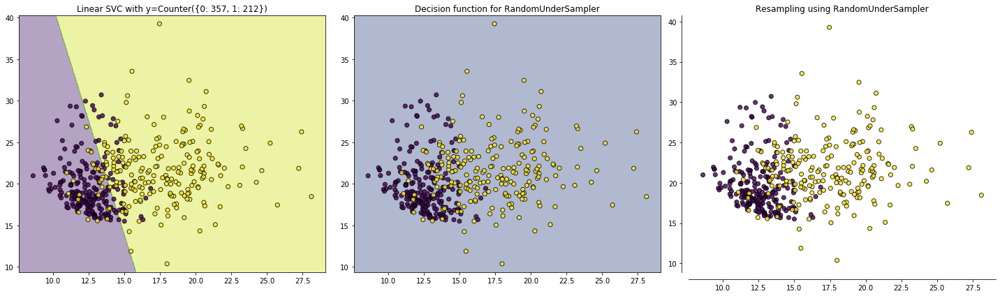

In [67]:
#com seleção
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))

clf = LinearSVC().fit(X_resampled, y_resampled)
plot_decision_function(X_resampled, y_resampled, clf, ax1)
ax1.set_title('Linear SVC with y={}'.format(Counter(y)))
sampler = RandomUnderSampler(random_state=0)
clf = make_pipeline(sampler, LinearSVC())
clf.fit(aux, y)
plot_decision_function(X_resampled, y_resampled, clf, ax2)
ax2.set_title('Decision function for {}'.format(sampler.__class__.__name__))
plot_resampling(X_resampled, y_resampled, sampler, ax3)
ax3.set_title('Resampling using {}'.format(sampler.__class__.__name__))
fig.tight_layout()

/usr/local/anaconda/lib/python3.7/site-packages/sklearn/svm/base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/anaconda/lib/python3.7/site-packages/sklearn/svm/base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



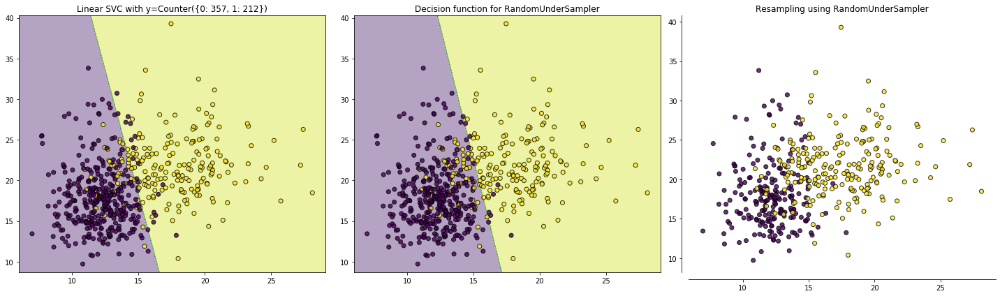

In [81]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))

clf = LinearSVC().fit(aux, y)
plot_decision_function(aux, y, clf, ax1)
ax1.set_title('Linear SVC with y={}'.format(Counter(y)))
sampler = RandomUnderSampler(random_state=0)
clf = make_pipeline(sampler, LinearSVC())
clf.fit(aux, y)
plot_decision_function(aux, y, clf, ax2)
ax2.set_title('Decision function for {}'.format(sampler.__class__.__name__))
plot_resampling(aux, y, sampler, ax3)
ax3.set_title('Resampling using {}'.format(sampler.__class__.__name__))
fig.tight_layout()

In [16]:
from imblearn.pipeline import make_pipeline

/usr/local/anaconda/lib/python3.7/site-packages/sklearn/svm/base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/anaconda/lib/python3.7/site-packages/sklearn/svm/base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/anaconda/lib/python3.7/site-packages/imblearn/under_sampling/_prototype_selection/_nearmiss.py:192: UserWarning:

The number of the samples to be selected is larger than the number of samples available. The balancing ratio cannot be ensure and all samples will be returned.

/usr/local/anaconda/lib/python3.7/site-packages/sklearn/svm/base.py:929: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/anaconda/lib/python3.7/site-packages/imblearn/under_sampling/_prototype_selection/_nearmiss.py:192: UserWarning:

The number of the samples to be selected is larger than the number of samples available. The balancing ratio 

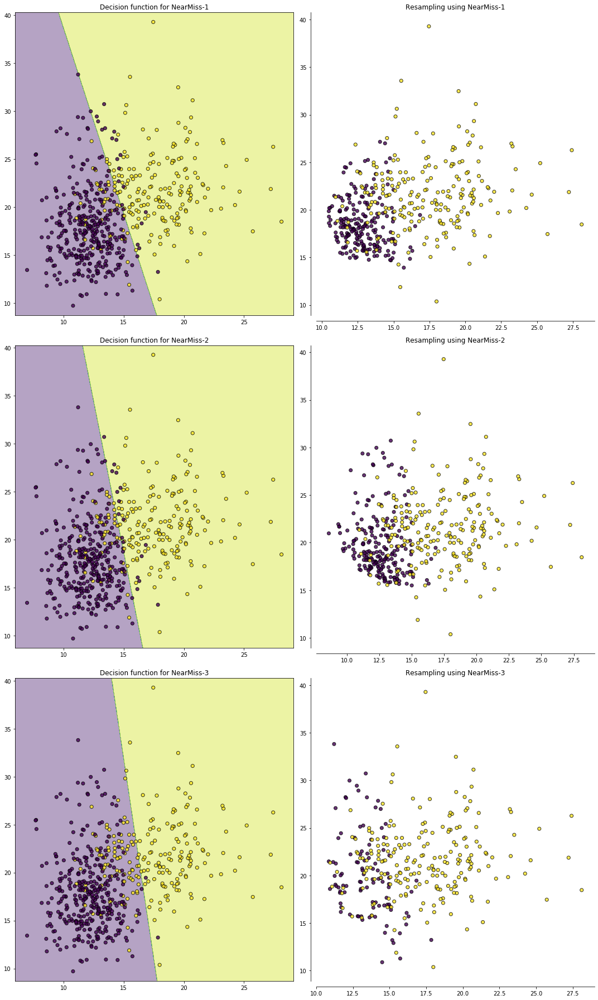

In [17]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2,
                                                         figsize=(15, 25))
# X, y = create_dataset(n_samples=5000, weights=(0.1, 0.2, 0.7), class_sep=0.8)

ax_arr = ((ax1, ax2), (ax3, ax4), (ax5, ax6))
for ax, sampler in zip(ax_arr, (NearMiss(version=1),
                                NearMiss(version=2),
                                NearMiss(version=3))):
    clf = make_pipeline(sampler, LinearSVC())
    clf.fit(aux, y)
    plot_decision_function(aux, y, clf, ax[0])
    ax[0].set_title('Decision function for {}-{}'.format(
        sampler.__class__.__name__, sampler.version))
    plot_resampling(aux, y, sampler, ax[1])
    ax[1].set_title('Resampling using {}-{}'.format(
        sampler.__class__.__name__, sampler.version))
fig.tight_layout()

In [18]:
from sklearn.neighbors import NearestNeighbors

In [19]:
def make_plot_despine(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.set_xlim([0., 3.5])
    ax.set_ylim([0., 3.5])
    ax.set_xlabel(r'$X_1$')
    ax.set_ylabel(r'$X_2$')
    ax.legend()

In [21]:
# fig, ax = plt.subplots(1, 1, figsize=(6, 6))
# ax.scatter(X_minority[:, 0], X_minority[:, 1],
#            label='Minority class', s=200, marker='_')
# ax.scatter(X_majority[:, 0], X_majority[:, 1],
#            label='Majority class', s=200, marker='+')

# nearest_neighbors = NearestNeighbors(n_neighbors=X_minority.shape[0])
# nearest_neighbors.fit(X_minority)
# dist, ind = nearest_neighbors.kneighbors(X_majority[:2, :])
# dist = dist[:, -3::]
# ind = ind[:, -3::]
# dist_avg = dist.sum(axis=1) / 3

# for positive_idx, (neighbors, distance, color) in enumerate(
#         zip(ind, dist_avg, ['g', 'r'])):
#     for make_plot, sample_idx in enumerate(neighbors):
#         ax.plot([X_majority[positive_idx, 0], X_minority[sample_idx, 0]],
#                 [X_majority[positive_idx, 1], X_minority[sample_idx, 1]],
#                 '--' + color, alpha=0.3,
#                 label='Avg. dist.={:.2f}'.format(distance)
#                 if make_plot == 0 else "")
# ax.set_title('NearMiss-2')
# make_plot_despine(ax)

In [36]:
def xgbc(x_train, y_train, x_test, y_test):
#     param_grid={
#             'C': [0.1, 1, 100, 1000],
#             'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10],
#             'gamma': [0.0001, 0.001, 0.005, 0.1, 1, 3, 5]
#         }
#     classifier = GridSearchCV(XGBClassifier(), param_grid, cv=5, scoring='neg_mean_squared_error', verbose=0, n_jobs=-1)
    classifier = XGBClassifier()
    classifier.fit(x_train, y_train)
    pred_xgb = classifier.predict(x_test)
    xgb_acc = accuracy_score(y_test, pred_xgb)
    cm = confusion_matrix(y_test,pred_xgb)

    #print('Confusion matrix\n',confusion_matrix(y_test,pred_xgb))
    return cm



In [42]:
# #kfolt sem seleção

# #kfold
# kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)
# aux = []
# for train_index, test_index in kf.split(X_train, y_train):
#     #print("TRAIN:", train_index, "TEST:", test_index)
#     resp = xgbc(X_train[train_index], y_train[train_index], X_train[test_index], y_train[test_index])
# #     X_train, X_test = X_resampled[train_index], X_resampled[test_index]
# #     y_train, y_test = y_resampled[train_index], y_resampled[test_index]
#     aux.append(resp)
# print( sum(aux))
# pre = sum(aux)
# #print( sum(aux)/10 )

# print("Accuracy",pre[0][0]/(pre[1][1] + pre[0][1]))
# print("precision",pre[1][1]/(pre[1][1] + pre[0][1]))
# print("recall",pre[1][1]/(pre[1][1] + pre[1][0]))

# aux

[[240   9]
 [ 10 139]]
Accuracy 0.16216216216216217
precision 0.9391891891891891
recall 0.9328859060402684


[array([[25,  0],
        [ 2, 13]]), array([[25,  0],
        [ 2, 13]]), array([[24,  1],
        [ 2, 13]]), array([[24,  1],
        [ 0, 15]]), array([[22,  3],
        [ 0, 15]]), array([[25,  0],
        [ 3, 12]]), array([[24,  1],
        [ 0, 15]]), array([[24,  1],
        [ 1, 14]]), array([[24,  1],
        [ 0, 15]]), array([[23,  1],
        [ 0, 14]])]

In [25]:
#kfold
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)
aux = []
for train_index, test_index in kf.split(X_resampled, y_resampled):
    #print("TRAIN:", train_index, "TEST:", test_index)
    resp = xgbc(X_resampled[train_index], y_resampled[train_index], X_resampled[test_index], y_resampled[test_index])
#     X_train, X_test = X_resampled[train_index], X_resampled[test_index]
#     y_train, y_test = y_resampled[train_index], y_resampled[test_index]
    aux.append(resp)
print( sum(aux))
pre = sum(aux)

print("Accuracy",pre[0][0]/(pre[1][1] + pre[0][1]))
print("precision",pre[1][1]/(pre[1][1] + pre[0][1]))
print("recall",pre[1][1]/(pre[1][1] + pre[1][0]))

aux

#fredman test

#inverter o kfold colocar antes de bakabcear a vase

[[189  23]
 [ 37 175]]
Accuracy 0.9545454545454546
precision 0.8838383838383839
recall 0.8254716981132075


[array([[19,  3],
        [ 1, 21]]), array([[16,  6],
        [ 5, 17]]), array([[19,  2],
        [ 4, 17]]), array([[21,  0],
        [ 5, 16]]), array([[17,  4],
        [ 4, 17]]), array([[18,  3],
        [ 4, 17]]), array([[19,  2],
        [ 3, 18]]), array([[19,  2],
        [ 3, 18]]), array([[21,  0],
        [ 5, 16]]), array([[20,  1],
        [ 3, 18]])]

In [ ]:
# [[186  26]
#  [ 32 180]]
# Accuracy 0.9029126213592233
# precision 0.8737864077669902
# recall 0.8490566037735849


# [[189  23]
#  [ 37 175]]
# Accuracy 0.9545454545454546
# precision 0.8838383838383839
# recall 0.8254716981132075

In [8]:
# #dividindo a base
# x = data.drop(['diagnosis'], axis=1)
# y = data.diagnosis

# X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

In [40]:
# concatTrain = pd.concat([X_train, y_train], axis=1)
# concatTrain.head()

In [111]:
# dataS = concatTrain['diagnosis']
# # dataS.head()sdfs
# # dataS = concatTrain[concatTrain.diagnosis==1]
# # dataS = dataS['diagnosis']
# dataS.head() 450.38

In [118]:
# noShowMar_clean = concatTreinoMar_clean[concatTreinoMar_clean.StatusReserva==1]#61748
# checkedoutMar_clean = concatTreinoMar_clean[concatTreinoMar_clean.StatusReserva==0]#219


Segundo I. Mani, I. Zhang, NearMiss adiciona algumas hurísticas para selecionar amostras. onde são implementados 3 diferentes tipos de heurísticas que podem ser selecionadas através do parâmetro version.

A NearMiss é baseada no algoritmo de knn. Portando os parametros n_neighbors e n_neighbors_ver3 aceitam classificadores derivados do KNeighborsMixin. Onde o primeiro parâmetro é usado para calcular a distância média dos vizinhos e o ultimo é usado para a pré-seleção das amostas 

In [68]:
# rus = NearMiss(version=2)
# X_resampled, y_resampled = rus.fit_resample(X_train, y_train)
# print(sorted(Counter(y_resampled).items()))

[(0, 149), (1, 149)]


### Sobre a formulação matemática

Sejam amostras positivas pertencentes à classe alvo e serem sub-amostras. Amostra negativa refere-se às amostras da classe minoritária ou seja , a classe mais sub-representada. 

#### Explicando um pouco sobre cada parâmetro

 - O NearMiss-1 seleciona as amostras positivas para as quais a distância média até as N amostras mais próximas da classe negativa é a menor
 
 - O NearMiss-2 seleciona as amostras positivas para as quais a distância média até as N amostras mais distantes da classe negativa é a menor.
 
 - O NearMiss-3 é um algoritmo de 2 etapas. Primeiro, para cada amostra negativa, seus M vizinhos mais próximos serão mantidos. em seguda , as amostras positivas selecionadas são aquelas cuja distância média aos N vizinhos mais próximos é a maior.
 

In [78]:
print('Accuracy Score: ' + str(xgb_acc))

print('Precision Score: ' + str(precision_score(y_test.values, pred_xgb)))

print('Recall Score: ' + str(recall_score(y_test.values, pred_xgb)))

print('F1 Score: ' + str(f1_score(y_test.values, pred_xgb)))

print('Classification Report: \n' + str(classification_report(y_test.values, pred_xgb)))

NameError: name 'xgb_acc' is not defined

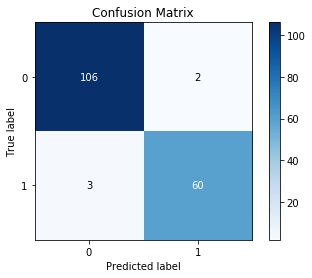

In [71]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test.values, pred_xgb)
plt.show()